## TRABAJO DE FIN DE GRADO
#### CUNEF UNIVERSIDAD Facultad de Empresa, Economía y Derecho
#### Analisis de Datos Financieros: YELP, Inc
##### Estudiante: Alba Quintero Huertas


Este notebook desarrolla un análisis econométrico completo del modelo CAPM (*Capital Asset Pricing Model*) aplicado a Yelp Inc. (YELP) para el período 2015–2025. El objetivo principal es estimar la beta de la empresa, analizar los supuestos del modelo, corregir posibles violaciones y evaluar si determinados eventos corporativos o macroeconómicos han generado cambios estructurales en la relación riesgo-rentabilidad.

El análisis sigue las siguientes etapas:
1. **S01** — Carga de datos de Yelp y del índice de referencia Russell 2000.
2. **S02** — Construcción de primas de riesgo y estimación del CAPM básico.
3. **S03** — Diagnóstico de los residuos (normalidad, heterocedasticidad, autocorrelación).
4. **S04** — Identificación y tratamiento de valores atípicos.
5. **S05** — Análisis de cambio estructural y selección del modelo final.
6. **S06** — Estudio de la estabilidad paramétrica del modelo.

In [1]:
# No warnings
import warnings
warnings.filterwarnings("ignore")


### <font color='red'>S01: Empresas y Datos</font>
#### Selección de Empresa: Yelp Inc. (YELP)

Se trabaja con **Yelp Inc.**, empresa de reseñas de negocios locales cotizada en el mercado estadounidense. Como índice de referencia de mercado se utiliza el **Russell 2000** (^RUT), que agrupa a las 2.000 empresas de menor capitalización bursátil del índice Russell 3000, siendo la referencia habitual para empresas de pequeña y mediana capitalización como Yelp.

A continuación se carga el archivo Excel con los datos históricos del Russell 2000, que servirá como base de comparación a lo largo del análisis.

In [2]:
import pandas as pd

## leer los datos del Russell_2000
# excel 
R2000 = pd.read_excel('Data/russell_2000_TFG26.xlsx')
R2000


,Ticker,Name,Sector,Price,Dividend Yield,5-Year Average Dividend Yield,Dividends Per Share (TTM),Market Cap ($M),Trailing P/E Ratio,Payout Ratio,Beta,52-Week High,52-Week Low
0,AAMI,0,NaN,54.96,NaN,0.00079,0.04,1961.144870,22.3365,0.012670,1.2967,55.10,22.58
1,AAOI,0,Technology,39.33,NaN,0.00000,0.00,1111.991262,NaN,0.000000,3.0814,41.96,9.71
2,AAT,0,Real Estate,18.28,0.074398,0.07003,1.36,1118.479993,18.1935,1.330802,1.0152,23.45,15.86
3,ABCB,0,Financial Services,82.08,0.010000,0.00823,0.80,5606.623868,14.0808,0.130345,1.1680,82.33,47.86
4,ABG,0,Consumer Cyclical,253.75,NaN,0.00000,0.90,4933.041593,8.7964,0.000000,1.2050,312.56,201.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1941,ZURA,0,NaN,6.24,NaN,0.00000,0.00,75.840000,NaN,0.000000,1.3310,6.41,0.97
1942,ZVRA,0,NaN,9.01,NaN,0.00000,0.00,508.366741,14.3911,0.000000,0.9404,13.16,6.19
1943,ZWS,0,NaN,46.77,0.010000,0.00716,0.38,7830.344774,40.7194,0.315653,1.0547,49.91,27.55
1944,ZYME,0,Healthcare,23.95,NaN,0.00000,0.00,1508.761720,NaN,0.000000,0.9296,28.49,9.03


#### Carga de Datos de Precios: Yelp Inc.

Se descargan los **precios mensuales ajustados** de Yelp Inc. (ticker: `YELP`) desde Yahoo Finance mediante la librería `yfinance`, para el período comprendido entre enero de 2015 y diciembre de 2025.

- **Frecuencia mensual** (`1mo`): reduce el ruido de los datos diarios y es la frecuencia estándar en estimaciones del modelo CAPM.
- **Precio ajustado** (`Adj Close`): incorpora los ajustes por splits y dividendos, garantizando la comparabilidad temporal de la serie.

Se utiliza `auto_adjust=False` para obtener tanto el precio de cierre ordinario como el precio ajustado de forma explícita. A continuación se muestran las primeras y últimas observaciones para confirmar que la descarga es correcta y cubre el período deseado.

In [3]:
# leer datos de Yfinance
# !pip install yfinance

import yfinance as yf

# leer datos de YELP
empresa='YELP'
inicio='2015-01-01' 
fin='2025-12-31'
periodo='1mo'  #--> mensual

precio=yf.download(empresa, start=inicio, end=fin, interval=periodo,auto_adjust=False)


[*********************100%***********************]  1 of 1 completed


In [4]:
print(precio.head())

Price       Adj Close      Close       High        Low       Open     Volume
Ticker           YELP       YELP       YELP       YELP       YELP       YELP
Date                                                                        
2015-01-01  52.470001  52.470001  56.990002  50.029999  55.459999   46298000
2015-02-01  48.000000  48.000000  57.700001  42.099998  52.939999   96079200
2015-03-01  47.349998  47.349998  48.980000  44.250000  48.020000   57952400
2015-04-01  39.389999  39.389999  52.509998  38.750000  47.250000   71843700
2015-05-01  47.910000  47.910000  50.990002  37.910000  39.310001  130533800


In [5]:
print(precio.tail())

Price       Adj Close      Close       High        Low       Open    Volume
Ticker           YELP       YELP       YELP       YELP       YELP      YELP
Date                                                                       
2025-08-01  31.620001  31.620001  34.639999  29.959999  34.180000  21933900
2025-09-01  31.200001  31.200001  32.310001  30.870001  31.170000  17281300
2025-10-01  32.980000  32.980000  34.000000  30.040001  30.920000  17967400
2025-11-01  28.910000  28.910000  34.490002  27.290001  32.980000  21198400
2025-12-01  30.389999  30.389999  31.719999  28.410000  28.620001  19871800


#### Cálculo de la Rentabilidad Logarítmica Mensual

Se calcula la **rentabilidad logarítmica mensual** de Yelp a partir del precio ajustado de cierre:

$$r_t = \ln\left(\frac{P_t}{P_{t-1}}\right)$$

El uso de la rentabilidad logarítmica tiene ventajas importantes en series financieras:
- Es **aditiva en el tiempo**: la rentabilidad acumulada es la suma de las rentabilidades individuales.
- Es **simétrica**: subidas y bajadas del mismo porcentaje producen rentabilidades de igual magnitud pero signo opuesto.
- Su distribución empírica suele aproximarse mejor a la normal que la rentabilidad aritmética.

In [6]:
import numpy as np

rent=np.log(precio['Adj Close']/precio['Adj Close'].shift(1))


#### Visualización Exploratoria

En esta sección se representan gráficamente la evolución del precio y la rentabilidad de Yelp y del Russell 2000. El análisis visual previo a la estimación permite identificar fases del ciclo bursátil, detectar episodios de alta volatilidad y evaluar la distribución empírica de las rentabilidades.

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

##### Evolución del Precio de Yelp (2015–2025)

Se representa la evolución del precio de cierre ajustado de Yelp. Este gráfico permite identificar las principales fases del ciclo bursátil: la caída desde máximos históricos (2014–2018), la estabilización relativa (2018–2020), el impacto del COVID-19 (2020) y la posterior recuperación y consolidación. La elevada volatilidad observada es característica de empresas de mediana capitalización del sector tecnológico.

<Figure size 1000x600 with 0 Axes>

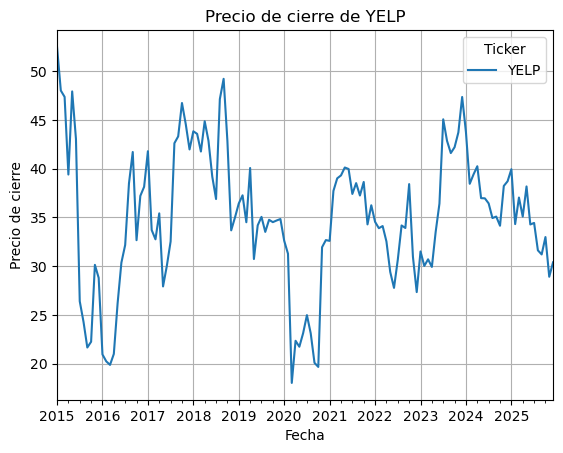

In [8]:
# Grafico del precio de YELP
plt.figure(figsize=(10, 6))
precio['Adj Close'].plot()
plt.title('Precio de cierre de YELP')
plt.xlabel('Fecha')
plt.ylabel('Precio de cierre')
plt.grid()
plt.savefig('output/Precio_YELP.png') # grabar el grafico
plt.show()

##### Rentabilidad Mensual de Yelp

Se representa la serie temporal de rentabilidades mensuales logarítmicas. La línea roja en cero facilita la identificación visual de meses con rentabilidades positivas y negativas. La dispersión de los valores alrededor de cero permite intuir la magnitud de la volatilidad mensual del activo y la presencia de valores extremos.

<Figure size 1000x600 with 0 Axes>

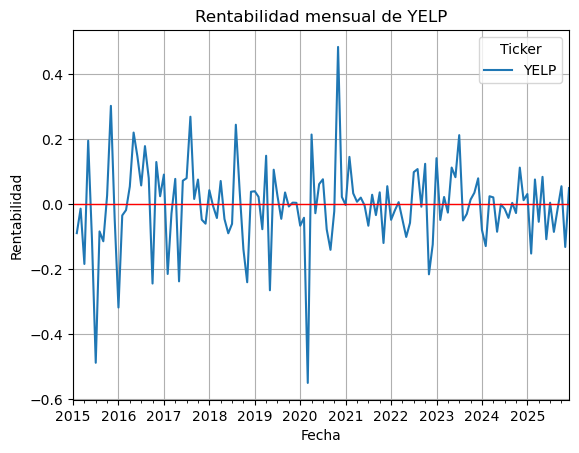

In [9]:
# Grafico de la rentabilidad de YELP
plt.figure(figsize=(10, 6))
rent.plot()
plt.title('Rentabilidad mensual de YELP')
plt.xlabel('Fecha')
plt.ylabel('Rentabilidad')
plt.axhline(0, color='red', lw=1) #linea en zero
plt.grid()
plt.savefig('output/Rentabilidad_YELP.png') # grabar el grafico
plt.show()

In [10]:
# crear un dataframe con la rentabilidad
df_rent=pd.DataFrame(rent)
df_rent.columns=['Rentabilidad']
df_rent

,Rentabilidad
Date,
2015-01-01,NaN
2015-02-01,-0.089041
2015-03-01,-0.013634
2015-04-01,-0.184055
2015-05-01,0.195812
...,...
2025-08-01,-0.085138
2025-09-01,-0.013372
2025-10-01,0.055483


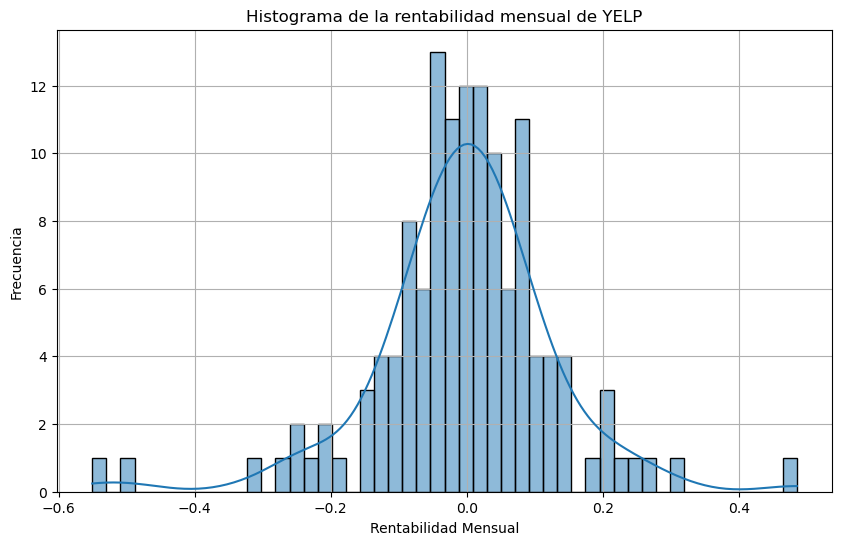

In [11]:
# Histograma de la rentabilidad diaria y densidad de probabilidad
plt.figure(figsize=(10, 6))
sns.histplot(data=df_rent, x='Rentabilidad', bins=50, kde=True)
plt.title('Histograma de la rentabilidad mensual de YELP')
plt.xlabel('Rentabilidad Mensual')
plt.ylabel('Frecuencia')
plt.grid()
plt.savefig('output/Histograma_Rentabilidad_YELP.png')
plt.show()

El histograma con curva KDE muestra que la distribución de rentabilidades de Yelp presenta **colas más pesadas que la distribución normal** (*leptocurtosis*) y posible asimetría negativa. Esto anticipa posibles problemas con el supuesto de normalidad de los residuos que se verificarán formalmente en S03.

#### Russell 2000 — Índice de Referencia de Mercado

El **Russell 2000** (^RUT) es el índice de referencia estándar para empresas de pequeña y mediana capitalización en EE. UU. Su elección como proxy de mercado en el modelo CAPM para Yelp se justifica porque Yelp pertenece a este segmento de capitalización y el Russell 2000 captura mejor la dinámica del mercado relevante que el S&P 500, dominado por megacaps tecnológicas.


Se descargan los precios mensuales del índice Russell 2000 (ticker `^RUT`) desde Yahoo Finance para el período 2015–2025, usando los mismos parámetros que la descarga de Yelp para garantizar la alineación temporal de ambas series.

In [12]:
# leer datos de R2000
ticker='^RUT'             
inicio='2015-01-01' 
fin='2025-12-31'
periodo='1mo'

indice=yf.download(ticker, start=inicio, end=fin, interval=periodo,auto_adjust=False)


[*********************100%***********************]  1 of 1 completed


#### Evolución del Precio del Russell 2000

Se representa la trayectoria del índice Russell 2000, que sirve como referencia del ciclo de mercado al que está expuesto Yelp. La comparación visual entre esta serie y la de Yelp permite apreciar si la empresa sigue de forma general al mercado o presenta dinámicas propias diferenciadas, como períodos de caída más pronunciada o menor recuperación.

<Figure size 1000x600 with 0 Axes>

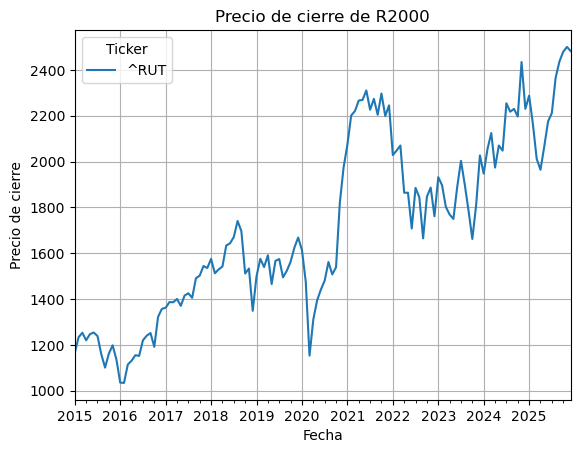

In [13]:
# Grafico del precio de R2000
plt.figure(figsize=(10, 6))
indice['Adj Close'].plot()
plt.title('Precio de cierre de R2000')
plt.xlabel('Fecha')
plt.ylabel('Precio de cierre')
plt.grid()
plt.savefig('output/Precio_R2000.png') # grabar el grafico
plt.show()

In [14]:
# calcular la rentabilidad diaria logaritmica

rentI=np.log(indice['Adj Close']/indice['Adj Close'].shift(1))
# crear un dataframe con la rentabilidad
df_rentI=pd.DataFrame(rentI)
df_rentI.columns=['Rentabilidad']
df_rentI

,Rentabilidad
Date,
2015-01-01,NaN
2015-02-01,0.056694
2015-03-01,0.015607
2015-04-01,-0.026400
2015-05-01,0.021406
...,...
2025-08-01,0.067639
2025-09-01,0.029176
2025-10-01,0.017454


#### Rentabilidad Mensual del Russell 2000

Esta serie refleja el comportamiento del mercado a lo largo del período analizado. Destaca la caída pronunciada de marzo de 2020 (COVID-19) y la fuerte recuperación del segundo semestre de ese año, eventos que serán relevantes en el análisis de cambio estructural de la S05. La menor dispersión respecto a Yelp refleja el efecto de diversificación del índice.

<Figure size 1000x600 with 0 Axes>

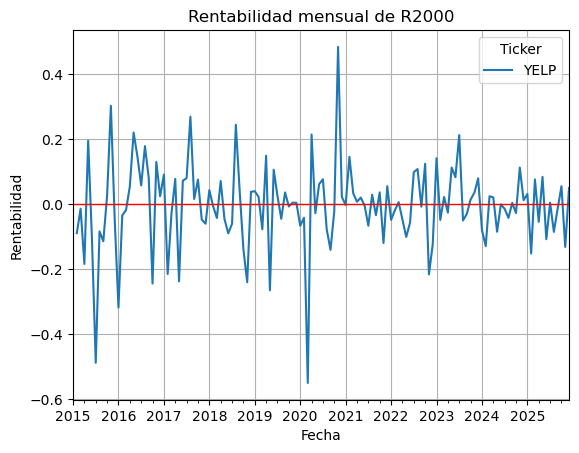

In [15]:
# Grafico de la rentabilidad de R2000
plt.figure(figsize=(10, 6))
rent.plot()
plt.title('Rentabilidad mensual de R2000')
plt.xlabel('Fecha')
plt.ylabel('Rentabilidad')
plt.axhline(0, color='red', lw=1) #linea en zero
plt.grid()
plt.savefig('output/Rentabilidad_R2000.png') # grabar el grafico
plt.show()

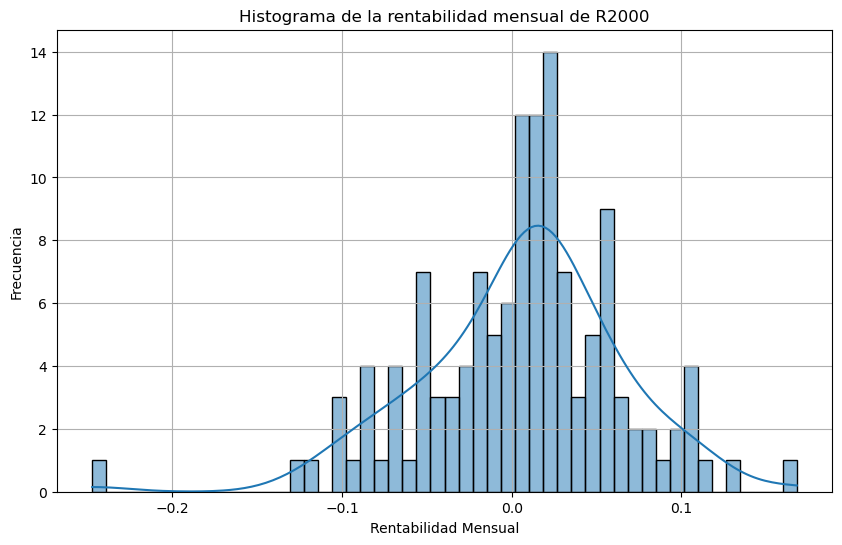

In [16]:
# Histograma de la rentabilidad diaria y densidad de probabilidad
plt.figure(figsize=(10, 6))
sns.histplot(data=df_rentI, x='Rentabilidad', bins=50, kde=True)
plt.title('Histograma de la rentabilidad mensual de R2000')
plt.xlabel('Rentabilidad Mensual')
plt.ylabel('Frecuencia')
plt.grid()
plt.savefig('output/Histograma_Rentabilidad_R2000.png')
plt.show()

El histograma del Russell 2000 muestra una distribución más concentrada en torno a cero que la de Yelp, confirmando que el índice tiene **menor volatilidad** que la acción individual. Esta diferencia es coherente con el efecto de diversificación: el riesgo idiosincrático de cada empresa se cancela en el índice, quedando solo el riesgo sistemático.

#### Construcción del DataFrame Conjunto

Se consolida un único DataFrame combinando los precios y rentabilidades de Yelp y del Russell 2000. Esta estructura tabular facilita el análisis de correlación, la visualización conjunta y la posterior estimación del modelo CAPM, garantizando la alineación perfecta por fechas de ambas series.

In [17]:
# Crear un dataframe con los precios y las rentabildades
df=pd.DataFrame()
df['YELP']=precio['Adj Close']
df['R2000']=indice['Adj Close']
df['Rentabilidad_YELP']=rent
df['Rentabilidad_R2000']=rentI
df



,YELP,R2000,Rentabilidad_YELP,Rentabilidad_R2000
Date,,,,
2015-01-01,52.470001,1165.390015,NaN,NaN
2015-02-01,48.000000,1233.369995,-0.089041,0.056694
2015-03-01,47.349998,1252.770020,-0.013634,0.015607
2015-04-01,39.389999,1220.130005,-0.184055,-0.026400
2015-05-01,47.910000,1246.530029,0.195812,0.021406
...,...,...,...,...
2025-08-01,31.620001,2366.419922,-0.085138,0.067639
2025-09-01,31.200001,2436.479980,-0.013372,0.029176
2025-10-01,32.980000,2479.379883,0.055483,0.017454


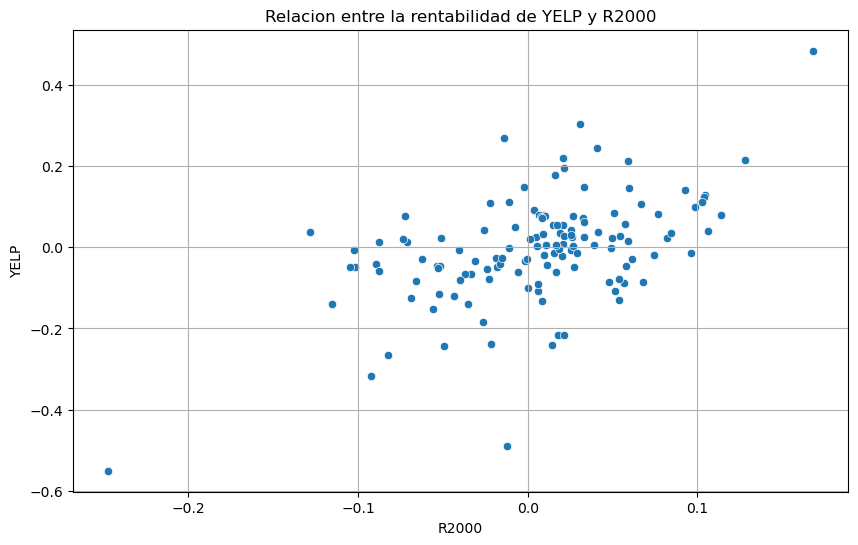

In [18]:
# scatter del russell 2000 y YELP
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Rentabilidad_R2000', y='Rentabilidad_YELP')
plt.title('Relacion entre la rentabilidad de YELP y R2000')
plt.xlabel('R2000')
plt.ylabel('YELP')
plt.grid()
plt.savefig('output/YELP_R2000.png')
plt.show()


**Interpretación del diagrama de dispersión:** La nube de puntos muestra una **correlación positiva** entre las rentabilidades de Yelp y las del Russell 2000, coherente con la existencia de riesgo sistemático (beta > 0). La dispersión considerable indica que una parte importante de la variabilidad de Yelp no se explica por el mercado (riesgo idiosincrático elevado), lo que es habitual en empresas de mediana capitalización.

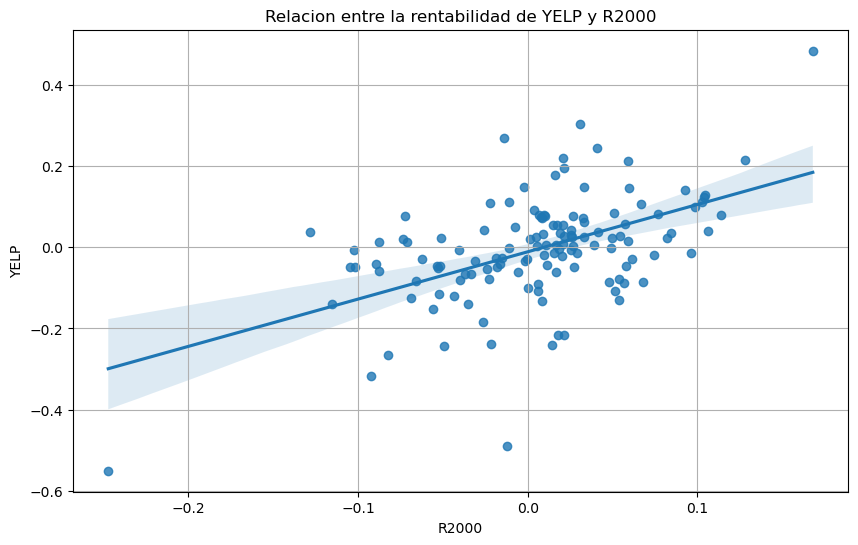

In [19]:
# scatter del russell 2000 y YELP con recta de regersión
plt.figure(figsize=(10, 6))
sns.regplot(data=df, x='Rentabilidad_R2000', y='Rentabilidad_YELP')
plt.title('Relacion entre la rentabilidad de YELP y R2000')
plt.xlabel('R2000')
plt.ylabel('YELP')
# mostar regresion
plt.savefig('output/YELP_R2000_recta.png')
plt.grid()
plt.show()


La pendiente de la recta de regresión anticipada visualmente sugiere una **beta mayor que 1**, lo que indicaría que Yelp amplifica los movimientos del mercado. Este valor se estimará formalmente mediante el modelo CAPM en la sesión S02.

Se guarda el DataFrame combinado en un archivo CSV para poder retomar el análisis en sesiones posteriores sin necesidad de volver a descargar los datos de Yahoo Finance, garantizando la reproducibilidad del trabajo.

In [20]:
#Guardar datos
df.to_csv('Data/datos_YELP_tfg.csv', index=True)


### <font color='red'>S02: Datos y Primera Regresión CAPM</font>

En esta sesión se construyen las **primas de riesgo** de Yelp y del mercado, se incorporan los factores de Fama-French como fuente de la tasa libre de riesgo, y se estima el modelo CAPM básico mediante MCO.

El modelo CAPM a estimar es:

$$r_{YELP,t} - r_f = \alpha + \beta \cdot (r_{M,t} - r_f) + \varepsilon_t$$

donde $r_f$ es la tasa libre de riesgo mensual (RF de Fama-French), $r_{M,t}$ es la rentabilidad del Russell 2000, $\alpha$ es el alpha de Jensen (rentabilidad anormal) y $\beta$ mide la sensibilidad sistemática de Yelp al mercado.

In [21]:
import datetime

In [22]:
# Definir el período de 10 años
end_date = '2025-12-31'
start_date = '2015-01-01' 

Se carga el archivo CSV generado en la sesión anterior y se establece la columna `Date` como índice del DataFrame.

In [23]:
returns = pd.read_csv('Data/datos_YELP_tfg.csv')
#index date
returns['Date'] = pd.to_datetime(returns['Date'])
returns.set_index('Date', inplace=True)
returns

,YELP,R2000,Rentabilidad_YELP,Rentabilidad_R2000
Date,,,,
2015-01-01,52.470001,1165.390015,NaN,NaN
2015-02-01,48.000000,1233.369995,-0.089041,0.056694
2015-03-01,47.349998,1252.770020,-0.013634,0.015607
2015-04-01,39.389999,1220.130005,-0.184055,-0.026400
2015-05-01,47.910000,1246.530029,0.195812,0.021406
...,...,...,...,...
2025-08-01,31.620001,2366.419922,-0.085138,0.067639
2025-09-01,31.200001,2436.479980,-0.013372,0.029176
2025-10-01,32.980000,2479.379883,0.055483,0.017454


#### Descarga de Factores de Fama-French

Se descargan los **factores de Fama-French de tres factores** desde el repositorio oficial de Kenneth French a través de `pandas_datareader`. Los datos obtenidos incluyen:
- **Mkt-RF**: prima de mercado (rentabilidad del mercado menos tasa libre de riesgo).
- **SMB** (*Small Minus Big*): prima de tamaño — diferencia entre carteras de pequeña y gran capitalización.
- **HML** (*High Minus Low*): prima de valor — diferencia entre carteras de alto y bajo ratio book-to-market.
- **RF**: tasa libre de riesgo mensual (letras del Tesoro de EE. UU. a un mes).

Los factores vienen en porcentaje y se convierten a decimales dividiendo entre 100.

In [24]:
# !pip install pandas-datareader
# Obtener datos de Fama-French (descarga desde web)
import pandas_datareader.data as web
# Obtener datos de Fama-French desde DataReader
fama_french = web.DataReader("F-F_Research_Data_Factors", "famafrench", start_date, end_date)[0]

# Convertir índice a formato de fecha
fama_french.index = fama_french.index.to_timestamp()

# Convertir retornos de Fama-French a porcentajes
fama_french = fama_french / 100

In [25]:
fama_french

,Mkt-RF,SMB,HML,RF
Date,,,,
2015-01-01,-0.0310,-0.0059,-0.0345,0.0000
2015-02-01,0.0613,0.0061,-0.0179,0.0000
2015-03-01,-0.0111,0.0305,-0.0038,0.0000
2015-04-01,0.0059,-0.0299,0.0180,0.0000
2015-05-01,0.0137,0.0095,-0.0111,0.0000
...,...,...,...,...
2025-08-01,0.0184,0.0380,0.0446,0.0038
2025-09-01,0.0339,-0.0190,-0.0094,0.0033
2025-10-01,0.0196,-0.0082,-0.0280,0.0037


#### Construcción de las Primas de Riesgo

Se alinean las rentabilidades de Yelp y del Russell 2000 con los factores de Fama-French mediante un *inner join* por fechas, conservando solo los meses con datos disponibles en todas las fuentes.

Las **primas de riesgo** se obtienen restando la tasa libre de riesgo a cada serie:
- **Market Premium** = Rentabilidad R2000 − RF → variable independiente del CAPM.
- **YELP Premium** = Rentabilidad YELP − RF → variable dependiente del CAPM.

Esta transformación elimina el componente libre de riesgo, de modo que la pendiente de la regresión captura exclusivamente la sensibilidad al riesgo sistemático.

In [26]:
# Alinear fechas con Fama-French
returns = returns.join(fama_french, how="inner")

# Calcular primas de mercado y de YELP
returns["Market Premium"] = returns["Rentabilidad_R2000"] - returns["RF"]  #esta va a ser la x"
returns["YELP Premium"] = returns["Rentabilidad_YELP"] - returns["RF"]   #esta va a ser la y

# Mostrar resultados
returns

,YELP,R2000,Rentabilidad_YELP,Rentabilidad_R2000,Mkt-RF,SMB,HML,RF,Market Premium,YELP Premium
Date,,,,,,,,,,
2015-01-01,52.470001,1165.390015,NaN,NaN,-0.0310,-0.0059,-0.0345,0.0000,NaN,NaN
2015-02-01,48.000000,1233.369995,-0.089041,0.056694,0.0613,0.0061,-0.0179,0.0000,0.056694,-0.089041
2015-03-01,47.349998,1252.770020,-0.013634,0.015607,-0.0111,0.0305,-0.0038,0.0000,0.015607,-0.013634
2015-04-01,39.389999,1220.130005,-0.184055,-0.026400,0.0059,-0.0299,0.0180,0.0000,-0.026400,-0.184055
2015-05-01,47.910000,1246.530029,0.195812,0.021406,0.0137,0.0095,-0.0111,0.0000,0.021406,0.195812
...,...,...,...,...,...,...,...,...,...,...
2025-08-01,31.620001,2366.419922,-0.085138,0.067639,0.0184,0.0380,0.0446,0.0038,0.063839,-0.088938
2025-09-01,31.200001,2436.479980,-0.013372,0.029176,0.0339,-0.0190,-0.0094,0.0033,0.025876,-0.016672
2025-10-01,32.980000,2479.379883,0.055483,0.017454,0.0196,-0.0082,-0.0280,0.0037,0.013754,0.051783


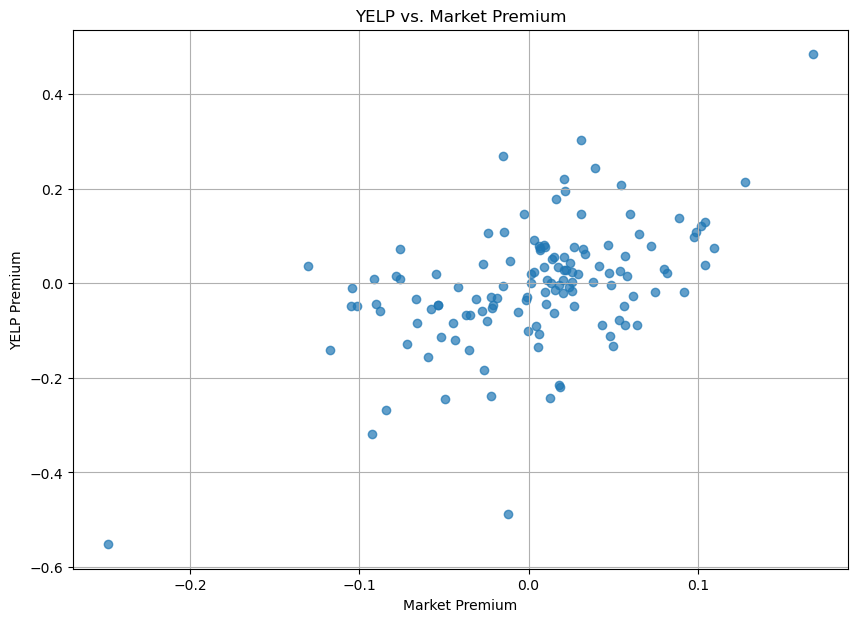

In [27]:
# Gráfico XY
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))
plt.scatter(returns["Market Premium"], returns["YELP Premium"], alpha=0.7)
plt.xlabel("Market Premium")
plt.ylabel("YELP Premium")
plt.title("YELP vs. Market Premium")
plt.grid(True)
plt.show()


**Interpretación:** El diagrama de dispersión de primas muestra una relación positiva y moderada entre la prima de mercado y la prima de Yelp, confirmando la existencia de una relación lineal que el CAPM trata de cuantificar. 

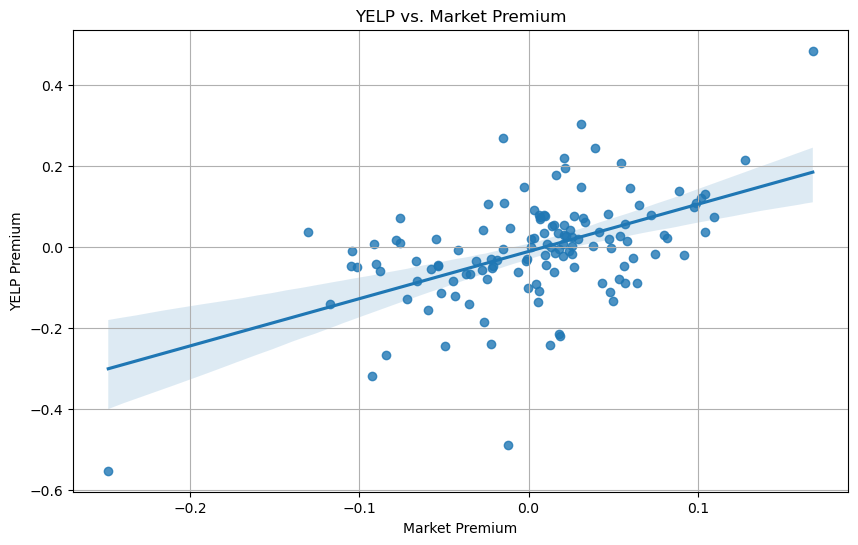

In [28]:
# Grafico con regresión lineal usando sns.regplot
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.regplot(x="Market Premium", y="YELP Premium", data=returns)
plt.xlabel("Market Premium")
plt.ylabel("YELP Premium")
plt.title("YELP vs. Market Premium")
plt.grid(True)
plt.show()
# la idea es estimar esa linea de regresión

La recta de regresión ajustada anticipa visualmente la pendiente (beta) del modelo CAPM. La banda de confianza sombreada alrededor de la recta refleja la incertidumbre de la estimación.

#### Estimación del Modelo CAPM Inicial

In [29]:
# Estimar la regresión 
import statsmodels.api as sm
modelo_capm = sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium']", data=returns).fit()
modelo_capm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     returns['YELP Premium']   R-squared:                       0.272
Model:                                 OLS   Adj. R-squared:                  0.267
Method:                      Least Squares   F-statistic:                     48.24
Date:                     Wed, 20 May 2026   Prob (F-statistic):           1.67e-10
Time:                             20:33:58   Log-Likelihood:                 101.01
No. Observations:                      131   AIC:                            -198.0
Df Residuals:                          129   BIC:                            -192.3
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                    -0.0106      0.010     -1.076      0.284      -0.030       0.009
returns['Market Premium']     1.1657      0.168      6.945      0.000       0.834       1.498
==============================================================================
Omnibus:                       12.569   Durbin-Watson:                   2.188
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               24.600
Skew:                          -0.369   Prob(JB):                     4.55e-06
Kurtosis:                       4.991   Cond. No.                         17.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

El resumen de resultados muestra:
- **Intercept (α)**: alpha de Jensen. Si es significativamente distinto de cero, indica rentabilidad anormal.
- **Market Premium (β)**: sensibilidad al mercado. Un valor > 1 indica que Yelp amplifica los movimientos del mercado.
- **R²**: proporción de la variabilidad de la prima de Yelp explicada por la prima de mercado.

Los errores estándar de esta estimación inicial asumen homocedasticidad y ausencia de autocorrelación. Estos supuestos serán contrastados formalmente en la S03 antes de extraer conclusiones de inferencia.

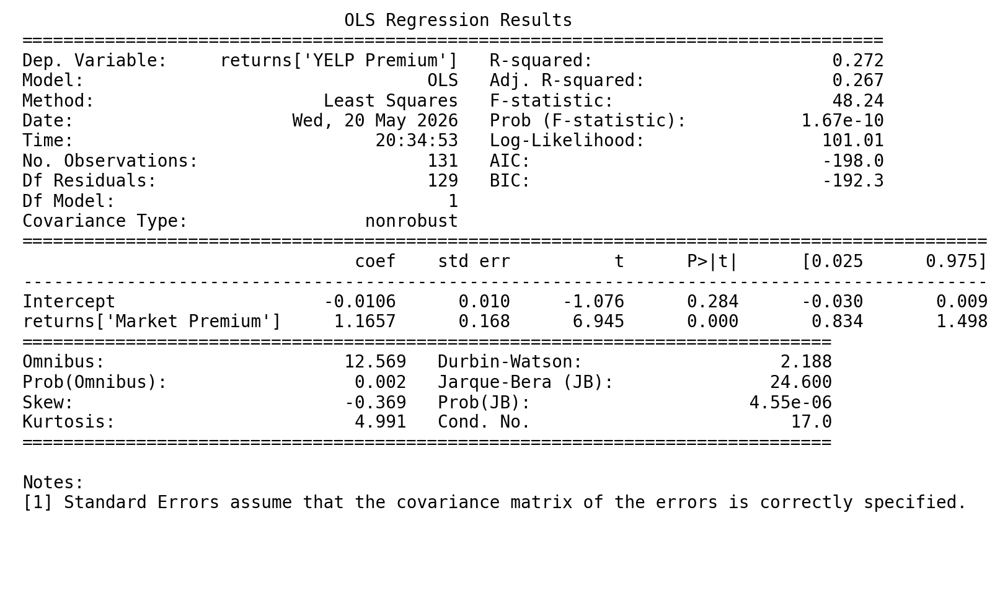

In [30]:
plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.99, modelo_capm.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/regresion_capm_01.png')

In [31]:
# save data como dataframe
returns.to_csv('Data/returns.csv')

### <font color='red'>S03: Diagnóstico de los Residuos del Modelo CAPM</font>

Para que la inferencia basada en MCO sea válida, los residuos del modelo deben cumplir los siguientes supuestos:
1. **Normalidad**: los residuos siguen una distribución normal → permite el uso de tests t y F estándar.
2. **Homocedasticidad**: la varianza de los residuos es constante → errores estándar insesgados.
3. **Ausencia de autocorrelación**: los residuos no están correlacionados entre sí → inferencia válida.

El incumplimiento de alguno de estos supuestos no invalida la estimación de los coeficientes (que siguen siendo insesgados bajo MCO), pero sí **invalida la inferencia estándar**, haciendo necesario aplicar correcciones robustas.

In [32]:
# Eliminar NA`s
returns=returns.dropna()

Los residuos del modelo CAPM inicial representan la **rentabilidad de Yelp no explicada por el mercado** en cada mes: $\hat{\varepsilon}_t = (r_{YELP,t} - r_f) - \hat{\alpha} - \hat{\beta}(r_{M,t} - r_f)$. Se añaden al DataFrame para facilitar su análisis.

In [33]:
# Generar los residuos
# returns.index=returns['Date']
returns['residuos'] = modelo_capm.resid.values
returns

,YELP,R2000,Rentabilidad_YELP,Rentabilidad_R2000,Mkt-RF,SMB,HML,RF,Market Premium,YELP Premium,residuos
Date,,,,,,,,,,,
2015-02-01,48.000000,1233.369995,-0.089041,0.056694,0.0613,0.0061,-0.0179,0.0000,0.056694,-0.089041,-0.144496
2015-03-01,47.349998,1252.770020,-0.013634,0.015607,-0.0111,0.0305,-0.0038,0.0000,0.015607,-0.013634,-0.021195
2015-04-01,39.389999,1220.130005,-0.184055,-0.026400,0.0059,-0.0299,0.0180,0.0000,-0.026400,-0.184055,-0.142650
2015-05-01,47.910000,1246.530029,0.195812,0.021406,0.0137,0.0095,-0.0111,0.0000,0.021406,0.195812,0.181491
2015-06-01,43.029999,1253.949951,-0.107427,0.005935,-0.0152,0.0294,-0.0082,0.0000,0.005935,-0.107427,-0.103713
...,...,...,...,...,...,...,...,...,...,...,...
2025-08-01,31.620001,2366.419922,-0.085138,0.067639,0.0184,0.0380,0.0446,0.0038,0.063839,-0.088938,-0.152723
2025-09-01,31.200001,2436.479980,-0.013372,0.029176,0.0339,-0.0190,-0.0094,0.0033,0.025876,-0.016672,-0.036203
2025-10-01,32.980000,2479.379883,0.055483,0.017454,0.0196,-0.0082,-0.0280,0.0037,0.013754,0.051783,0.046382


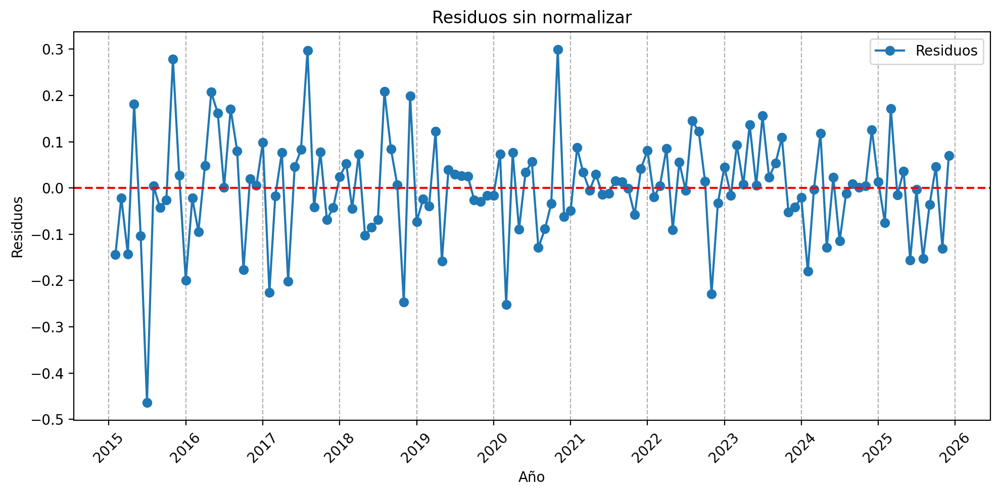

In [34]:
import matplotlib.dates as mdates

# Primero,  el índice sea de tipo datetime
if not isinstance(returns.index, pd.DatetimeIndex):
    # Si tu índice no es de tipo datetime, conviértelo
    returns.index = pd.to_datetime(returns.index)

# Configuración de los ticks y el grid en el inicio de cada año
year_locator = mdates.YearLocator()  # Localizador para cada inicio de año
year_formatter = mdates.DateFormatter('%Y')  # Formateador para mostrar solo el año

# Graficar residuos sin normalizar
plt.figure(figsize=(10, 5))
plt.plot(returns['residuos'], marker='o', linestyle='-', label='Residuos')
plt.axhline(0, color='red', linestyle='--')

# Configurar el eje x
ax = plt.gca()
ax.xaxis.set_major_locator(year_locator)  # Ticks en cada año
ax.xaxis.set_major_formatter(year_formatter)  # Mostrar solo el año
plt.grid(True, which='major', axis='x', linestyle='--')  # Grid en los inicios de año

# Rotar las etiquetas del eje x si  para mayor claridad
plt.xticks(rotation=45)

plt.title('Residuos sin normalizar')
plt.xlabel('Año')
plt.ylabel('Residuos')
plt.legend()
plt.tight_layout()  # Ajustar el diseño para evitar recortes
plt.savefig('output/residuos_sin_normalizar.png') # grabar el grafico
plt.show()

**Interpretación:** Los residuos sin normalizar fluctúan alrededor de cero sin tendencia clara, señal positiva de ausencia de sesgo sistemático. Sin embargo, se aprecian algunos valores extremos que sobresalen notablemente de la variación habitual. Estas observaciones serán identificadas y tratadas en la S04.

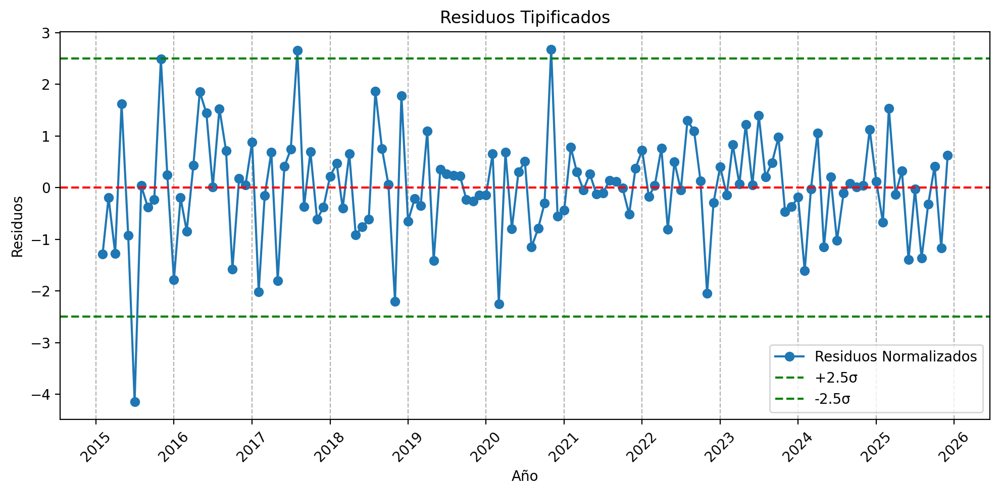

In [35]:
# Normalización de los residuos
returns['residuos_normalizados'] = (returns['residuos'] - np.mean(returns['residuos'])) / np.std(returns['residuos'])

plt.figure(figsize=(10, 5))
plt.plot(returns['residuos_normalizados'], marker='o', linestyle='-', label='Residuos Normalizados')
plt.axhline(0, color='red', linestyle='--')
plt.axhline(2.5, color='green', linestyle='--', label='+2.5σ')
plt.axhline(-2.5, color='green', linestyle='--', label='-2.5σ')

# Configurar el eje x
ax = plt.gca()
ax.xaxis.set_major_locator(year_locator)  # Ticks en cada año
ax.xaxis.set_major_formatter(year_formatter)  # Mostrar solo el año
plt.grid(True, which='major', axis='x', linestyle='--')  # Grid en los inicios de año

# Rotar las etiquetas del eje x si  para mayor claridad
plt.xticks(rotation=45)

plt.title('Residuos Tipificados')
plt.xlabel('Año')
plt.ylabel('Residuos')
plt.legend()
plt.tight_layout()  # Ajustar el diseño para evitar recortes
plt.savefig('output/residuos_tipificados.png') # grabar el grafico
plt.show()

Los residuos tipificados (media 0, desviación típica 1) permiten identificar con precisión qué observaciones superan el umbral de **±2,5 desviaciones típicas**, criterio estándar para considerar un valor como atípico potencial. Las líneas verdes delimitan visualmente esta banda crítica.

#### 1. Contraste de Normalidad

Se aplican tres análisis complementarios: el test de Jarque-Bera (contraste formal), el gráfico Q-Q (análisis visual) y el histograma con KDE.

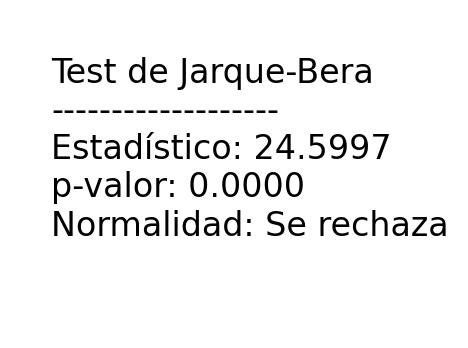

In [36]:
import scipy.stats as stats

from statsmodels.stats.diagnostic import het_breuschpagan, acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import seaborn as sns

# Obtener los residuos
residuos = modelo_capm.resid

# 1. Análisis de Normalidad
# ------------------------

# Test de Jarque-Bera para normalidad
jb_test = sm.stats.jarque_bera(residuos)

resultado = (
    f"Test de Jarque-Bera\n"
    f"-------------------\n"
    f"Estadístico: {jb_test[0]:.4f}\n"
    f"p-valor: {jb_test[1]:.4f}\n"
    f"Normalidad: {'Se rechaza' if jb_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_jarque_bera.png', bbox_inches='tight', dpi=300)

**Test de Jarque-Bera**: contrasta si los residuos provienen de una distribución normal combinando los estadísticos de **asimetría** (*skewness*) y **curtosis** (*kurtosis*). La hipótesis nula (H₀) es la normalidad; un p-valor < 0,05 lleva a su rechazo.

Se rechaza la normalidad, por tanto conviene investigar si se debe a valores atípicos (tratados en S04) o a una característica estructural de los residuos que requiera corrección robusta (Newey-West, S05).

<Figure size 2000x1200 with 0 Axes>

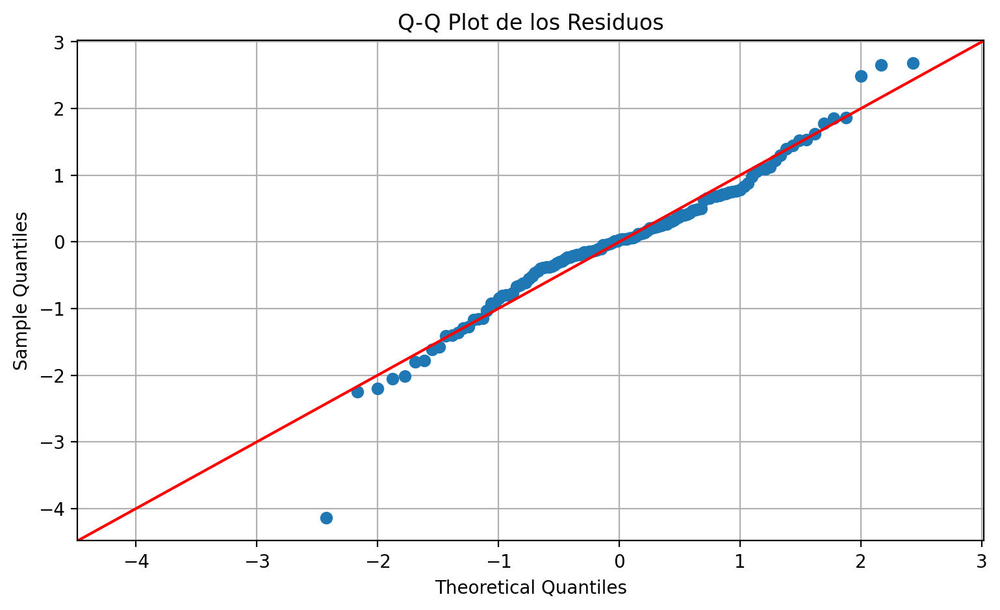

In [37]:
# Gráfico Q-Q Plot
plt.figure(figsize=(10, 6))
fig = sm.qqplot(residuos, stats.norm, line='45', fit=True)
plt.title('Q-Q Plot de los Residuos')
plt.grid(True)
plt.savefig('output/residuos_qqplot.png') # grabar el grafico
plt.show()

**Interpretación del Q-Q Plot:** Si los residuos fueran perfectamente normales, todos los puntos caerían sobre la línea de 45°. Las desviaciones en los extremos (colas) indican distribuciones con colas más pesadas (*leptocurtosis*). Los puntos que se alejan notablemente de la línea corresponden a los valores atípicos ya identificados visualmente.

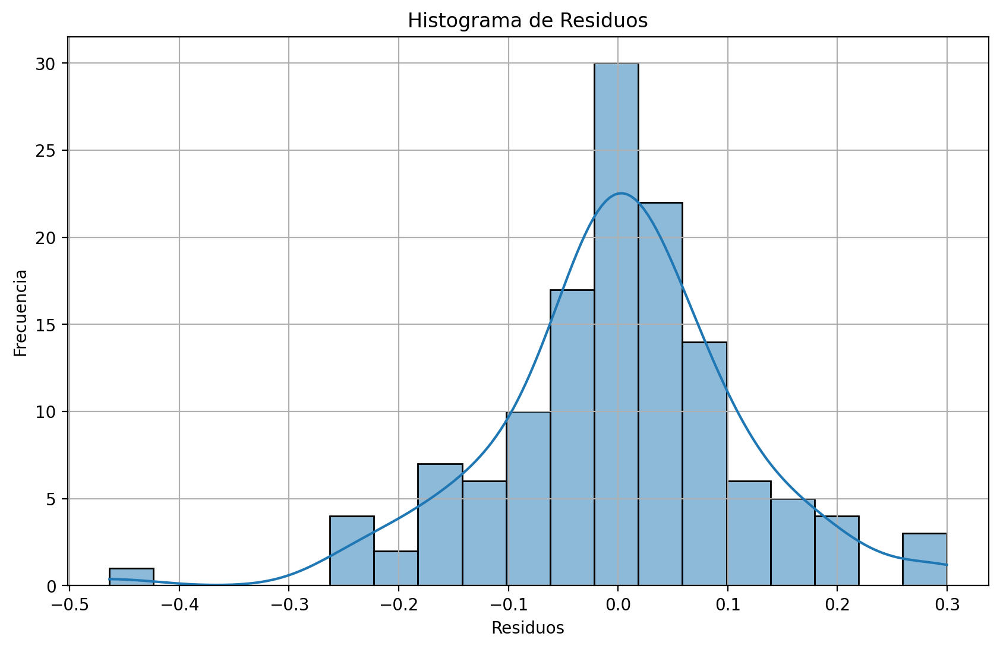

In [38]:
# Histograma de residuos
plt.figure(figsize=(10, 6))
sns.histplot(residuos, kde=True)
plt.title('Histograma de Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.savefig('output/residuos_histograma.png') # grabar el grafico
plt.show()

El histograma con curva KDE confirma visualmente los resultados de los tests formales. Un pico alto y estrecho con colas largas es evidencia de *leptocurtosis*, la irregularidad más habitual en series de rentabilidades financieras.

#### 2. Contraste de Heterocedasticidad

La **homocedasticidad** implica $\text{Var}(\varepsilon_t) = \sigma^2$ constante. Su violación hace que los errores estándar de MCO sean ineficientes e invalida los tests de significatividad. Se aplican los tests de Breusch-Pagan (heterocedasticidad lineal) y White (heterocedasticidad general).

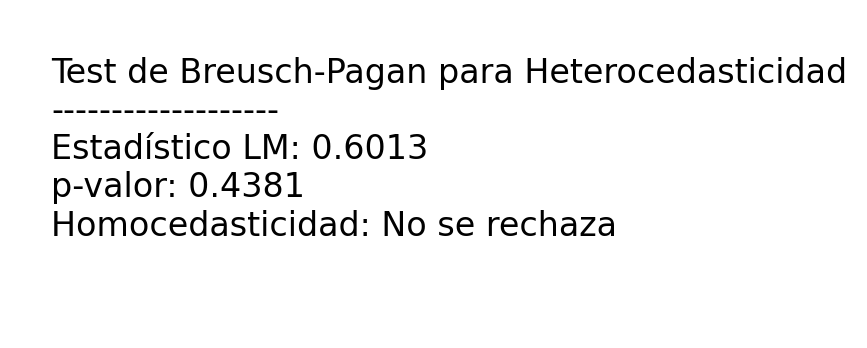

In [39]:
# 2. Análisis de Heterocedasticidad
# ---------------------------------

# Test de Breusch-Pagan
bp_test = het_breuschpagan(residuos, modelo_capm.model.exog)
resultado = (
    f"Test de Breusch-Pagan para Heterocedasticidad\n"
    f"-------------------\n"
    f"Estadístico LM: {bp_test[0]:.4f}\n"
    f"p-valor: {bp_test[1]:.4f}\n"
    f"Homocedasticidad: {'Se rechaza' if bp_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_breusch-pagan.png', bbox_inches='tight', dpi=300)

**Test de Breusch-Pagan:** H₀ es homocedasticidad. Un p-valor < 0,05 indica que la varianza de los residuos depende linealmente de las variables explicativas. Es habitual en series financieras que incluyen episodios de alta volatilidad como el COVID-19.

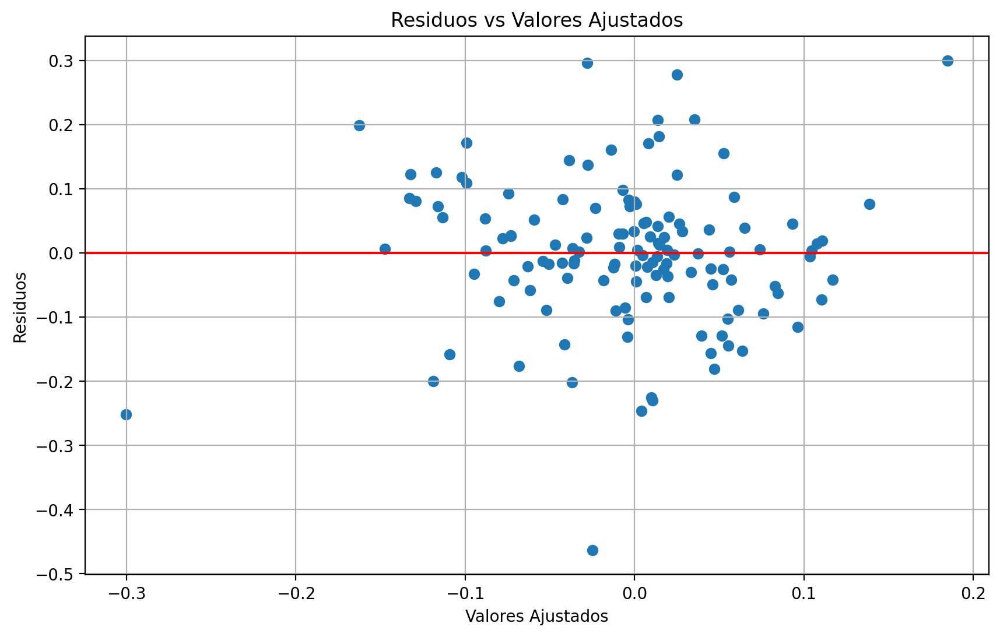

In [40]:
# Gráfico de residuos vs valores ajustados
plt.figure(figsize=(10, 6))
plt.scatter(modelo_capm.fittedvalues, residuos)
plt.axhline(y=0, color='r', linestyle='-')
plt.title('Residuos vs Valores Ajustados')
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.grid(True)
plt.savefig('output/residuos_valoresajustados.png') # grabar el grafico
plt.show()


**Interpretación del gráfico residuos vs. valores ajustados:** Si existe homocedasticidad, los puntos deben dispersarse aleatoriamente alrededor de cero sin ningún patrón. Un patrón en forma de embudo (mayor dispersión para ciertos valores ajustados) es evidencia visual de heterocedasticidad.

Imagen guardada en 'output/test_white_resultado.png'


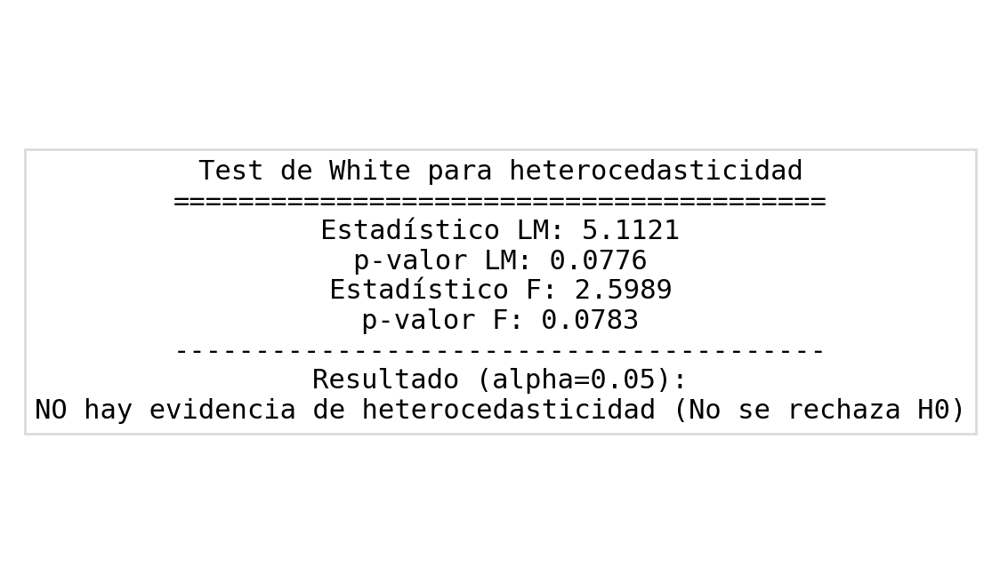

In [41]:
from statsmodels.stats.diagnostic import het_white

# Realizar el test de White para heterocedasticidad
white_test = het_white(modelo_capm.resid, modelo_capm.model.exog)

# Mostrar los resultados
nombres = ['Estadístico LM', 'p-valor LM', 'Estadístico F', 'p-valor F']

# Formatear el contenido del texto
alpha = 0.05
header = "Test de White para heterocedasticidad\n" + "="*40 + "\n"
body = "\n".join([f"{n}: {v:.4f}" for n, v in zip(nombres, white_test)])
footer = "\n" + "-"*40 + f"\nResultado (alpha={alpha}):\n"
footer += "SÍ hay evidencia de heterocedasticidad (Se rechaza H0)" if white_test[1] < alpha else "NO hay evidencia de heterocedasticidad (No se rechaza H0)"

texto_final = header + body + footer

# Crear la imagen (Lienzo de Matplotlib)
plt.figure(figsize=(7, 4))
plt.text(0.5, 0.5, texto_final, 
         fontsize=11, 
         family='monospace', 
         ha='center', 
         va='center', 
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgrey'))

plt.axis('off') # Quitamos los ejes para que parezca una ficha de resultados

# 4. Grabar el gráfico
plt.savefig('output/test_white_resultado.png', bbox_inches='tight', dpi=300)

print("Imagen guardada en 'output/test_white_resultado.png'")


**Test de White:** Más general que Breusch-Pagan, incluye cuadrados y productos cruzados de las variables explicativas como regresores auxiliares. La coincidencia de ambos tests en rechazar la homocedasticidad refuerza la fiabilidad del diagnóstico.

#### 3. Contraste de Autocorrelación

La **ausencia de autocorrelación serial** implica $\text{Cov}(\varepsilon_t, \varepsilon_{t-k}) = 0$ para todo $k \neq 0$. En datos mensuales puede surgir por estacionalidad u omisión de variables relevantes. Se aplican el test de Ljung-Box y las funciones ACF/PACF.

In [42]:
# 3. Análisis de Autocorrelación
# -----------------------------

# Test de Ljung-Box
lb_test = acorr_ljungbox(residuos, lags=12)  # 12 lags para datos mensuales

print(f"Test de Ljung-Box para Autocorrelación:")
for i, row in lb_test.iterrows():
        print(f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}")
        print(f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}")
        



Test de Ljung-Box para Autocorrelación:
Lag 1: Estadístico: 1.3970, p-valor: 0.2372
Autocorrelación: No detectada
Lag 2: Estadístico: 1.8085, p-valor: 0.4048
Autocorrelación: No detectada
Lag 3: Estadístico: 1.8747, p-valor: 0.5988
Autocorrelación: No detectada
Lag 4: Estadístico: 2.0356, p-valor: 0.7292
Autocorrelación: No detectada
Lag 5: Estadístico: 2.7168, p-valor: 0.7435
Autocorrelación: No detectada
Lag 6: Estadístico: 3.8986, p-valor: 0.6904
Autocorrelación: No detectada
Lag 7: Estadístico: 4.2754, p-valor: 0.7476
Autocorrelación: No detectada
Lag 8: Estadístico: 5.6249, p-valor: 0.6892
Autocorrelación: No detectada
Lag 9: Estadístico: 5.9524, p-valor: 0.7447
Autocorrelación: No detectada
Lag 10: Estadístico: 7.7314, p-valor: 0.6551
Autocorrelación: No detectada
Lag 11: Estadístico: 8.7755, p-valor: 0.6426
Autocorrelación: No detectada
Lag 12: Estadístico: 9.4575, p-valor: 0.6634
Autocorrelación: No detectada


**Test de Ljung-Box:** Contrasta H₀ de ausencia de autocorrelación hasta el retardo $k$. Se evalúan los 12 primeros retardos (un año de datos mensuales). Un p-valor < 0,05 en algún retardo indica autocorrelación significativa en ese horizonte.

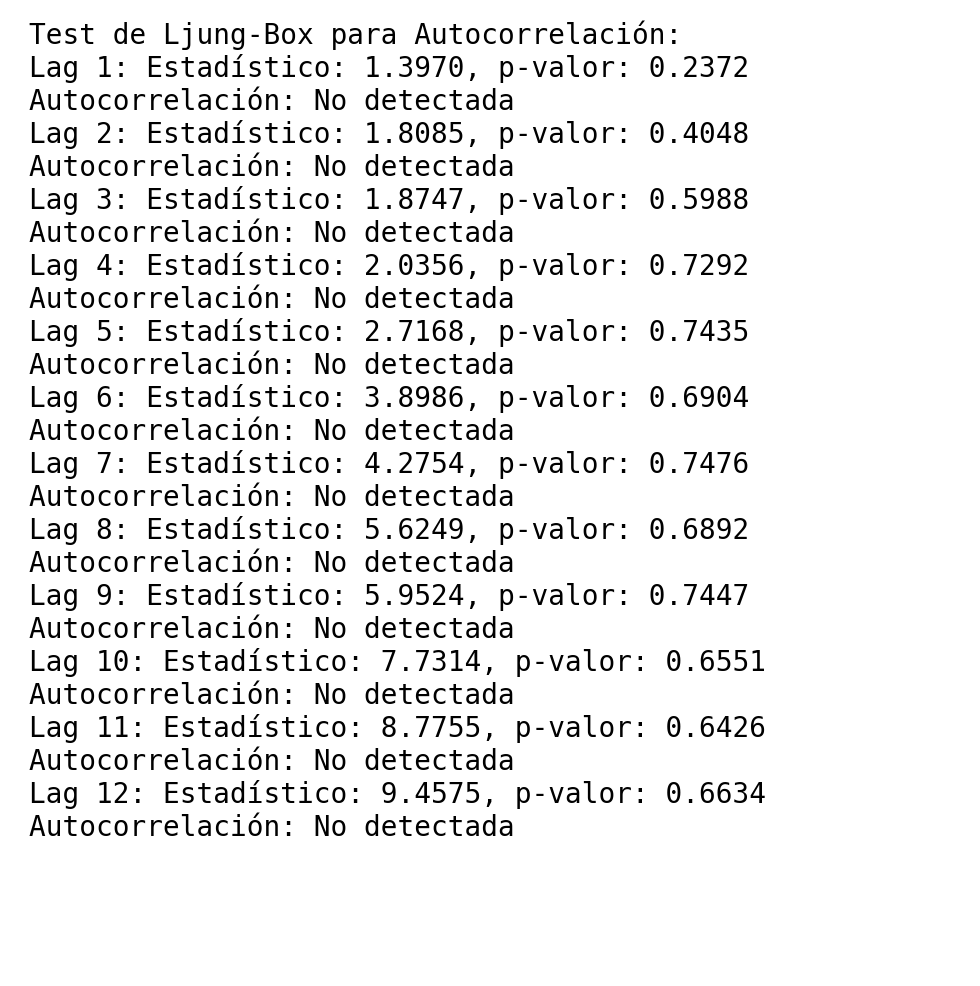

In [43]:
# Suponiendo que ya tienes tu DataFrame lb_test con los resultados
# Construimos una cadena con toda la información que imprimirías normalmente
texto_salida = "Test de Ljung-Box para Autocorrelación:\n"

for i, row in lb_test.iterrows():
    texto_salida += f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}\n"
    texto_salida += f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}\n"

plt.rc('figure', figsize=(5, 5), dpi=200)
plt.text(0.01, 0.99, texto_salida, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/LjunBox_capm_02.png')

<Figure size 2400x1200 with 0 Axes>

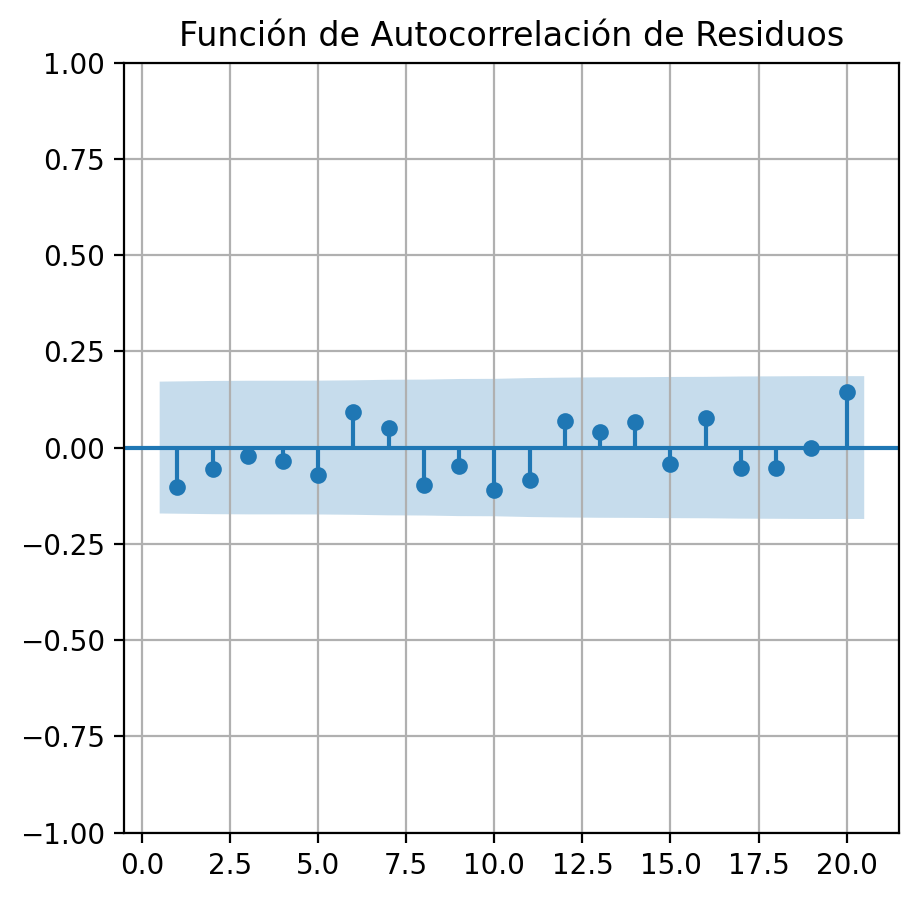

<Figure size 2400x1200 with 0 Axes>

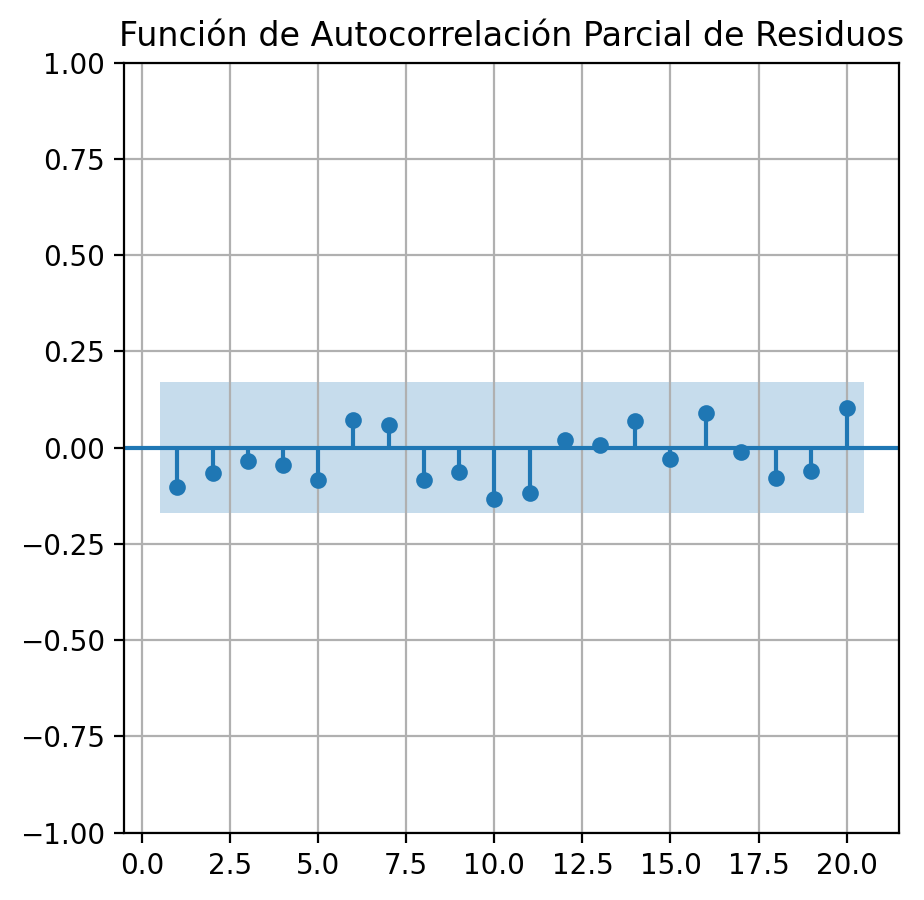

In [44]:
# Función de autocorrelación (ACF)
plt.figure(figsize=(12, 6))
plot_acf(residuos, lags=20, alpha=0.05, zero=False, title='Función de Autocorrelación de Residuos')
plt.grid(True)
plt.savefig('output/residuos_acf.png') # grabar el grafico
plt.show()

# Función de autocorrelación parcial (PACF)
plt.figure(figsize=(12, 6))
plot_pacf(residuos, lags=20, alpha=0.05, zero=False,title='Función de Autocorrelación Parcial de Residuos')
plt.grid(True)
plt.savefig('output/residuos_pacf.png') # grabar el grafic
plt.show()

**Interpretación de ACF y PACF:** Las barras que superan las bandas de confianza (nivel 5%) indican retardos con autocorrelación estadísticamente significativa. La ACF muestra la correlación total a cada retardo; la PACF muestra la correlación parcial eliminando el efecto de los retardos intermedios.

### <font color='red'>S04: Identificación y Tratamiento de Valores Atípicos</font>

Los **valores atípicos** (*outliers*) en los residuos del modelo CAPM surgen por eventos corporativos extraordinarios o shocks que generan rentabilidades muy alejadas de lo que el mercado predice. Su presencia puede distorsionar la estimación de la beta y violar el supuesto de normalidad.

La estrategia seguida:
1. Identificar observaciones con residuos tipificados superiores a ±2,5σ.
2. Investigar el evento corporativo o macroeconómico que los explica.
3. Incorporar **variables de intervención** (*dummies*) al modelo para absorber el efecto de estos eventos, preservando las observaciones y evitando sesgos de selección.

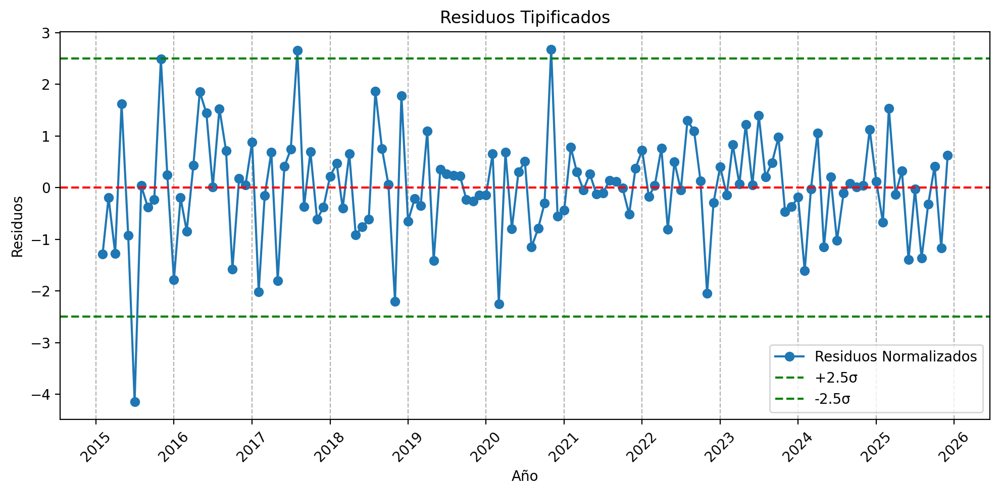

In [45]:
import matplotlib.dates as mdates

# residuos
# returns.index=returns['Date']
returns['residuos'] = modelo_capm.resid.values
# Normalización de los residuos
returns['residuos_normalizados'] = (returns['residuos'] - np.mean(returns['residuos'])) / np.std(returns['residuos'])

# Configuración de los ticks y el grid en el inicio de cada año
year_locator = mdates.YearLocator()  # Localizador para cada inicio de año
year_formatter = mdates.DateFormatter('%Y')  # Formateador para mostrar solo el año


plt.figure(figsize=(10, 5))
plt.plot(returns['residuos_normalizados'], marker='o', linestyle='-', label='Residuos Normalizados')
plt.axhline(0, color='red', linestyle='--')
plt.axhline(2.5, color='green', linestyle='--', label='+2.5σ')
plt.axhline(-2.5, color='green', linestyle='--', label='-2.5σ')

# Configurar el eje x
ax = plt.gca()
ax.xaxis.set_major_locator(year_locator)  # Ticks en cada año
ax.xaxis.set_major_formatter(year_formatter)  # Mostrar solo el año
plt.grid(True, which='major', axis='x', linestyle='--')  # Grid en los inicios de año

# Rotar las etiquetas del eje x si  para mayor claridad
plt.xticks(rotation=45)

plt.title('Residuos Tipificados')
plt.xlabel('Año')
plt.ylabel('Residuos')
plt.legend()
plt.tight_layout()  # Ajustar el diseño para evitar recortes
plt.show()

Se recalculan y representan los residuos tipificados del modelo CAPM inicial. Las observaciones que superan el umbral de ±2,5σ son candidatos a valores atípicos que requieren investigación y tratamiento.

In [46]:
# Mostar los datos que son > o < 2.5σ 
# hacer la logica condicioanla  al vez

returns[abs(returns['residuos_normalizados'])> 2.5]['residuos']

Date
2015-07-01   -0.463620
2017-08-01    0.296830
2020-11-01    0.299647
Name: residuos, dtype: float64

### Identificación de los Valores Atípicos

Se identifican tres observaciones con residuos tipificados superiores a ±2,5σ, cada una asociada a un evento corporativo específico de Yelp:

#### 2015-07-01 Yelp paralizó su búsqueda de un comprador potencial

El 1 de julio de 2015 Yelp había decidido suspender temporalmente el proceso de venta que estaba explorando desde semanas antes, después de haber contratado a Goldman Sachs para buscar posibles compradores y evaluar ofertas por la compañía; la decisión fue tomada por su cofundador y CEO, Jeremy Stoppelman, quien optó por no seguir adelante con la operación en ese momento pese al interés existente, lo que generó una reacción inmediata en los mercados y provocó una caída significativa en la cotización de sus acciones en la Bolsa de Nueva York, reflejando la sorpresa y la incertidumbre entre los inversores ante el giro estratégico de la empresa.

#### 2017-08-01 Acuerdo estratégico para vender Eat24 a Grubhub, integrar sus servicios dentro de YELP y un programa de recompra de acciones de 200 millones$

En torno a esa fecha Yelp publicó sus resultados financieros del segundo trimestre de 2017, que reflejaban un crecimiento de ingresos de alrededor del 20 % con beneficios sólidos, y anunció un acuerdo estratégico para vender su servicio de pedidos de comida Eat24 a Grubhub por unos 287,5 millones de dólares, además de una asociación para integrar los servicios de Grubhub dentro de la plataforma de Yelp y un programa de recompra de acciones de 200 millones $ por parte de la junta directiva; esta combinación de resultados financieros sólidos y el anuncio de la venta e integración de Eat24 fue lo que impulsó a que las acciones de Yelp subieran notablemente en los primeros días de agosto de 2017.

#### 2020-11-01 cierre de un ciclo de recuperación mejor de lo esperado

No hay ningún anuncio corporativo o evento oficial fechado exactamente el 1 de noviembre de 2020 relacionado con Yelp, pero en torno a esa fecha la compañía estaba en medio de la gestión de los efectos de la pandemia de COVID-19 y comunicaciones financieras clave: a principios de noviembre de 2020, Yelp publicó sus resultados financieros del tercer trimestre de 2020, donde informó que sus ingresos netos crecieron un 31 % respecto al trimestre anterior y destacó la resiliencia de su negocio pese al impacto continuado de la pandemia.

#### Estimación del Modelo CAPM con Variables de Intervención

Se crean tres variables *dummy* binarias (valor 1 solo en el mes del evento, 0 en el resto) y se reestima el modelo:

$$r_{YELP,t} - r_f = \alpha + \beta(r_{M,t} - r_f) + \gamma_1 D_{Intervencion1} + \gamma_2 D_{Intervencion2} + \gamma_3 D_{Intervencion3} + \varepsilon_t$$

Los coeficientes $\gamma_i$ absorben el efecto de cada evento extraordinario, permitiendo que la estimación de $\beta$ refleje únicamente la relación sistemática entre Yelp y el mercado, sin distorsiones por eventos puntuales.

In [48]:
# Crear dummy para la intervencion el 2019-08-01
returns['intervencion1'] = 0
returns.loc[returns.index == '2015-07-01', 'intervencion1'] = 1

returns['intervencion2'] = 0
returns.loc[returns.index == '2017-08-01', 'intervencion2'] = 1

returns['intervencion3'] = 0
returns.loc[returns.index == '2020-11-01', 'intervencion3'] = 1

# Estimar la regresión con dummy
modelo_capm_outlier= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']", data=returns).fit()
modelo_capm_outlier.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     returns['YELP Premium']   R-squared:                       0.449
Model:                                 OLS   Adj. R-squared:                  0.432
Method:                      Least Squares   F-statistic:                     25.69
Date:                     Wed, 20 May 2026   Prob (F-statistic):           1.41e-15
Time:                             20:45:58   Log-Likelihood:                 119.27
No. Observations:                      131   AIC:                            -228.5
Df Residuals:                          126   BIC:                            -214.2
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                    -0.0113      0.009     -1.284      0.201      -0.029       0.006
returns['Market Premium']     1.0451      0.152      6.855      0.000       0.743       1.347
returns['intervencion1']     -0.4644      0.100     -4.659      0.000      -0.662      -0.267
returns['intervencion2']      0.2957      0.100      2.966      0.004       0.098       0.493
returns['intervencion3']      0.3205      0.103      3.119      0.002       0.117       0.524
==============================================================================
Omnibus:                        3.321   Durbin-Watson:                   2.299
Prob(Omnibus):                  0.190   Jarque-Bera (JB):                3.031
Skew:                          -0.210   Prob(JB):                        0.220
Kurtosis:                       3.615   Cond. No.                         18.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

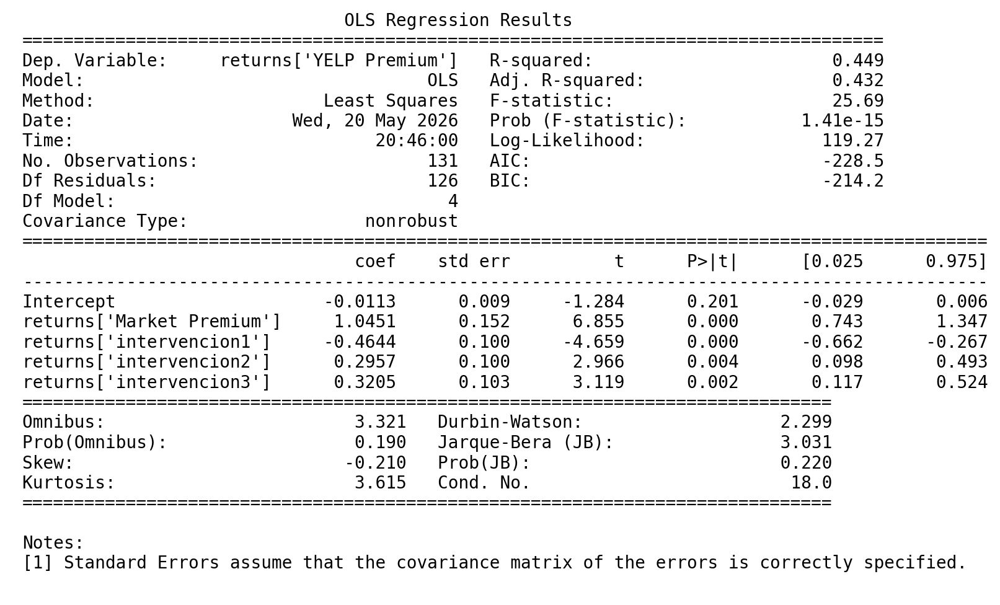

In [49]:
plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_outlier.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/regresion_capm_outlier.png')

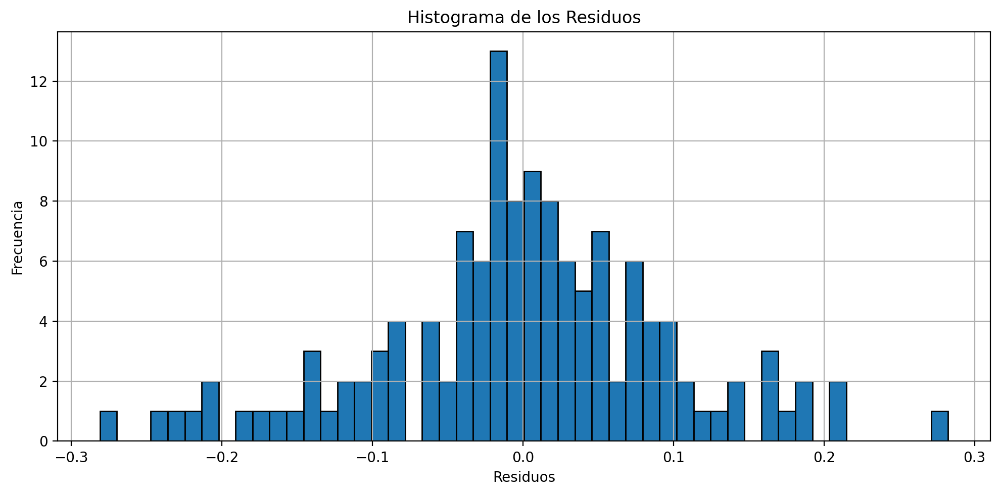

In [50]:
# Generar los residuos del modelo con dummy
returns['residuos_outlier'] = modelo_capm_outlier.resid.values

# histograma de los residuos
plt.figure(figsize=(10, 5))
plt.hist(returns['residuos_outlier'], bins=50, edgecolor='black')
plt.title('Histograma de los Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.tight_layout()
plt.savefig('output/residuos_histograma_outlier.png') # grabar el grafico
plt.show()

**Conclusión del histograma post-corrección:** Se evalúa si la distribución de los nuevos residuos se aproxima más a la normal. Una distribución más simétrica y con colas menos pesadas confirmaría que los *outliers* eran la principal fuente de no normalidad en el modelo inicial.

<Figure size 2000x1200 with 0 Axes>

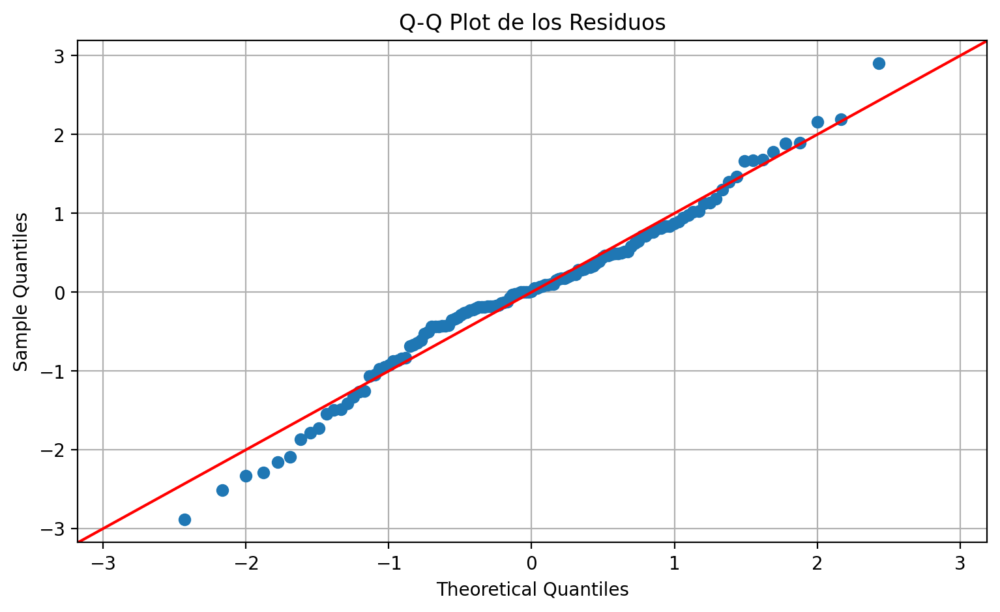

In [51]:
# Gráfico Q-Q Plot
import scipy.stats as stats
plt.figure(figsize=(10, 6))
fig = sm.qqplot(returns['residuos_outlier'], stats.norm, line='45', fit=True)
plt.title('Q-Q Plot de los Residuos')
plt.grid(True)
plt.savefig('output/residuos_qqplot_outlier.png') # grabar el grafico
plt.show()

El Q-Q plot de los residuos con intervenciones se compara con el del modelo inicial. Una mayor adherencia a la línea de 45°, especialmente en las colas, confirmaría que la corrección de los valores atípicos ha mejorado el cumplimiento del supuesto de normalidad.

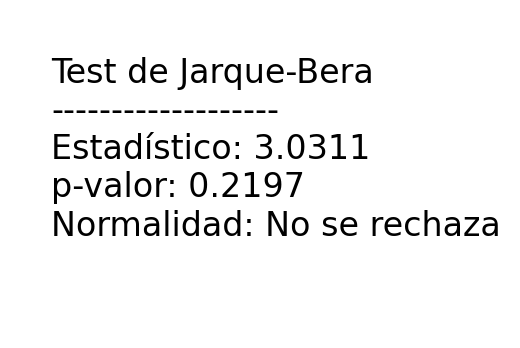

In [52]:
# Test de Jarque-Bera para normalidad
jb_test = sm.stats.jarque_bera(returns['residuos_outlier'])

resultado = (
    f"Test de Jarque-Bera\n"
    f"-------------------\n"
    f"Estadístico: {jb_test[0]:.4f}\n"
    f"p-valor: {jb_test[1]:.4f}\n"
    f"Normalidad: {'Se rechaza' if jb_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_jarque_bera_outlier.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Jarque-Bera (modelo con intervenciones):** No se rechaza la normalidad, indicando que los tres eventos atípicos eran la principal causa de no normalidad.

#### Heterocedasticidad tras la corrección por valores atípicos

Se repite el análisis de heterocedasticidad sobre los residuos del modelo corregido para determinar si este problema persiste o si los eventos atípicos también contribuían a la varianza no constante.

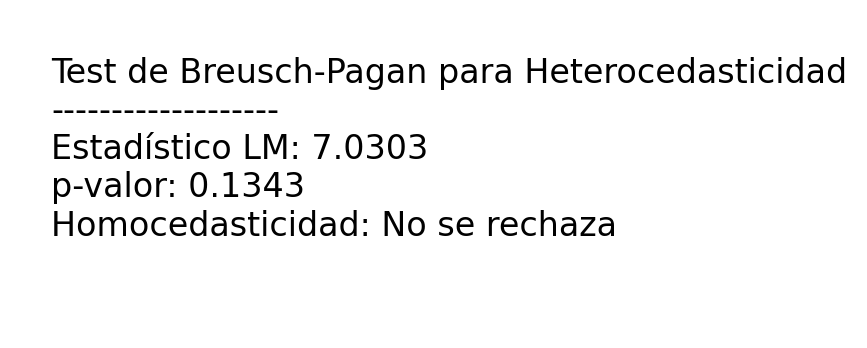

In [53]:
# 2. Análisis de Heterocedasticidad
# ---------------------------------

# Test de Breusch-Pagan
bp_test = het_breuschpagan(returns['residuos_outlier'], modelo_capm_outlier.model.exog)

resultado = (
    f"Test de Breusch-Pagan para Heterocedasticidad\n"
    f"-------------------\n"
    f"Estadístico LM: {bp_test[0]:.4f}\n"
    f"p-valor: {bp_test[1]:.4f}\n"
    f"Homocedasticidad: {'Se rechaza' if bp_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_breusch-pagan_outlier.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Breusch-Pagan (modelo con intervenciones):** El p-valor supera 0,05, por lo que no se rechaza la homocedasticidad .

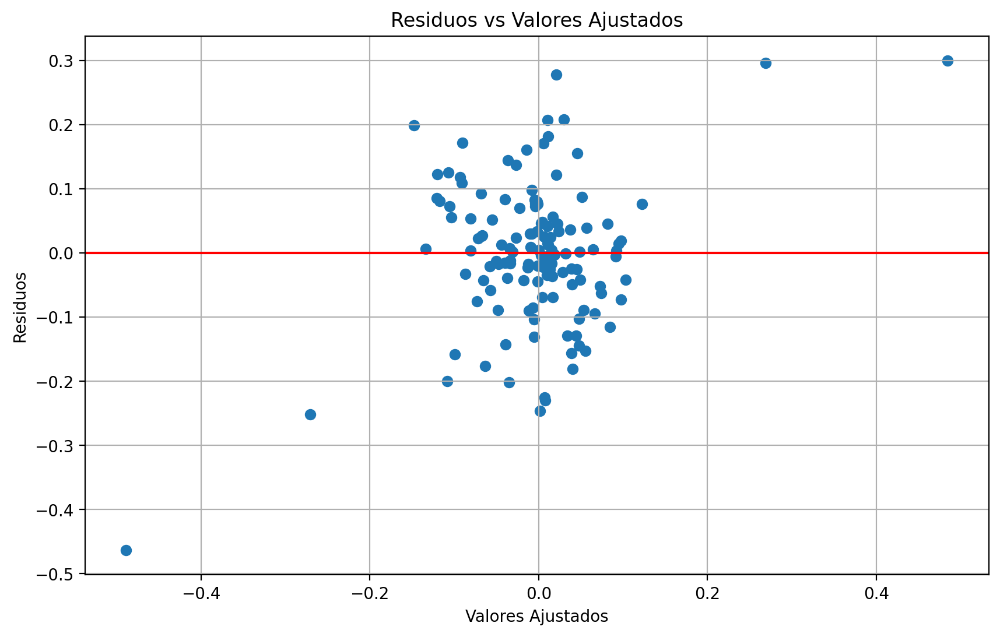

In [54]:
# Gráfico de residuos vs valores ajustados
plt.figure(figsize=(10, 6))
plt.scatter(modelo_capm_outlier.fittedvalues, residuos)
plt.axhline(y=0, color='r', linestyle='-')
plt.title('Residuos vs Valores Ajustados')
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.grid(True)
plt.savefig('output/residuos_modelo_capm_outlier.png') # grabar el grafico
plt.show()

El gráfico de residuos frente a valores ajustados del modelo corregido permite comprobar si el patrón de heterocedasticidad detectado en el modelo inicial persiste o ha desaparecido.

Imagen guardada en 'output/test_white_resultado_outlier.png'


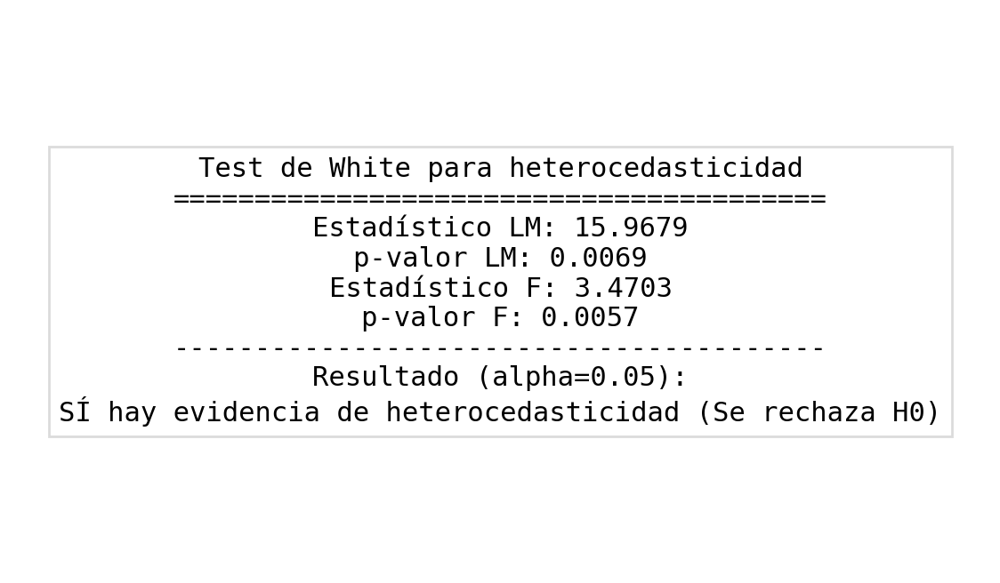

In [55]:
from statsmodels.stats.diagnostic import het_white

# Realizar el test de White para heterocedasticidad
white_test = het_white(modelo_capm_outlier.resid, modelo_capm_outlier.model.exog)

# Mostrar los resultados
nombres = ['Estadístico LM', 'p-valor LM', 'Estadístico F', 'p-valor F']

# Formatear el contenido del texto
alpha = 0.05
header = "Test de White para heterocedasticidad\n" + "="*40 + "\n"
body = "\n".join([f"{n}: {v:.4f}" for n, v in zip(nombres, white_test)])
footer = "\n" + "-"*40 + f"\nResultado (alpha={alpha}):\n"
footer += "SÍ hay evidencia de heterocedasticidad (Se rechaza H0)" if white_test[1] < alpha else "NO hay evidencia de heterocedasticidad (No se rechaza H0)"

texto_final = header + body + footer

# Crear la imagen (Lienzo de Matplotlib)
plt.figure(figsize=(7, 4))
plt.text(0.5, 0.5, texto_final, 
         fontsize=11, 
         family='monospace', 
         ha='center', 
         va='center', 
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgrey'))

plt.axis('off') # Quitamos los ejes para que parezca una ficha de resultados

# 4. Grabar el gráfico
plt.savefig('output/test_white_resultado_outlier.png', bbox_inches='tight', dpi=300)

print("Imagen guardada en 'output/test_white_resultado_outlier.png'")

**Conclusión del test de White (modelo con intervenciones):** el test de White, más sensible a formas no lineales de heterocedasticidad, arroja p-valores de 0.0057 conduciendo al rechazo de la hipótesis nula. Este resultado sugiere cierta heterocedasticidad no lineal tras la incorporación de variables dummy, por lo que el modelo definitivo se estimará con errores estándar robustos de Newey-West 

#### Autocorrelación tras la corrección por valores atípicos

Se repite el análisis de autocorrelación para determinar si los patrones de dependencia serial persisten tras incorporar las variables de intervención.

Test de Ljung-Box para Autocorrelación:
Lag 1: Estadístico: 3.3817, p-valor: 0.0659
Autocorrelación: No detectada
Lag 2: Estadístico: 3.4535, p-valor: 0.1779
Autocorrelación: No detectada
Lag 3: Estadístico: 3.5373, p-valor: 0.3160
Autocorrelación: No detectada
Lag 4: Estadístico: 3.5819, p-valor: 0.4655
Autocorrelación: No detectada
Lag 5: Estadístico: 6.1927, p-valor: 0.2879
Autocorrelación: No detectada
Lag 6: Estadístico: 7.8033, p-valor: 0.2529
Autocorrelación: No detectada
Lag 7: Estadístico: 7.9733, p-valor: 0.3350
Autocorrelación: No detectada
Lag 8: Estadístico: 10.3677, p-valor: 0.2402
Autocorrelación: No detectada
Lag 9: Estadístico: 10.6265, p-valor: 0.3022
Autocorrelación: No detectada
Lag 10: Estadístico: 10.6601, p-valor: 0.3846
Autocorrelación: No detectada
Lag 11: Estadístico: 11.3338, p-valor: 0.4157
Autocorrelación: No detectada
Lag 12: Estadístico: 11.4180, p-valor: 0.4935
Autocorrelación: No detectada


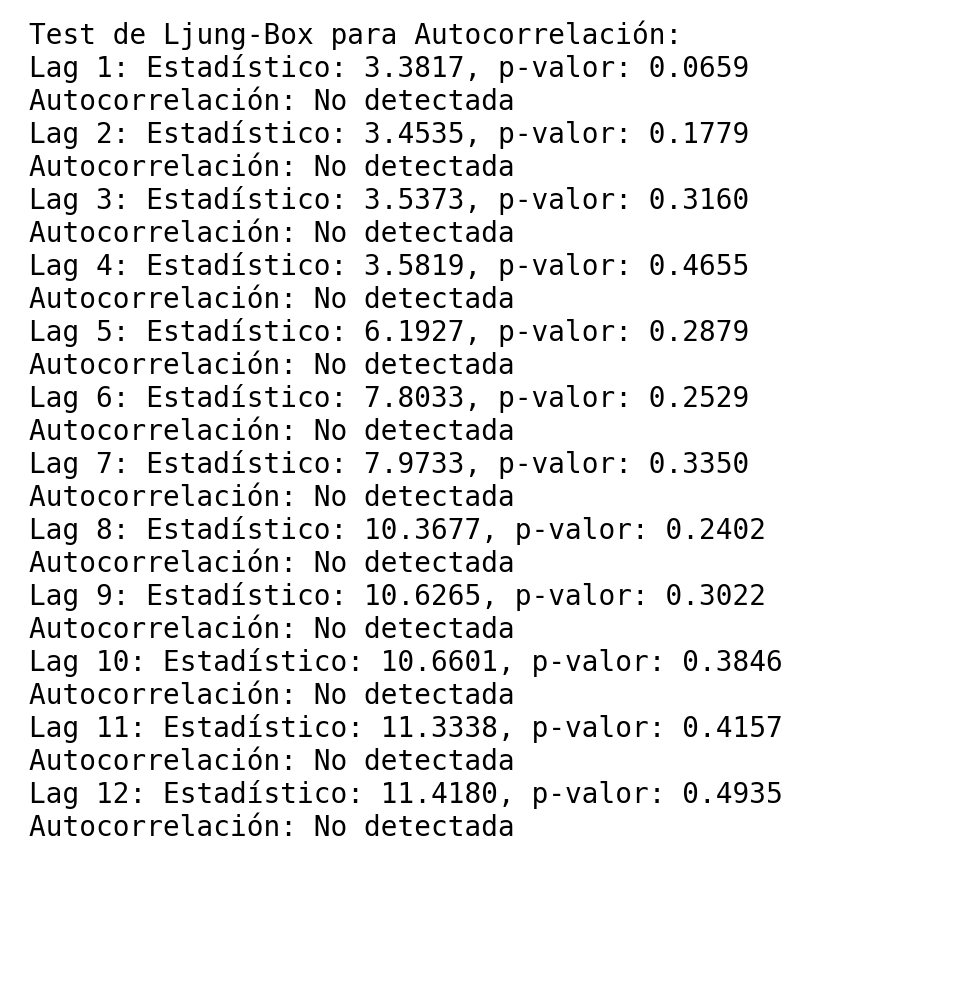

In [56]:
# 3. Análisis de Autocorrelación
# -----------------------------

# Test de Ljung-Box
lb_test = acorr_ljungbox(returns['residuos_outlier'], lags=12)  # 12 lags para datos mensuales

print(f"Test de Ljung-Box para Autocorrelación:")
for i, row in lb_test.iterrows():
        print(f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}")
        print(f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}")
        

# crear imagen 
texto_salida = "Test de Ljung-Box para Autocorrelación:\n"

for i, row in lb_test.iterrows():
    texto_salida += f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}\n"
    texto_salida += f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}\n"

plt.rc('figure', figsize=(5, 5), dpi=200)
plt.text(0.01, 0.99, texto_salida, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/LjunBox_capm_outlier.png')


<Figure size 2400x1200 with 0 Axes>

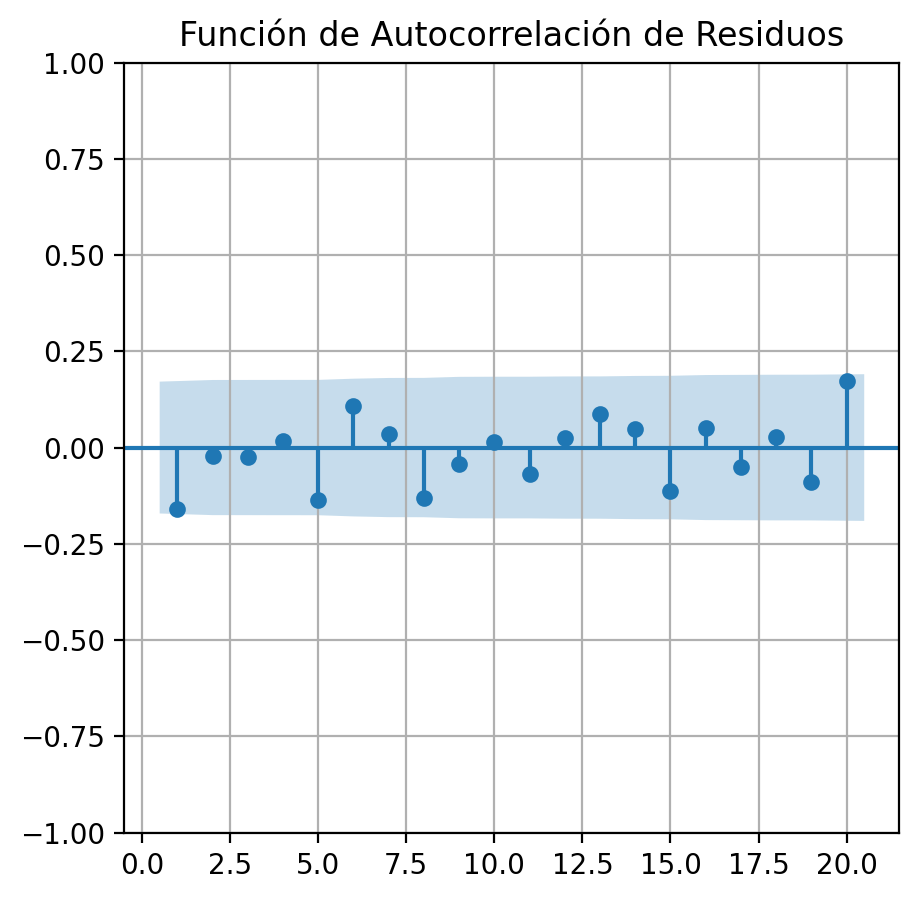

<Figure size 2400x1200 with 0 Axes>

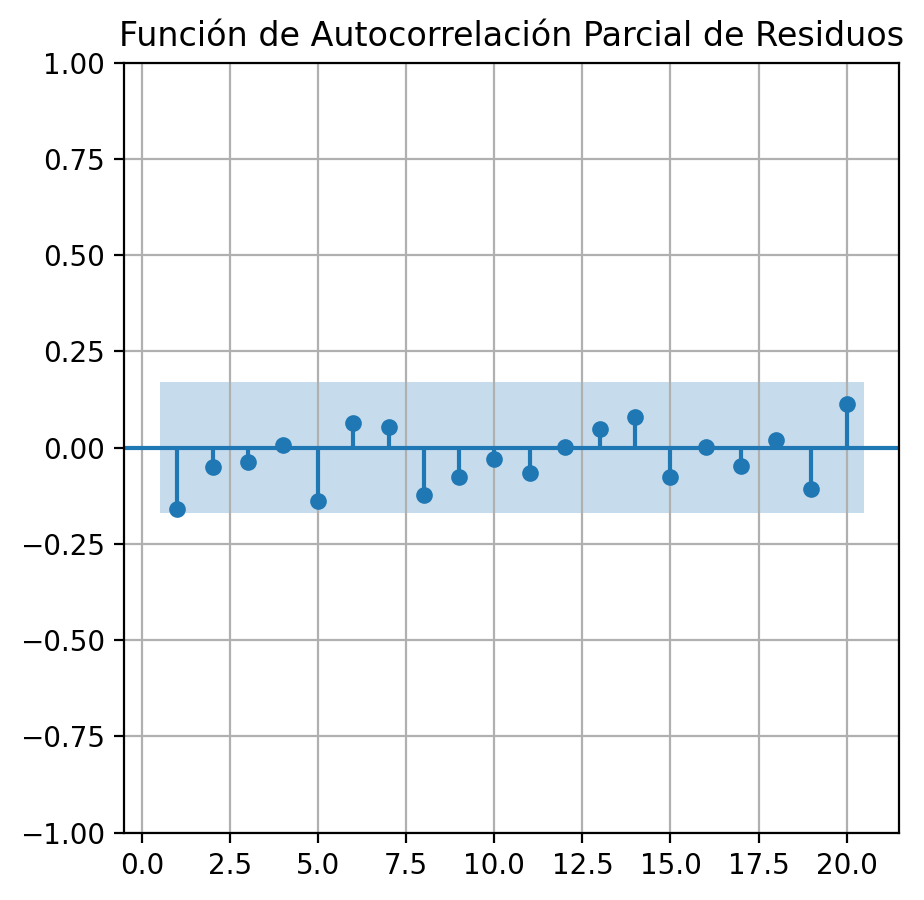

In [57]:
# Función de autocorrelación (ACF)
plt.figure(figsize=(12, 6))
plot_acf(returns['residuos_outlier'], lags=20, alpha=0.05, zero=False, title='Función de Autocorrelación de Residuos')
plt.grid(True)
plt.savefig('output/residuos_acf_outlier.png') # grabar el grafico
plt.show()

# Función de autocorrelación parcial (PACF)
plt.figure(figsize=(12, 6))
plot_pacf(returns['residuos_outlier'], lags=20, alpha=0.05, zero=False,title='Función de Autocorrelación Parcial de Residuos')
plt.grid(True)
plt.savefig('output/residuos_pacf_outlier.png') # grabar el grafic
plt.show()

**Conclusión de la autocorrelación (modelo con intervenciones):** la independencia temporal de los residuos se mantiene tras la incorporación de las variables de intervención.

In [58]:
# save data como dataframe
returns.to_csv('data/returns_capm.csv')

### <font color='red'>S05: Cambio Estructural y Modelo Final</font>

Un **cambio estructural** implica que los parámetros del modelo (alpha y/o beta) no son estables a lo largo del tiempo, sino que cambian en un momento determinado como consecuencia de un evento relevante. Su presencia invalida la estimación de un único modelo para todo el período.

La metodología seguida:
1. Identificar eventos candidatos a provocar un cambio estructural (crisis, giros estratégicos, cambios tecnológicos).
2. Crear una *dummy* igual a 1 desde la fecha del evento y 0 antes.
3. Incluir en el modelo la *dummy* y su interacción con la prima de mercado para permitir cambios en constante y/o beta.
4. Contrastar la significatividad mediante tests de Wald con covarianza robusta de Newey-West.

#### Modelo Base Corregido: CAPM con Newey-West y Variables de Intervención

Antes de analizar los cambios estructurales, se establece el **modelo base robusto**: el CAPM con las tres variables de intervención y errores estándar de **Newey-West** (HAC, 1 retardo).

La corrección de Newey-West proporciona errores estándar válidos en presencia de heterocedasticidad. Este modelo es la especificación de referencia sobre la que se realizarán los tests de cambio estructural.

In [59]:
# Estimar la regresión con dummy
modelo_capm_newey_west_outlier= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier.summary()

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 2
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     returns['YELP Premium']   R-squared:                       0.449
Model:                                 OLS   Adj. R-squared:                  0.432
Method:                      Least Squares   F-statistic:                     71.15
Date:                     Wed, 20 May 2026   Prob (F-statistic):           2.09e-21
Time:                             20:54:24   Log-Likelihood:                 119.27
No. Observations:                      131   AIC:                            -228.5
Df Residuals:                          126   BIC:                            -214.2
Df Model:                                4                                         
Covariance Type:                       HAC                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                    -0.0113      0.008     -1.388      0.165      -0.027       0.005
returns['Market Premium']     1.0451      0.222      4.705      0.000       0.610       1.480
returns['intervencion1']     -0.4644      0.009    -50.422      0.000      -0.482      -0.446
returns['intervencion2']      0.2957      0.010     31.012      0.000       0.277       0.314
returns['intervencion3']      0.3205      0.036      8.885      0.000       0.250       0.391
==============================================================================
Omnibus:                        3.321   Durbin-Watson:                   2.299
Prob(Omnibus):                  0.190   Jarque-Bera (JB):                3.031
Skew:                          -0.210   Prob(JB):                        0.220
Kurtosis:                       3.615   Cond. No.                         18.0
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity and autocorrelation robust (HAC) using 1 lags and without small sample correction
"""

**Conclusión del modelo base con Newey-West:** Los coeficientes estimados son idénticos a los del MCO estándar, pero los errores estándar, y por tanto los p-valores e intervalos de confianza, son robustos a heterocedasticidad y autocorrelación. Este es el punto de partida para el análisis de cambio estructural.

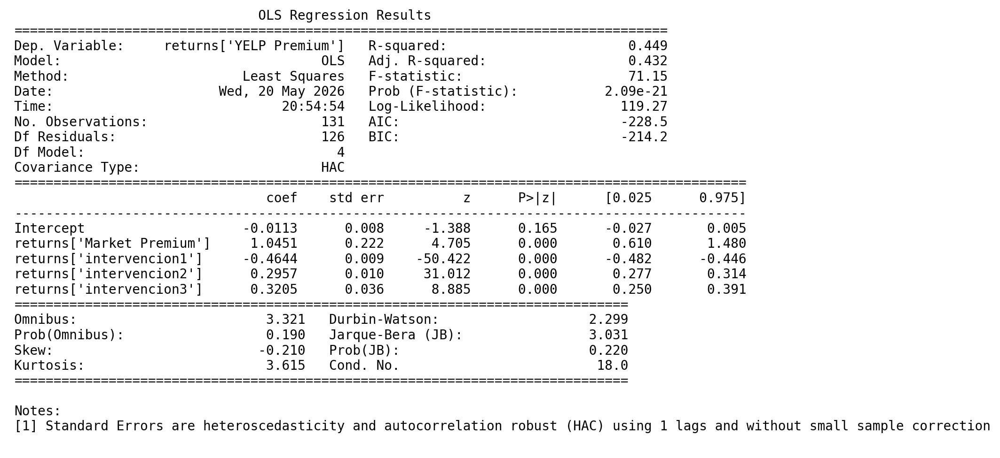

In [60]:
plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/regresion_capm_newey_west_outlier.png')

#### <font color='orange'>Cambio Estructural 1: COVID-19 (1 de marzo de 2020)</font>

La pandemia de COVID-19 supuso un shock macroeconómico sin precedentes para los negocios locales, núcleo del modelo de negocio de Yelp. Se contrasta si el COVID-19 alteró significativamente la relación entre la rentabilidad de Yelp y la del mercado, es decir, si cambió su beta y/o su constante de forma permanente a partir de marzo de 2020.

#### 1. Constante y Pendiente

Se crea la *dummy* `covid` igual a 1 desde marzo de 2020. Se estima el modelo completo con cambio potencial en constante y pendiente:

$$r_{YELP,t} - r_f = \alpha + \beta_0 PM_t + \sum_i \gamma_i D_i + \delta_1 \cdot covid_t + \delta_2 (covid_t \times PM_t) + \varepsilon_t$$

donde $\delta_1$ mide el cambio en la constante y $\delta_2$ el cambio en la beta tras el COVID-19.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 4
  warnings.warn('covariance of constraints does not have full '


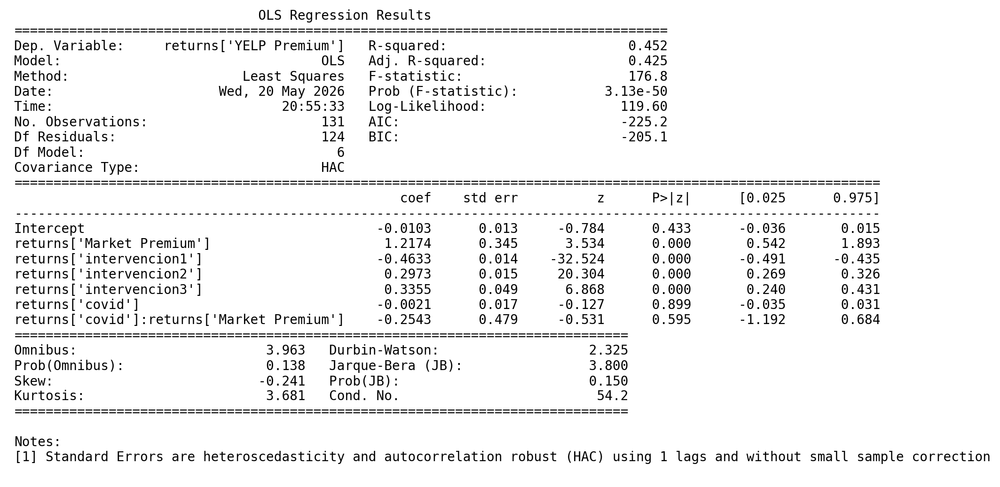

In [61]:
# Constante y pendiente
# Cambio estructural del COVID: returns['covid']* returns['Market Premium']
returns['covid'] = 0
returns.loc[returns.index >= '2020-03-01', 'covid'] = 1

# Estimar la regresión con dummy
modelo_capm_newey_west_outlier_covid= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['covid']* returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_covid.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_covid.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/rmodelo_capm_newey_west_outlier_covid.png')

**Resultados numéricos:**
- **Beta pre-COVID**: 1,2174
- **Beta post-COVID**: 1,2174 − 0,2543 = **0,9631** (reducción modesta de la sensibilidad al mercado)
- **Constante pre-COVID**: −0,0103
- **Constante post-COVID**: −0,0103 + (−0,0021) ≈ −0,0082

**Significatividad individual:** Ninguno de los dos cambios es significativo (p-valores 0,899 y 0,595), lo que sugiere que el COVID no alteró de forma estadísticamente robusta los parámetros del modelo.

Test de Wald:

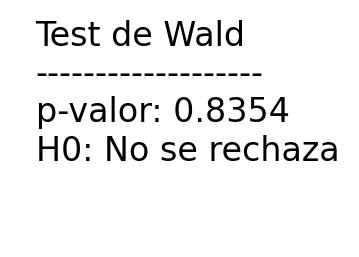

In [62]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr = "returns['covid'] = 0, returns['covid']:returns['Market Premium'] = 0"
wald_res = modelo_capm_newey_west_outlier_covid.wald_test(restr, cov_p=modelo_capm_newey_west_outlier_covid.cov_params())
wald_res


# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_covid.png', bbox_inches='tight', dpi=300)


**Conclusión del test de Wald conjunto (constante + pendiente):** Con un p-valor de 0,835 (>> 0,05), no se puede rechazar la hipótesis nula. **El COVID-19 no constituye un cambio estructural estadísticamente significativo** en el modelo CAPM de Yelp. El impacto del período pandémico ya fue capturado por la variable de intervención de noviembre 2020 y no se tradujo en un cambio permanente de los parámetros.

#### 2. Pendiente

Se reestima el modelo restringiendo el cambio solo a la pendiente (beta), sin permitir cambio en la constante. El coeficiente de interacción `covid × Market Premium` mide el cambio exclusivo en la beta post-COVID.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


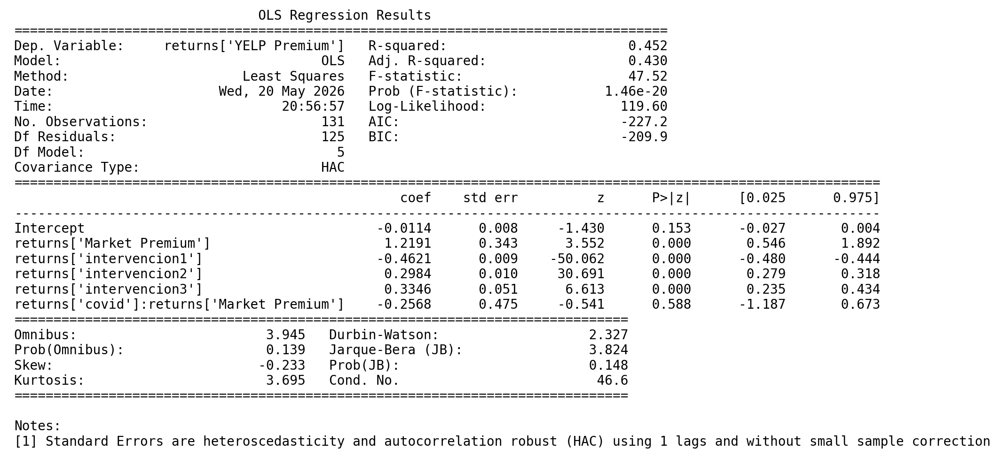

In [63]:
# pendiente
# Estimar la regresión con dummy returns['covid'] : returns['Market Premium']
modelo_capm_newey_west_outlier_covid_2= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['covid']: returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_covid_2.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_covid_2.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_covid_2.png')

**Conclusión del cambio en pendiente:** El p-valor del cambio en beta es 0,588 (> 0,05). **La beta de Yelp no varió significativamente tras el COVID-19** cuando se controla por los efectos ya capturados mediante las variables de intervención.

Test de Wald:

Se realiza el test de Wald para contrastar si el cambio en la pendiente (beta) asociado al COVID-19 es estadísticamente significativo.

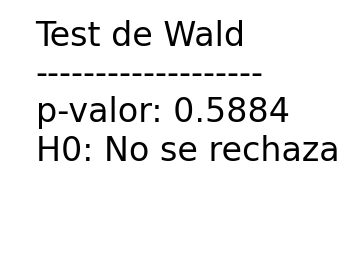

In [64]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_2 = "returns['covid']:returns['Market Premium'] = 0"
wald_res_2 = modelo_capm_newey_west_outlier_covid_2.wald_test(restr_2, cov_p=modelo_capm_newey_west_outlier_covid_2.cov_params())
wald_res_2


# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_2.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_2.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_covid_2.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald (solo pendiente):** p = 0,588 → no se rechaza H₀. El cambio en beta no es significativo.

#### 3. Constante

Se reestima el modelo restringiendo el cambio solo a la constante (alpha), evaluando si el COVID alteró el nivel de rentabilidad esperada de Yelp de forma permanente, sin modificar su sensibilidad a los movimientos de mercado.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


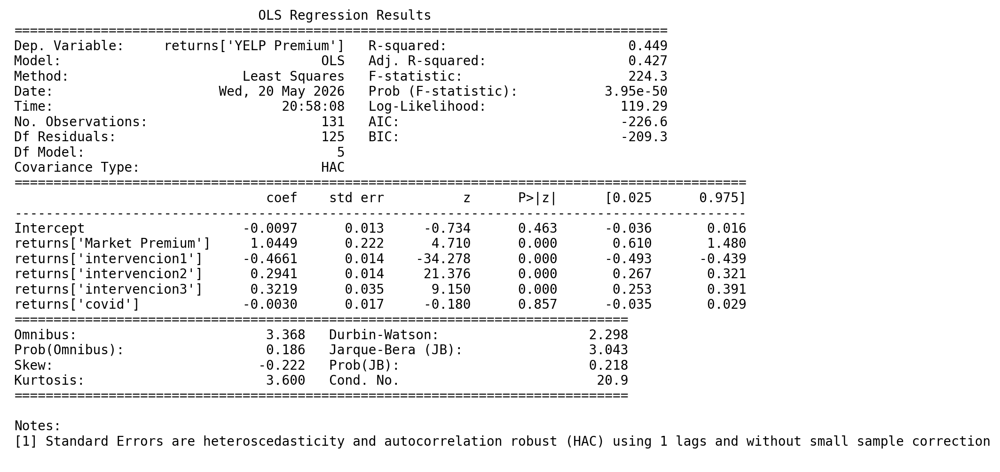

In [65]:
# Constante returns['covid']
# Estimar la regresión con dummy returns['covid'] 
modelo_capm_newey_west_outlier_covid_3= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['covid']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_covid_3.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_covid_3.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_covid_3.png')

**Conclusión del cambio en constante:** La constante no es significativa (p > 0,05). El COVID-19 no generó tampoco un cambio significativo en el alpha de Yelp.

Test de Wald:

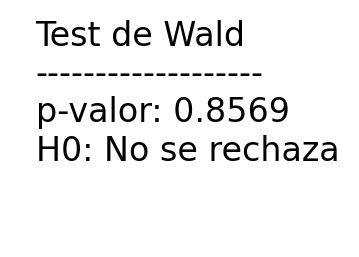

In [66]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_3 = "returns['covid'] = 0"
wald_res_3 = modelo_capm_newey_west_outlier_covid_3.wald_test(restr_3, cov_p=modelo_capm_newey_west_outlier_covid_3.cov_params())
wald_res_3

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_3.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_3.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_covid_3.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald (solo constante):** p = 0,857 → no se rechaza H₀. El cambio en la constante no es significativo.

**Conclusión global del Cambio Estructural 1 (COVID-19):** Los tres contrastes realizados no detectan evidencia estadística de un cambio estructural permanente asociado al COVID-19. El impacto fue puntual (ya capturado por la variable de intervención de noviembre 2020) y no persistió como un cambio permanente en los parámetros del modelo.

### <font color='orange'>Cambio Estructural 2: Giro hacia Servicios (1 de enero de 2019)</font>

A partir de 2019, Yelp reorientó su modelo de negocio desde la búsqueda de restaurantes hacia la generación de *leads* para **servicios del hogar** (fontanería, reformas, mudanzas). Este giro estratégico implicó cambios en la base de clientes y en la percepción del riesgo empresarial que podrían haber alterado la beta de Yelp.

Yelp dejó de ser una plataforma de "búsqueda de restaurantes" para convertirse en un "generador de leads para servicios" (fontaneros, mudanzas, reformas).

#### 1. Constante y Pendiente

Se crea la *dummy* `servicios` igual a 1 desde enero de 2019 y se estima el modelo completo con cambio en constante y pendiente.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 4
  warnings.warn('covariance of constraints does not have full '


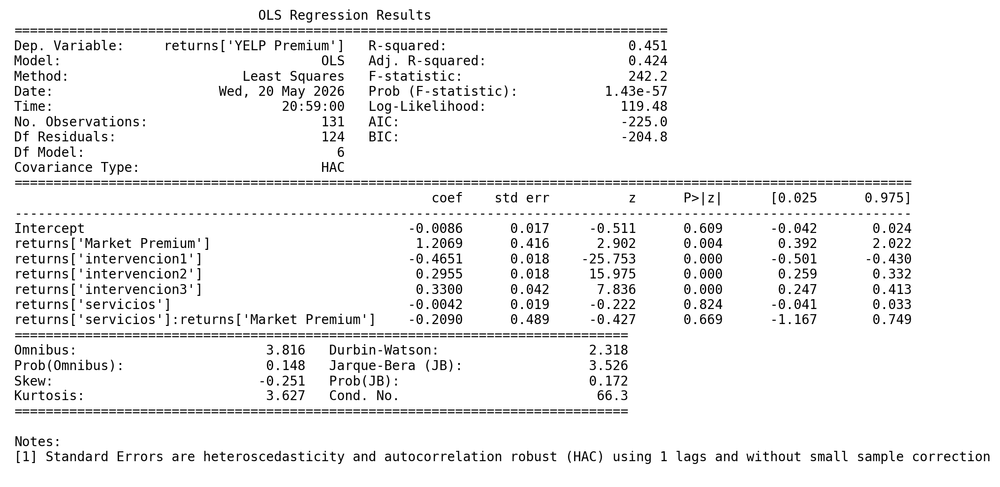

In [67]:
# Constante y pendiente
# Cambio estructural del enfoque en servicios: returns['covid']* returns['Market Premium']
returns['servicios'] = 0
returns.loc[returns.index >= '2019-01-01', 'servicios'] = 1

# Estimar la regresión con dummy
modelo_capm_newey_west_outlier_servicios= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['servicios']* returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_servicios.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_servicios.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_servicios.png')

**Resultados numéricos:**
- **Beta pre-giro**: 1,2069
- **Beta post-giro**: 1,2069 − 0,2090 = **0,9979** (la beta se aproxima a 1 tras el giro estratégico)
- **Constante pre-giro**: −0,0086; **post-giro**: ≈ −0,0044

**Significatividad individual:** Ninguno de los dos cambios es significativo (p-valores 0,824 y 0,669). El descenso en beta es económicamente razonable pero no alcanza significación estadística.

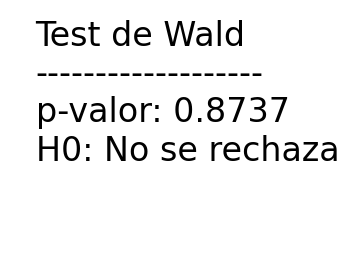

In [68]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr = "returns['servicios'] = 0, returns['servicios']:returns['Market Premium'] = 0"
wald_res = modelo_capm_newey_west_outlier_servicios.wald_test(restr, cov_p=modelo_capm_newey_west_outlier_servicios.cov_params())
wald_res

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_servicios.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald conjunto:** Se contrasta H₀: ambos cambios son simultáneamente iguales a cero.

####  2. Pendiente

Se reestima el modelo incluyendo únicamente el cambio en la pendiente asociado al giro hacia servicios, para aislar su efecto sobre la beta.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


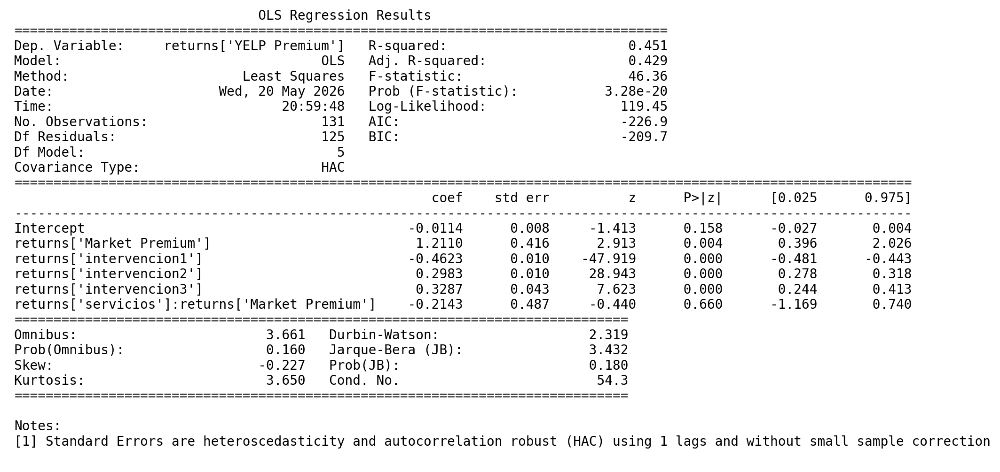

In [70]:
# pendiente
# Estimar la regresión con dummy returns['servicios'] : returns['Market Premium']
modelo_capm_newey_west_outlier_servicios_2= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['servicios']: returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_servicios_2.summary()



plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_servicios_2.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_servicios_2.png')

**Conclusión del cambio en pendiente:** El cambio en beta no es estadísticamente significativo. El descenso observado (de 1,21 a 1,00) es económicamente razonable, el giro a servicios podría haber reducido la ciclicidad, pero la incertidumbre estadística no permite confirmar que sea un cambio permanente y robusto.

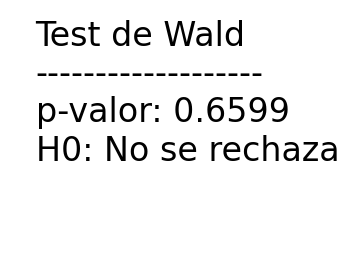

In [71]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_2 = "returns['servicios']:returns['Market Premium'] = 0"
wald_res_2 = modelo_capm_newey_west_outlier_servicios_2.wald_test(restr_2, cov_p=modelo_capm_newey_west_outlier_servicios_2.cov_params())
wald_res_2

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_2.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_2.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_servicios_2.png', bbox_inches='tight', dpi=300)

#### 3. Constante

Se reestima el modelo incluyendo únicamente el cambio en la constante asociado al giro hacia servicios.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


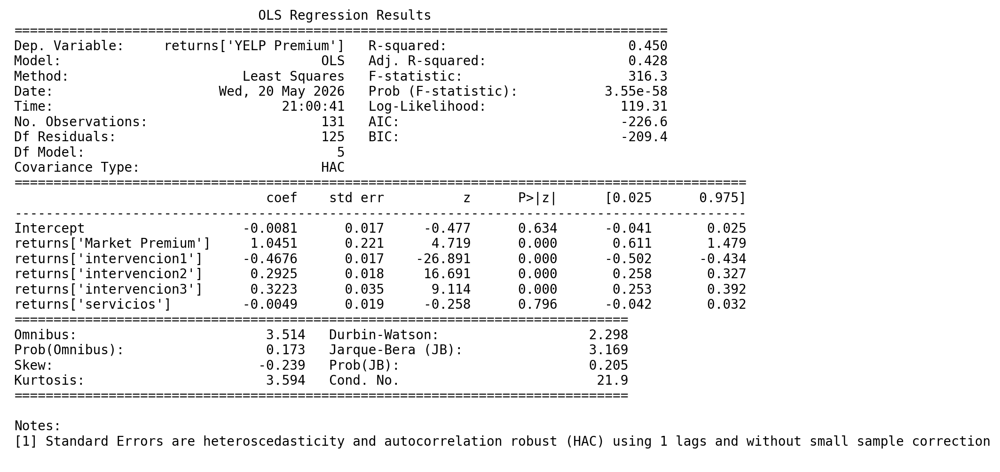

In [73]:
# Constante returns['servicios']
# Estimar la regresión con dummy returns['servicios'] 
modelo_capm_newey_west_outlier_servicios_3= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['servicios']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_servicios_3.summary()


plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_servicios_3.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_servicios_3.png')

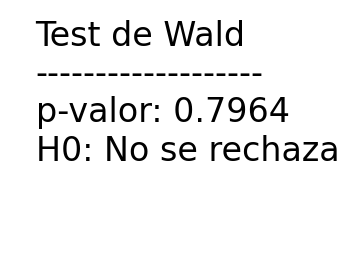

In [74]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_3 = "returns['servicios'] = 0"
wald_res_3 = modelo_capm_newey_west_outlier_servicios_3.wald_test(restr_3, cov_p=modelo_capm_newey_west_outlier_servicios_3.cov_params())
wald_res_3

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_3.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_3.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_servicios_3.png', bbox_inches='tight', dpi=300)

**Conclusión global del Cambio Estructural 2 (Giro hacia Servicios):** Los tests de Wald no detectan evidencia estadística de un cambio estructural significativo asociado al giro hacia servicios iniciado en enero de 2019. Este evento no se incorpora al modelo final.

#### <font color='orange'>Cambio Estructural 3: Consolidación del Modelo Self-Service (1 de enero de 2021)</font>

Desde 2021, Yelp consolidó un modelo de negocio **self-service**: los anunciantes contratan y gestionan sus campañas de forma autónoma a través de la plataforma digital. Esta transición desde un modelo de agencia (con equipos de ventas) hacia una plataforma tecnológica implica reducción de costes fijos, mayor escalabilidad y menor sensibilidad al ciclo económico, lo que debería traducirse en una **reducción de la beta**.

Yelp pasó de tener miles de empleados vendiendo por teléfono (un modelo de "agencia") a una plataforma donde el cliente compra solo (un modelo "SaaS" o tecnológico).

#### 1. Constante y Pendiente

Se crea la *dummy* `self_service` igual a 1 desde enero de 2021 y se estima el modelo completo con cambio en constante y pendiente.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 4
  warnings.warn('covariance of constraints does not have full '


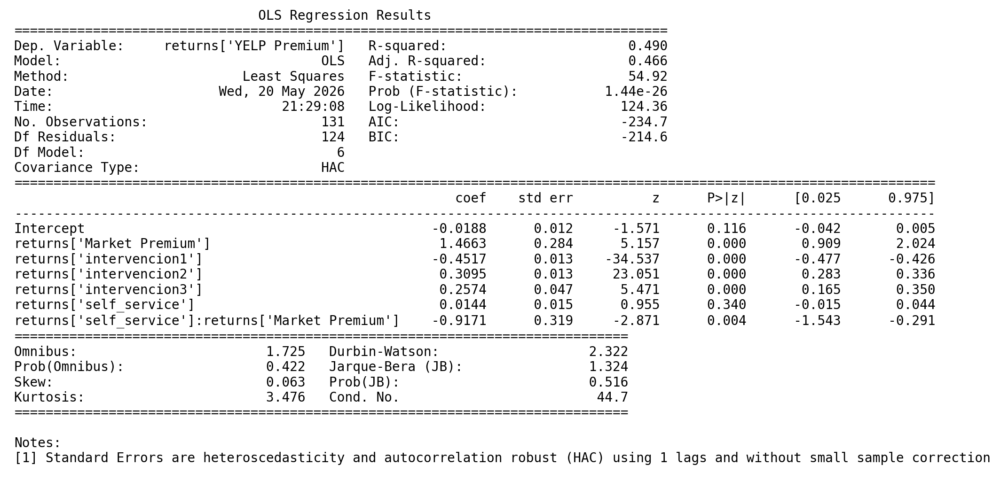

In [75]:
# Constante y pendiente
# Cambio estructural del Modelo Self-Service: returns['self_service']* returns['Market Premium']
returns['self_service'] = 0
returns.loc[returns.index >= '2021-01-01', 'self_service'] = 1

# Estimar la regresión con dummy
modelo_capm_newey_west_outlier_self_service= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']* returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_self_service.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_self_service.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_self_service.png')

**Resultados numéricos:**
- **Beta pre-self-service**: 1,4663
- **Beta post-self-service**: 1,4663 − 0,9171 = **0,5492** (reducción muy pronunciada de la sensibilidad al mercado)
- **Constante pre**: −0,0188; **post**: −0,0188 + 0,0144 = **−0,0044**

**Significatividad individual:**
- Cambio en **beta**: p = 0,004 → **significativo al 1%**. La reducción de beta de 1,47 a 0,55 es estadísticamente robusta.
- Cambio en **constante**: p = 0,340 → no significativo.

**Interpretación económica:** Tras la consolidación del modelo self-service, Yelp se comporta como un activo defensivo (β < 1), amplificando menos los movimientos de mercado. Es coherente con la mayor estabilidad de los ingresos de una plataforma digital.

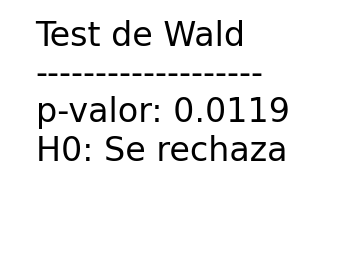

In [76]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr = "returns['self_service'] = 0, returns['self_service']:returns['Market Premium'] = 0"
wald_res = modelo_capm_newey_west_outlier_self_service.wald_test(restr, cov_p=modelo_capm_newey_west_outlier_self_service.cov_params())
wald_res

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_self_servicios.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald conjunto:** El cambio es significativo

#### 2. Pendiente

Se reestima el modelo incluyendo únicamente el cambio en beta (interacción `self_service × Market Premium`), sin el cambio en la constante. Dado que el cambio en la constante no es significativo, este modelo más parsimonioso es preferible al completo

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


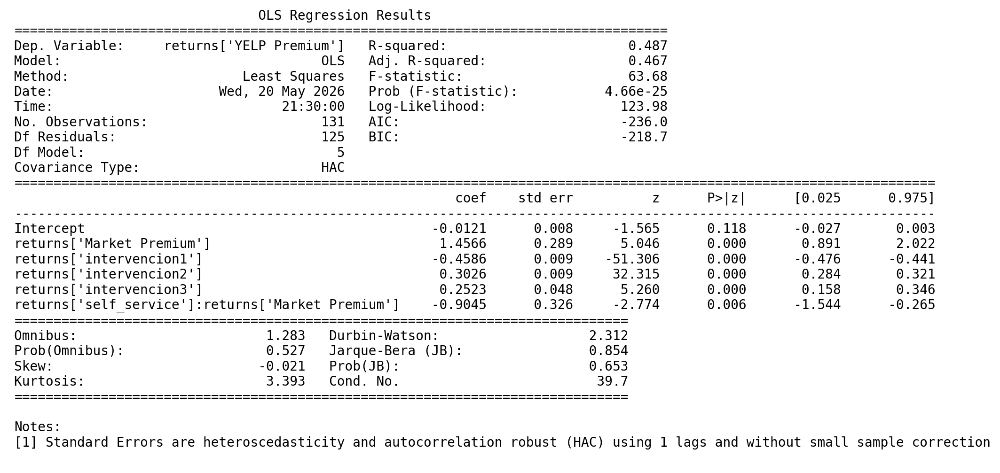

In [77]:
# pendiente
# Estimar la regresión con dummy returns['self_service'] : returns['Market Premium']
modelo_capm_newey_west_outlier_self_service_2= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_self_service_2.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_self_service_2.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_self_service_2.png')

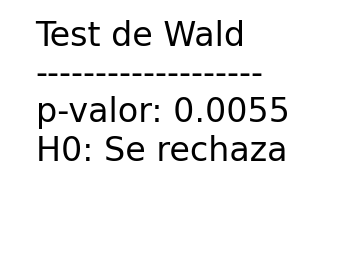

In [78]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_2 = "returns['self_service']:returns['Market Premium'] = 0"
wald_res_2 = modelo_capm_newey_west_outlier_self_service_2.wald_test(restr_2, cov_p=modelo_capm_newey_west_outlier_self_service_2.cov_params())
wald_res_2

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_2.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_2.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_self_servicios_2.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald (solo pendiente):** El cambio en beta es estadísticamente significativo. **Este es el cambio estructural más relevante detectado en el análisis** y el que se incorporará al modelo final.

#### <font color='orange'>Cambio Estructural 4: Integración Masiva de IA (1 de febrero de 2023)</font>

A partir de 2023, Yelp integró herramientas de **inteligencia artificial** en su plataforma: síntesis automatizada de reseñas, mejoras en el motor de búsqueda y optimización de la conexión usuario-negocio. Este cambio tecnológico podría haber alterado la percepción del mercado sobre el posicionamiento competitivo de Yelp y, por tanto, su beta.

Yelp reestructuró su producto para usar IA en la síntesis de reseñas y la conexión directa usuario-negocio.

#### 1. Constante y Pendiente

Se crea la *dummy* `ai_transition` igual a 1 desde febrero de 2023 y se estima el modelo completo, manteniendo además la interacción del *self-service* ya identificada como significativa.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 5
  warnings.warn('covariance of constraints does not have full '


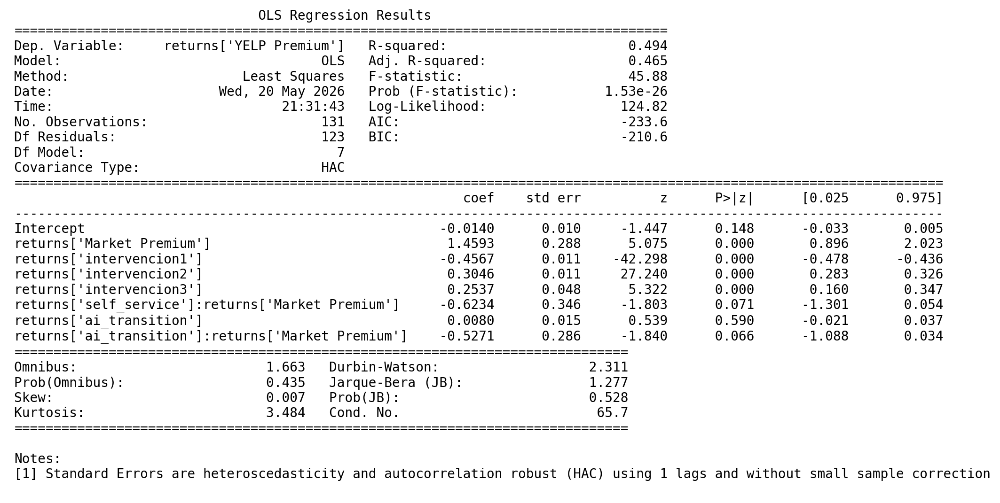

In [80]:
# Constante y pendiente
# Cambio estructural de IA: returns['ai_transition']* returns['Market Premium']
returns['ai_transition'] = 0
returns.loc[returns.index >= '2023-02-01', 'ai_transition'] = 1

# Estimar la regresión con dummy
modelo_capm_newey_west_outlier_ai_transition= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] + returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']+returns['ai_transition']* returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_ai_transition.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_ai_transition.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_ai_transition.png')

**Resultados numéricos:**
- **Beta pre-IA** (con self-service ya incorporado): 1,4593
- **Beta post-IA**: 1,4593 − 0,6234 − 0,5271 = **0,3088**
- **Constante pre**: −0,0132; **post**: ≈ −0,0052

**Significatividad individual:**
- Cambio en **beta**: p = 0,066 → no significativo al 5% (señal débil al 10%).
- Cambio en **constante**: p = 0,590 → no significativo.

**Interpretación:** La dirección del cambio es coherente (mayor integración de IA → menor beta), pero la evidencia no es suficientemente sólida para rechazar la hipótesis nula con la muestra disponible. La ventana post-IA (~2 años) puede ser demasiado corta para detectar el efecto con precisión.

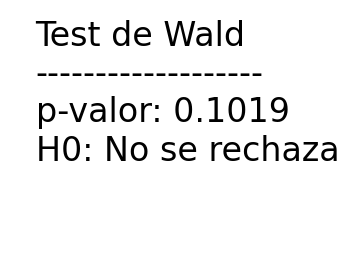

In [81]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr = "returns['ai_transition'] = 0, returns['ai_transition']:returns['Market Premium'] = 0"
wald_res = modelo_capm_newey_west_outlier_ai_transition.wald_test(restr, cov_p=modelo_capm_newey_west_outlier_ai_transition.cov_params())
wald_res

# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_ai_transition.png', bbox_inches='tight', dpi=300)

**Conclusión del test de Wald conjunto:** Los tests de Wald no detectan evidencia estadística de un cambio estructural significativo

#### 2. Pendiente

Se reestima el modelo incluyendo únicamente el cambio en la pendiente asociado a la integración de IA.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 4
  warnings.warn('covariance of constraints does not have full '


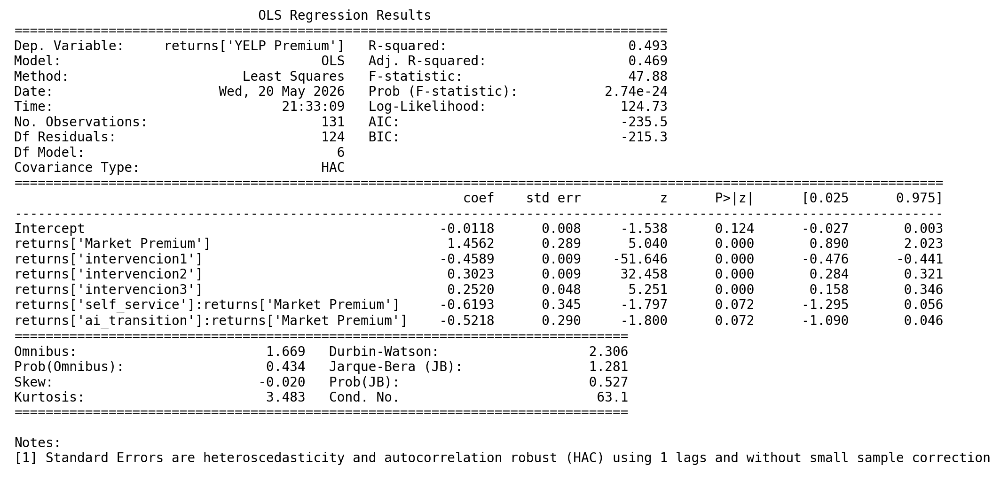

In [82]:
# pendiente
# Estimar la regresión con dummy returns['ai_transition'] : returns['Market Premium']
modelo_capm_newey_west_outlier_ai_transition_2= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']+returns['ai_transition']: returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_ai_transition_2.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_ai_transition_2.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_ai_transition_2.png')

**Conclusión del cambio en pendiente:** El cambio en beta asociado a la integración de IA no es estadísticamente significativo al 5%. Dado el corto período post-evento, este resultado debe interpretarse con cautela: el efecto podría consolidarse estadísticamente a medida que se acumulen más datos.

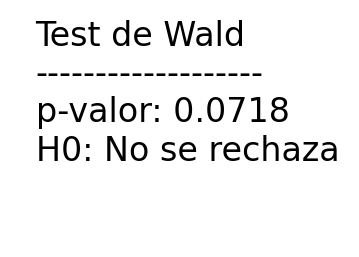

In [83]:
# Ejecutar un Wald test conjunto usando la covarianza robusta del modelo completo
restr_2 = "returns['ai_transition']:returns['Market Premium'] = 0"
wald_res_2 = modelo_capm_newey_west_outlier_ai_transition_2.wald_test(restr_2, cov_p=modelo_capm_newey_west_outlier_ai_transition_2.cov_params())
wald_res_2


# Preparar el texto con los resultados
resultado_wald = (
    f"Test de Wald\n"
    f"-------------------\n"
    f"p-valor: {wald_res_2.pvalue:.4f}\n"
    f"H0: {'Se rechaza' if wald_res_2.pvalue < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 1))
plt.text(0.05, 0.5, resultado_wald, fontsize=12)
plt.axis('off')  # Ocultar ejes
plt.savefig('output/resultado_wald_outlier_ai_transition_2.png', bbox_inches='tight', dpi=300)

**Conclusión global del Cambio Estructural 4 (IA):** La integración de IA no produce un cambio estructural estadísticamente significativo con los datos disponibles hasta 2025. Este evento no se incorpora al modelo final, aunque merece seguimiento futuro.

In [82]:
# returns = pd.read_csv('data/returns_capm.csv')

Celda opcional para recargar los datos desde el CSV en caso de reinicio del kernel, evitando tener que repetir todos los pasos anteriores.

#### <font color='orange'>Modelo de Fama-French de Tres Factores</font>

El modelo de Fama-French amplía el CAPM añadiendo dos factores adicionales:
- **SMB** (*Small Minus Big*): captura la prima de tamaño. Si es positivo y significativo, Yelp se comporta como empresa de pequeña capitalización.
- **HML** (*High Minus Low*): captura la prima de valor. Si es positivo, Yelp tiene características *value*; si negativo, *growth*.

Se estima sobre la especificación con el cambio estructural del *self-service* ya identificado, para determinar si los factores adicionales aportan capacidad explicativa más allá del CAPM.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 5
  warnings.warn('covariance of constraints does not have full '


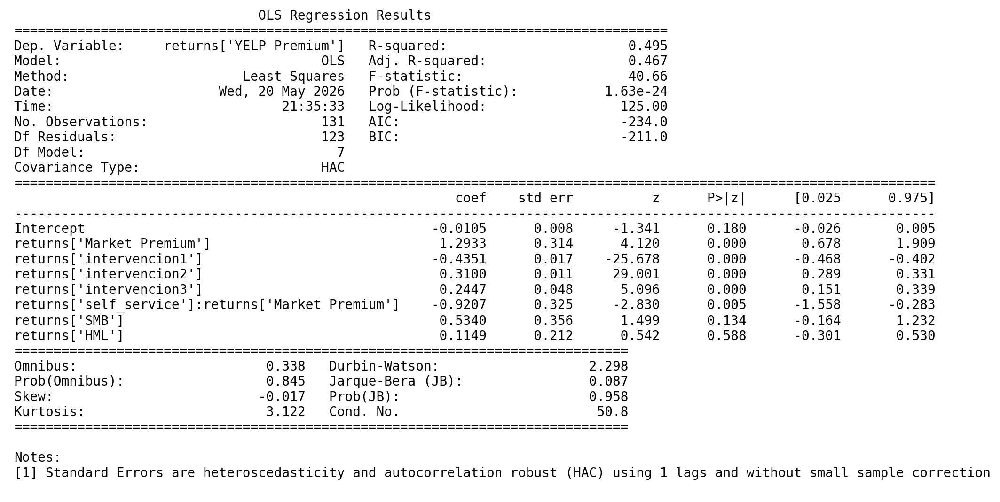

In [84]:
modelo_3FF= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']+returns['SMB']+returns['HML']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_3FF.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_3FF.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_3FF.png')

**Conclusión del modelo de tres factores (FF3):** Ni el SMB ni el HML son estadísticamente significativos (p > 0,05). Una vez controlados el riesgo de mercado y el cambio estructural del *self-service*, los factores de tamaño y valor no aportan información adicional relevante. El modelo CAPM resulta suficiente para este activo.

Se reestima el modelo de Fama-French manteniendo únicamente el SMB (eliminando el HML no significativo), para verificar si el factor de tamaño por sí solo tiene capacidad explicativa marginal.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6, but rank is 4
  warnings.warn('covariance of constraints does not have full '


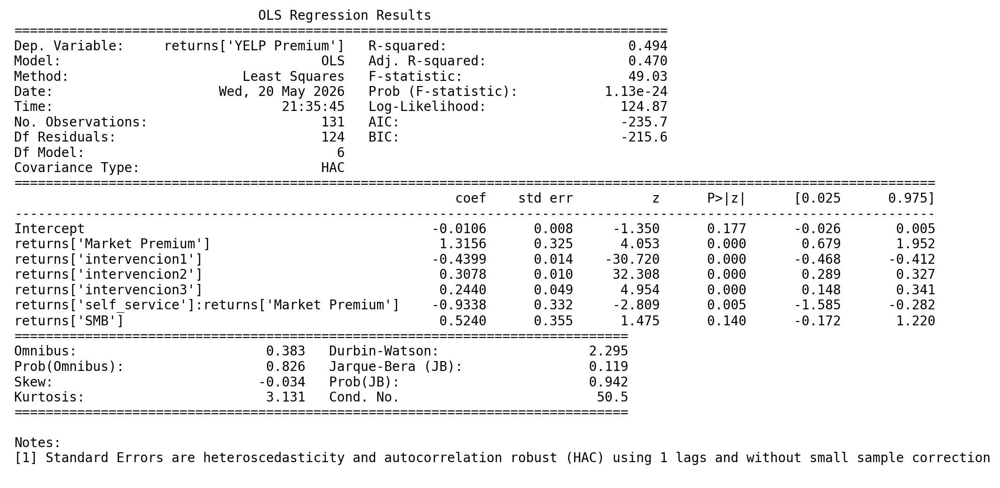

In [85]:
modelo_4FF= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']+returns['SMB']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_4FF.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_4FF.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_4FF.png')

**Conclusión del modelo FF con solo SMB:** El factor SMB tampoco es significativo en solitario. Se confirma que el CAPM corregido (con cambio estructural del *self-service* y variables de intervención) es la especificación más adecuada para Yelp. **No se incorporan factores de Fama-French al modelo final.**

### <font color='orange'>Modelo Final Seleccionado</font>

Tras el proceso completo de diagnóstico y corrección, el **modelo final** seleccionado es el CAPM ampliado con:
1. **Variables de intervención** para los tres valores atípicos (julio 2015, agosto 2017, noviembre 2020).
2. **Cambio estructural en la beta** asociado a la consolidación del modelo *self-service* (desde enero de 2021).
3. **Errores estándar robustos de Newey-West** (HAC, 1 retardo).

La ecuación del modelo final es:

$$r_{YELP,t} - r_f = \alpha + \beta_0 PM_t + \gamma_1 D_{intervencion1} + \gamma_2 D_{intervencion2} + \gamma_3 D_{intervencion3} + \delta (self\_service_t \times PM_t) + \varepsilon_t$$

La **beta efectiva** es $\beta_0$ antes de 2021 y $\beta_0 + \delta$ a partir de enero de 2021.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 3
  warnings.warn('covariance of constraints does not have full '


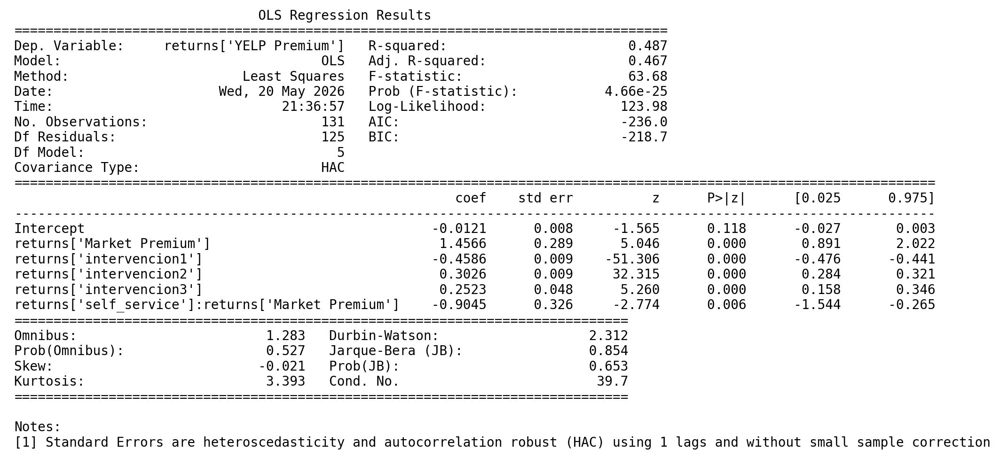

In [87]:
# Estimar la regresión con dummy returns['self_service'] : returns['Market Premium']
modelo_capm_newey_west_outlier_self_service_2= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_capm_newey_west_outlier_self_service_2.summary()

plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_capm_newey_west_outlier_self_service_2.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_capm_newey_west_outlier_self_service_2.png')

#### <font color='white'>Diagnóstico de Residuos del Modelo Final</font>

Se repite el análisis diagnóstico completo sobre los residuos del modelo final para verificar que las correcciones aplicadas han mejorado el cumplimiento de los supuestos respecto al modelo inicial.

#### Normalidad de los residuos del modelo final

Se generan los residuos del modelo final y se representan en un histograma. Si la distribución es más simétrica y con colas menos pronunciadas que en el modelo inicial, confirma que las variables de intervención y el cambio estructural han absorbido los componentes que generaban no normalidad.

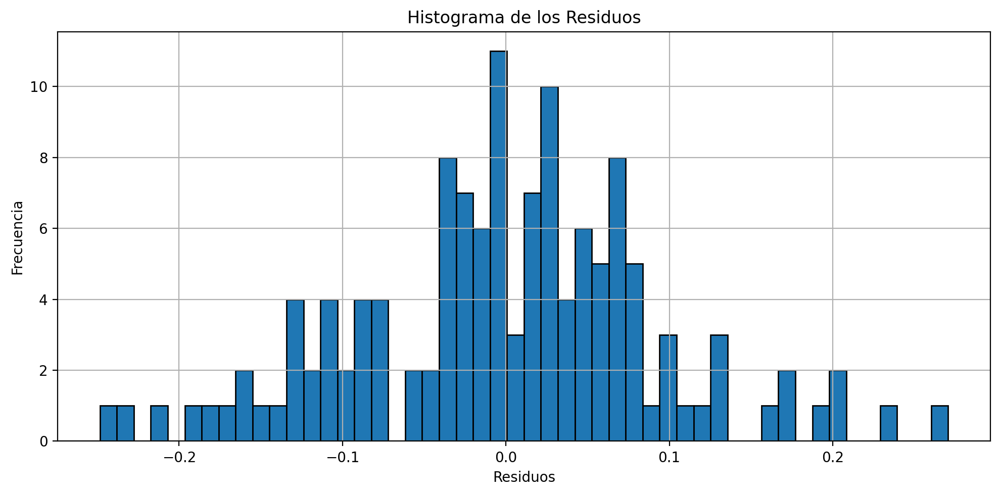

In [88]:
# Generar los residuos del modelo con dummy
returns['residuos_modelo_final'] = modelo_capm_newey_west_outlier_self_service_2.resid.values

# histograma de los residuos
plt.figure(figsize=(10, 5))
plt.hist(returns['residuos_modelo_final'], bins=50, edgecolor='black')
plt.title('Histograma de los Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.tight_layout()
plt.savefig('output/residuos_modelo_final_histograma.png') # grabar el grafico
plt.show()


El Q-Q plot del modelo final permite una comparación directa con el del modelo inicial. Una mayor adherencia a la línea de 45° indica una distribución más próxima a la normal tras las correcciones aplicadas.

<Figure size 2000x1200 with 0 Axes>

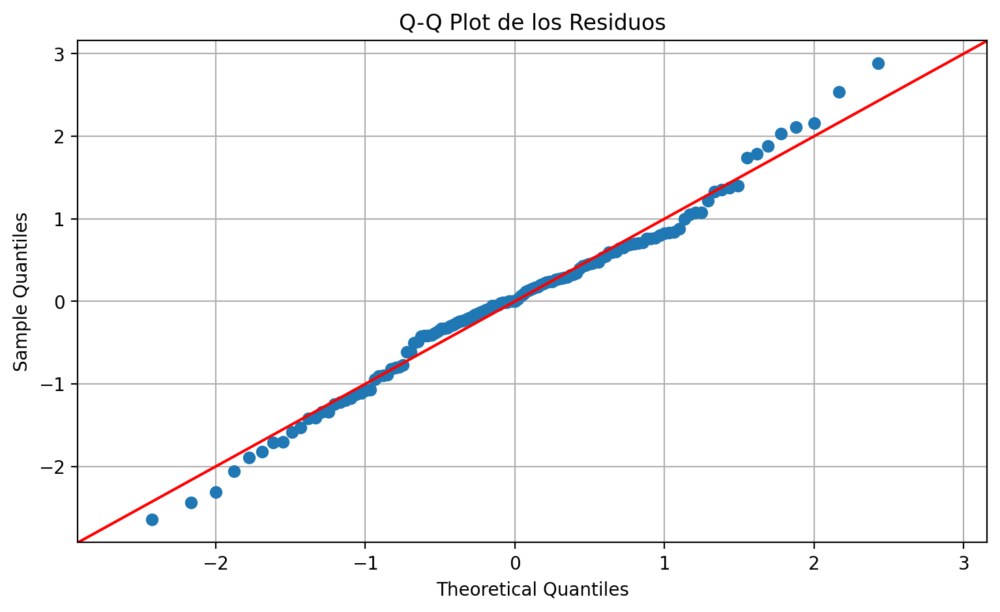

In [89]:
# Gráfico Q-Q Plot
import scipy.stats as stats
plt.figure(figsize=(10, 6))
fig = sm.qqplot(returns['residuos_modelo_final'], stats.norm, line='45', fit=True)
plt.title('Q-Q Plot de los Residuos')
plt.grid(True)
plt.savefig('output/residuos_modelo_final_qqplot.png') # grabar el grafico
plt.show()


El test de Jarque-Bera sobre los residuos del modelo final determina formalmente si se ha restituido la normalidad. Un p-valor > 0,05 indicaría que, tras controlar por los eventos extraordinarios y el cambio estructural, los residuos son compatibles con la distribución normal.

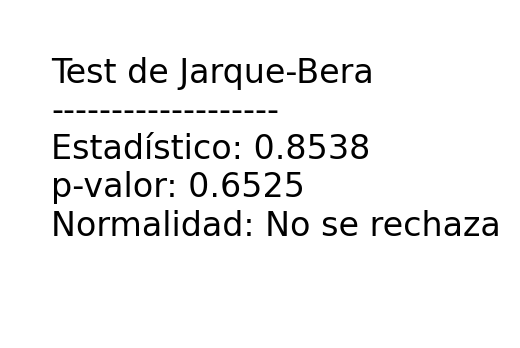

In [90]:
# Test de Jarque-Bera para normalidad
jb_test = sm.stats.jarque_bera(returns['residuos_modelo_final'])

resultado = (
    f"Test de Jarque-Bera\n"
    f"-------------------\n"
    f"Estadístico: {jb_test[0]:.4f}\n"
    f"p-valor: {jb_test[1]:.4f}\n"
    f"Normalidad: {'Se rechaza' if jb_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_modelo_final_jarque_bera.png', bbox_inches='tight', dpi=300)


#### Heterocedasticidad en el modelo final

La heterocedasticidad residual que pudiera persistir ya está corregida en la inferencia gracias a los errores robustos de Newey-West. Los tests siguientes tienen valor diagnóstico para confirmar el grado de mejora respecto al modelo inicial.

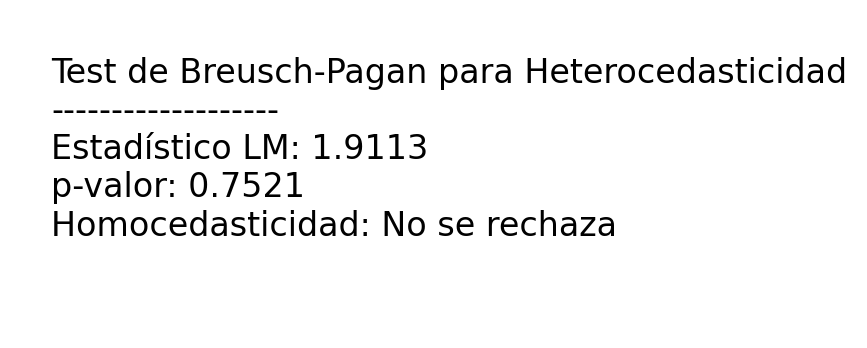

In [91]:
# 2. Análisis de Heterocedasticidad
# ---------------------------------

# Test de Breusch-Pagan
bp_test = het_breuschpagan(returns['residuos_modelo_final'], modelo_capm_outlier.model.exog)

resultado = (
    f"Test de Breusch-Pagan para Heterocedasticidad\n"
    f"-------------------\n"
    f"Estadístico LM: {bp_test[0]:.4f}\n"
    f"p-valor: {bp_test[1]:.4f}\n"
    f"Homocedasticidad: {'Se rechaza' if bp_test[1] < 0.05 else 'No se rechaza'}"
)

# Crear la imagen
plt.figure(figsize=(2, 2))
plt.text(0.1, 0.3, resultado, fontsize=12)
plt.axis('off') # Ocultar los ejes
plt.savefig('output/resultado_modelo_final_breusch-pagan.png', bbox_inches='tight', dpi=300)


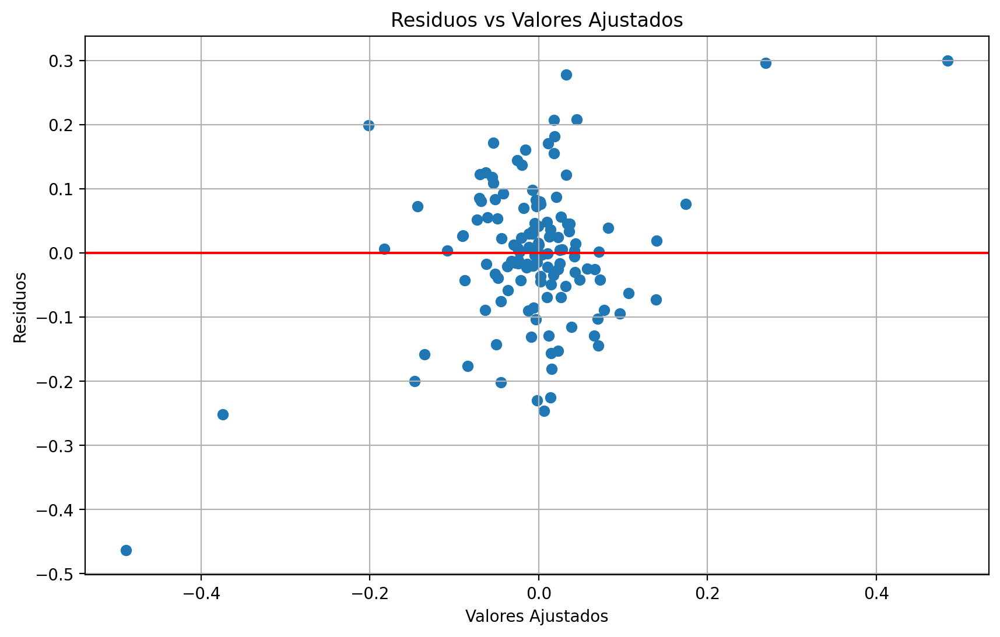

In [92]:
# Gráfico de residuos vs valores ajustados
plt.figure(figsize=(10, 6))
plt.scatter(modelo_capm_newey_west_outlier_self_service_2.fittedvalues, residuos)
plt.axhline(y=0, color='r', linestyle='-')
plt.title('Residuos vs Valores Ajustados')
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.grid(True)
plt.savefig('output/residuos_modelo_final_capm.png') # grabar el grafico
plt.show()


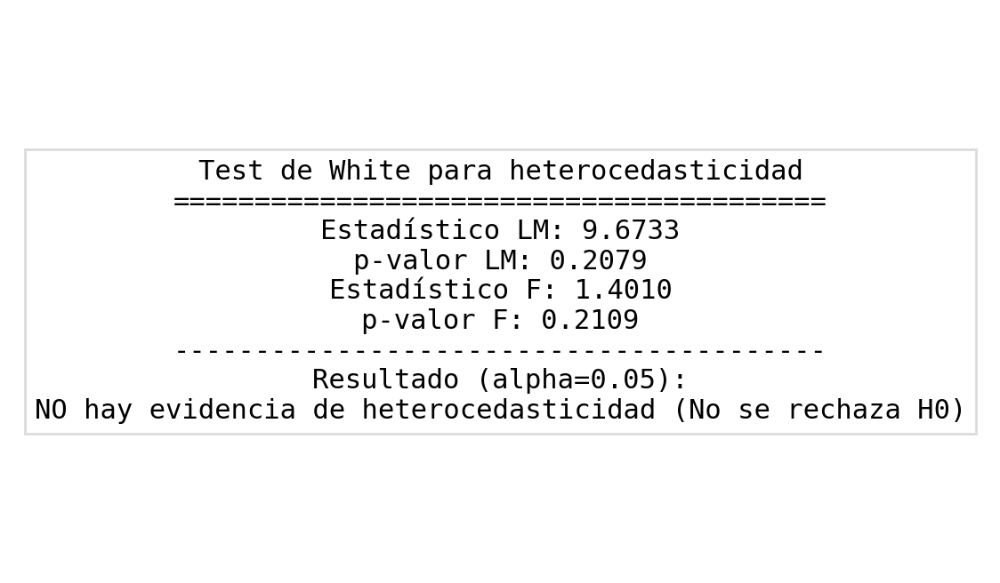

In [93]:
from statsmodels.stats.diagnostic import het_white

# Realizar el test de White para heterocedasticidad
white_test = het_white(modelo_capm_newey_west_outlier_self_service_2.resid, modelo_capm_newey_west_outlier_self_service_2.model.exog)

# Mostrar los resultados
nombres = ['Estadístico LM', 'p-valor LM', 'Estadístico F', 'p-valor F']

# Formatear el contenido del texto
alpha = 0.05
header = "Test de White para heterocedasticidad\n" + "="*40 + "\n"
body = "\n".join([f"{n}: {v:.4f}" for n, v in zip(nombres, white_test)])
footer = "\n" + "-"*40 + f"\nResultado (alpha={alpha}):\n"
footer += "SÍ hay evidencia de heterocedasticidad (Se rechaza H0)" if white_test[1] < alpha else "NO hay evidencia de heterocedasticidad (No se rechaza H0)"

texto_final = header + body + footer

# Crear la imagen (Lienzo de Matplotlib)
plt.figure(figsize=(7, 4))
plt.text(0.5, 0.5, texto_final, 
         fontsize=11, 
         family='monospace', 
         ha='center', 
         va='center', 
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgrey'))

plt.axis('off') # Quitamos los ejes para que parezca una ficha de resultados

# 4. Grabar el gráfico
plt.savefig('output/test_white_resultado_modelo_final.png', bbox_inches='tight', dpi=300)




#### Autocorrelación en el modelo final

Test de Ljung-Box para Autocorrelación:
Lag 1: Estadístico: 3.8211, p-valor: 0.0506
Autocorrelación: No detectada
Lag 2: Estadístico: 3.9065, p-valor: 0.1418
Autocorrelación: No detectada
Lag 3: Estadístico: 4.2278, p-valor: 0.2379
Autocorrelación: No detectada
Lag 4: Estadístico: 4.7674, p-valor: 0.3120
Autocorrelación: No detectada
Lag 5: Estadístico: 8.9246, p-valor: 0.1121
Autocorrelación: No detectada
Lag 6: Estadístico: 10.7129, p-valor: 0.0977
Autocorrelación: No detectada
Lag 7: Estadístico: 10.8104, p-valor: 0.1471
Autocorrelación: No detectada
Lag 8: Estadístico: 12.8359, p-valor: 0.1176
Autocorrelación: No detectada
Lag 9: Estadístico: 13.0996, p-valor: 0.1582
Autocorrelación: No detectada
Lag 10: Estadístico: 13.1990, p-valor: 0.2128
Autocorrelación: No detectada
Lag 11: Estadístico: 13.4897, p-valor: 0.2625
Autocorrelación: No detectada
Lag 12: Estadístico: 13.5423, p-valor: 0.3309
Autocorrelación: No detectada


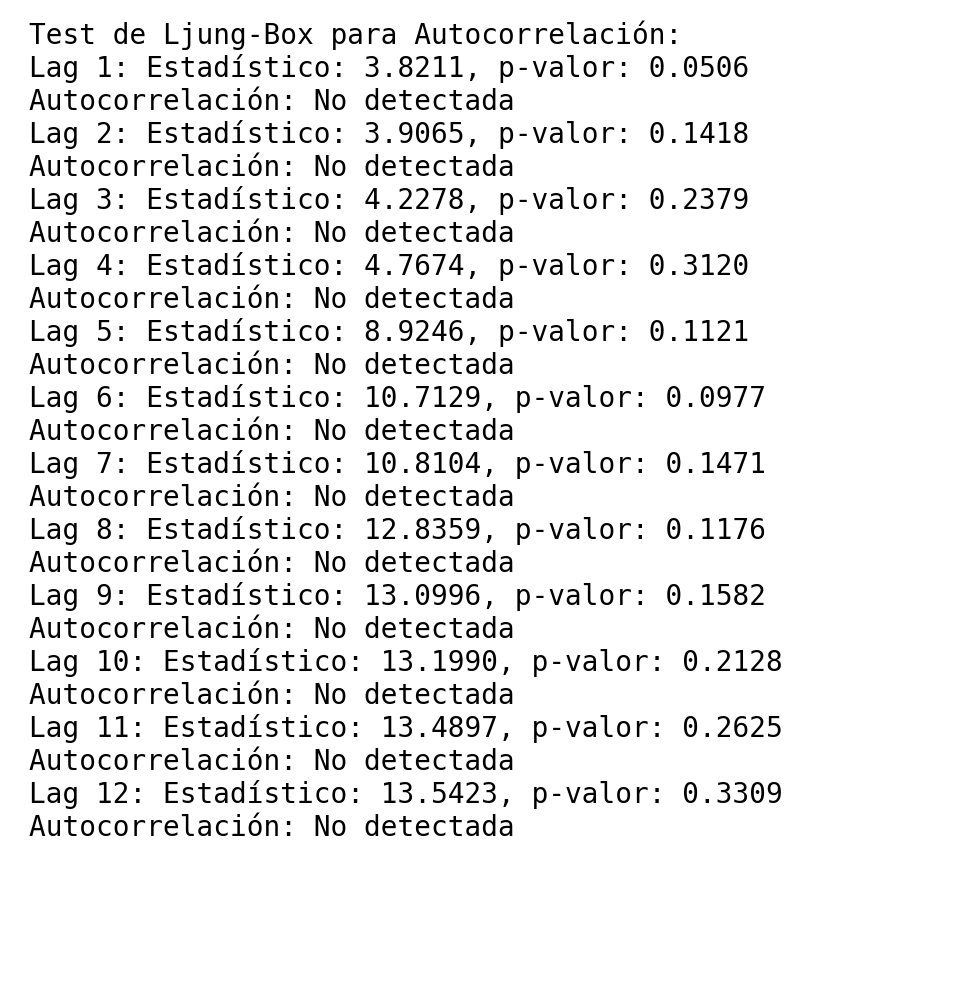

In [94]:
# 3. Análisis de Autocorrelación
# -----------------------------

# Test de Ljung-Box
lb_test = acorr_ljungbox(returns['residuos_modelo_final'], lags=12)  # 12 lags para datos mensuales

print(f"Test de Ljung-Box para Autocorrelación:")
for i, row in lb_test.iterrows():
        print(f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}")
        print(f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}")
        

# crear imagen 
texto_salida = "Test de Ljung-Box para Autocorrelación:\n"

for i, row in lb_test.iterrows():
    texto_salida += f"Lag {i}: Estadístico: {row['lb_stat']:.4f}, p-valor: {row['lb_pvalue']:.4f}\n"
    texto_salida += f"Autocorrelación: {'Presente' if any(p < 0.05 for p in lb_test['lb_pvalue']) else 'No detectada'}\n"

plt.rc('figure', figsize=(5, 5), dpi=200)
plt.text(0.01, 0.99, texto_salida, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/LjunBox_capm_modelo_final.png')


<Figure size 2400x1200 with 0 Axes>

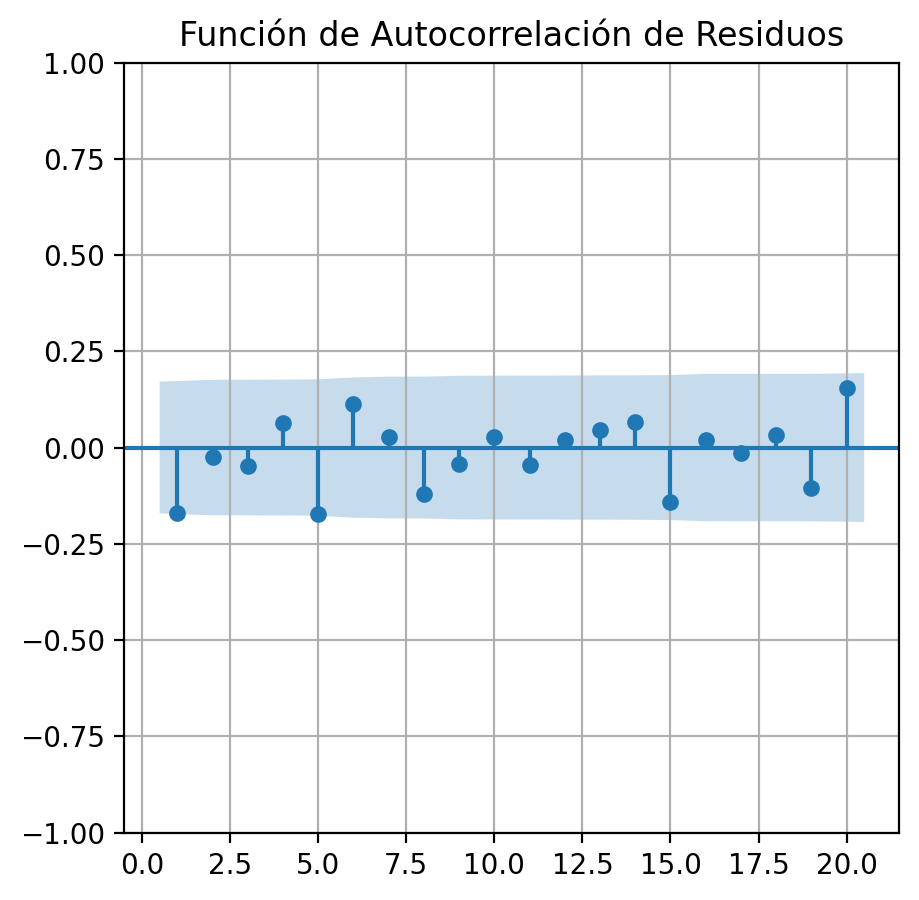

<Figure size 2400x1200 with 0 Axes>

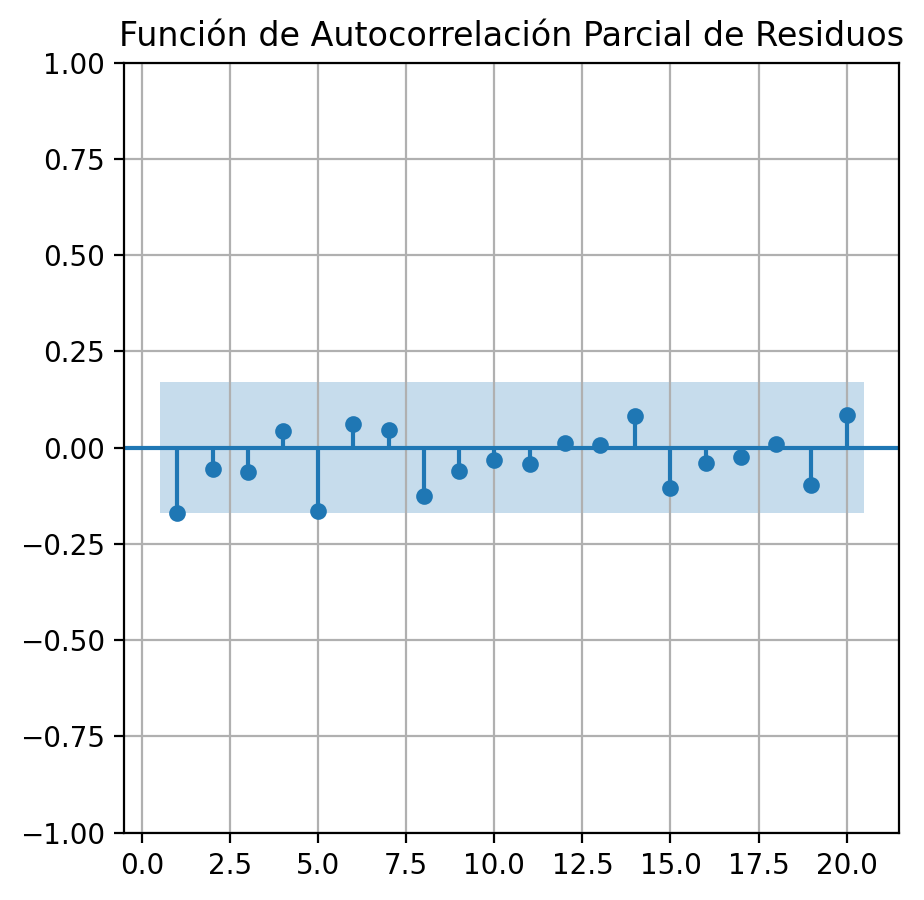

In [95]:
# Función de autocorrelación (ACF)
plt.figure(figsize=(12, 6))
plot_acf(returns['residuos_modelo_final'], lags=20, alpha=0.05, zero=False, title='Función de Autocorrelación de Residuos')
plt.grid(True)
plt.savefig('output/residuos_modelo_final_acf.png') # grabar el grafico
plt.show()

# Función de autocorrelación parcial (PACF)
plt.figure(figsize=(12, 6))
plot_pacf(returns['residuos_modelo_final'], lags=20, alpha=0.05, zero=False,title='Función de Autocorrelación Parcial de Residuos')
plt.grid(True)
plt.savefig('output/residuos_modelo_final_pacf.png') # grabar el grafic
plt.show()

#### <font color='ORANGE'>Tests de Validación del Modelo CAPM Final</font>

El modelo CAPM establece dos condiciones teóricas centrales:
1. **α = 0**: no existe rentabilidad anormal. Yelp no genera ni destruye valor sistemáticamente más allá del riesgo de mercado.
2. **β_efectiva = 1**: Yelp tiene el mismo riesgo sistemático que el mercado de referencia.

Se contrastan ambas condiciones individualmente y de forma conjunta.

**Test t: H₀: α = 0 (constante nula)**

Se contrasta formalmente si la constante del modelo es estadísticamente igual a cero. La no significatividad del intercepto es consistente con el CAPM teórico, que predice que toda la rentabilidad esperada proviene del riesgo sistemático.

Test Constante = 0
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0            -0.0121      0.008     -1.565      0.118      -0.027       0.003


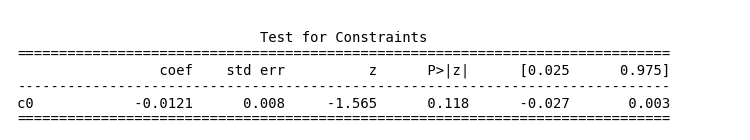

In [96]:
test_const = modelo_capm_newey_west_outlier_self_service_2.t_test('Intercept = 0')  # O 'const = 0'
print("Test Constante = 0")
print(test_const)

plt.rc('figure', figsize=(8, 1.5), dpi=100)
plt.text(0.01, 0.05, test_const, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/test_const.png')

**Conclusión del test sobre la constante:** No se rechaza H₀: α = 0. La constante no es significativamente distinta de cero, lo que implica que **Yelp no genera rentabilidad anormal** (alpha de Jensen nulo). Este resultado es coherente con la eficiencia de mercado: toda la información disponible sobre Yelp está incorporada en el precio.

**Test F: H₀: β_efectiva = 1 (beta unitaria post-self-service)**

Se contrasta si la beta efectiva de Yelp en el período posterior al cambio estructural ($\beta_0 + \delta$) es estadísticamente igual a 1, es decir, si Yelp tiene el mismo riesgo sistemático que el Russell 2000.

<F test: F=8.765369229186895, p=0.003674466982182805, df_denom=125, df_num=1>


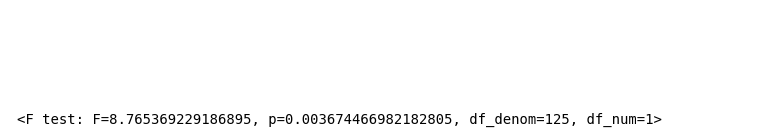

In [97]:
# Contrastar el CAPM y la eficiencia de mercado y igual riesgo que el mercado
# Test F conjunto: H0: Market Premium = 1

restricciones = "(returns['Market Premium']+returns['self_service']:returns['Market Premium']) = 1"

f_test = modelo_capm_newey_west_outlier_self_service_2.f_test(restricciones)

print(f_test)

plt.rc('figure', figsize=(8, 1.5), dpi=100)
plt.text(0.01, 0.05, f_test, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/f_test.png')

**Conclusión del test sobre la beta:** El resultado del test F permite rechazar la hipótesis nula al 5%. Por tanto, existe evidencia estadística de que la beta de Yelp es significativamente distinta de la unidad tras el cambio. 

**Test F conjunto: H₀: α = 0 y β_efectiva = 1**

Se contrastan simultáneamente la ausencia de rentabilidad anormal y la beta unitaria. Este es el test más completo de la validez del CAPM como modelo para Yelp.

<F test: F=5.084859208843957, p=0.007532042212921109, df_denom=125, df_num=2>


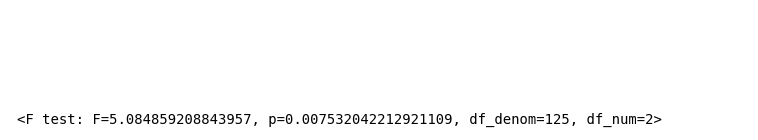

In [98]:
# Contrastar el CAPM y la eficiencia de mercado y igual riesgo que el mercado
# Test F conjunto: H0: Intercept = 0 y Market Premium = 1

restricciones = "Intercept = 0, (returns['Market Premium']+returns['self_service']:returns['Market Premium']) = 1"

f_test = modelo_capm_newey_west_outlier_self_service_2.f_test(restricciones)

print(f_test)

plt.rc('figure', figsize=(8, 1.5), dpi=100)
plt.text(0.01, 0.05, f_test, {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/f_test_2.png')

**Conclusión de los tests sobre la beta y constante:** **H₀ conjunta → Se rechaza** (principalmente por el rechazo de β = 1).

**Implicación práctica:** El CAPM es válido en cuanto a la ausencia de rentabilidad anormal (α = 0 no rechazado), pero la beta de Yelp es significativamente distinta de 1, haciendo necesario estimarla explícitamente para valorar correctamente el activo o gestionar su riesgo en cartera.

**Usos del modelo final en la práctica econométrica:**

El modelo estimado permite realizar los siguientes análisis:
- **Análisis estructural** (α y β): realizado a lo largo del TFG.
- **Predicción fuera de muestra**: no es viable, ya que la beta depende del régimen y los eventos atípicos son impredecibles.
- **Análisis de escenarios**: se puede calcular la rentabilidad esperada de Yelp para distintos escenarios de mercado:
$$E[r_{YELP}] - r_f = \hat{\alpha} + (\hat{\beta}_0 + \hat{\delta}) \cdot E[PM]$$
aproximando $E[PM]$ por la media histórica de la prima de mercado.

Se muestran los coeficientes estimados del modelo final: la constante (alpha), la beta de mercado base ($\beta_0$), los tres coeficientes de intervención ($\gamma_1, \gamma_2, \gamma_3$) y el cambio estructural en la beta del self-service ($\delta$).

In [89]:
modelo_capm_newey_west_outlier_self_service_2.params

Intercept                                           -0.012076
returns['Market Premium']                            1.456616
returns['intervencion1']                            -0.458611
returns['intervencion2']                             0.302620
returns['intervencion3']                             0.252258
returns['self_service']:returns['Market Premium']   -0.904550
dtype: float64

**Cálculo de la rentabilidad anualizada esperada de Yelp bajo el modelo final:**

La rentabilidad mensual esperada se obtiene multiplicando la beta efectiva post-*self-service* ($\beta_0 + \delta$) por la prima de mercado media histórica mensual. Multiplicando por 12 se obtiene la estimación anualizada, que representa la **prima de riesgo anual que el mercado exige a Yelp** dado su nivel de riesgo sistemático actual.

In [90]:
((modelo_capm_newey_west_outlier_self_service_2.params[1]+modelo_capm_newey_west_outlier_self_service_2.params[5])*returns['Market Premium'].mean())*12

0.02765587968107972

### <font color='red'>S06: Análisis de Estabilidad Paramétrica</font>

El análisis de estabilidad paramétrica evalúa si los coeficientes del modelo son **constantes a lo largo del tiempo** o evolucionan de forma continua. La técnica de estimación recursiva añade secuencialmente una observación en cada iteración y reestima el modelo, permitiendo visualizar la trayectoria de cada parámetro.

Se utiliza el modelo de Fama-French de tres factores (`modelo_3FF`) como base para el análisis de estabilidad, ya que incluye todos los regresores relevantes y permite evaluar también la estabilidad de los factores SMB y HML.

Se estima el modelo de Fama-French completo sobre la **muestra total** para obtener los coeficientes de referencia estáticos. Estos coeficientes se usarán para verificar que las estimaciones recursivas convergen hacia ellos al final de la muestra, confirmando la estabilidad del procedimiento.

In [99]:
# Escogemos el modelo_3FF creado anteriormente
modelo_3FF= sm.OLS.from_formula("returns['YELP Premium'] ~ returns['Market Premium'] +  returns['intervencion1']+returns['intervencion2']+returns['intervencion3']+ returns['self_service']: returns['Market Premium']+returns['SMB']+returns['HML']", data=returns).fit(cov_type='HAC', cov_kwds={'maxlags':1})
modelo_3FF.summary()

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 5
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     returns['YELP Premium']   R-squared:                       0.495
Model:                                 OLS   Adj. R-squared:                  0.467
Method:                      Least Squares   F-statistic:                     40.66
Date:                     Wed, 20 May 2026   Prob (F-statistic):           1.63e-24
Time:                             21:46:47   Log-Likelihood:                 125.00
No. Observations:                      131   AIC:                            -234.0
Df Residuals:                          123   BIC:                            -211.0
Df Model:                                7                                         
Covariance Type:                       HAC                                         
=====================================================================================================================
                                                        coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------
Intercept                                            -0.0105      0.008     -1.341      0.180      -0.026       0.005
returns['Market Premium']                             1.2933      0.314      4.120      0.000       0.678       1.909
returns['intervencion1']                             -0.4351      0.017    -25.678      0.000      -0.468      -0.402
returns['intervencion2']                              0.3100      0.011     29.001      0.000       0.289       0.331
returns['intervencion3']                              0.2447      0.048      5.096      0.000       0.151       0.339
returns['self_service']:returns['Market Premium']    -0.9207      0.325     -2.830      0.005      -1.558      -0.283
returns['SMB']                                        0.5340      0.356      1.499      0.134      -0.164       1.232
returns['HML']                                        0.1149      0.212      0.542      0.588      -0.301       0.530
==============================================================================
Omnibus:                        0.338   Durbin-Watson:                   2.298
Prob(Omnibus):                  0.845   Jarque-Bera (JB):                0.087
Skew:                          -0.017   Prob(JB):                        0.958
Kurtosis:                       3.122   Cond. No.                         50.8
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity and autocorrelation robust (HAC) using 1 lags and without small sample correction
"""

In [100]:
returns['Self_service_CE']=returns['self_service']*returns['Market Premium']

La variable de interacción `Self_service_CE = self_service × Market Premium` se crea explícitamente como columna del DataFrame para poder incluirla directamente como regresor en el análisis recursivo sin necesidad de la sintaxis de fórmula de `statsmodels`.

Se seleccionan las columnas necesarias para el análisis recursivo y se eliminan las observaciones con NaN. Es fundamental partir de un conjunto de datos limpio y completo, ya que cada iteración recursiva debe poder estimar el modelo con la misma estructura de variables.

In [101]:
columnas_modelo = [
    'YELP Premium',
    'Market Premium',
    'SMB',
    'HML',
    'intervencion1',
    'intervencion2',
    'intervencion3',
    'Self_service_CE'
]

datos = returns[columnas_modelo].dropna().copy()
print('Numero de observaciones utiles:', len(datos))
datos.head()

Numero de observaciones utiles: 131


,YELP Premium,Market Premium,SMB,HML,intervencion1,intervencion2,intervencion3,Self_service_CE
Date,,,,,,,,
2015-02-01,-0.089041,0.056694,0.0061,-0.0179,0,0,0,0.0
2015-03-01,-0.013634,0.015607,0.0305,-0.0038,0,0,0,0.0
2015-04-01,-0.184055,-0.026400,-0.0299,0.0180,0,0,0,-0.0
2015-05-01,0.195812,0.021406,0.0095,-0.0111,0,0,0,0.0
2015-06-01,-0.107427,0.005935,0.0294,-0.0082,0,0,0,0.0


Se estima el modelo FF3 completo con `add_constant` y covarianza robusta HAC. El resumen de este modelo es la **estimación estática de referencia** con la que se compararán los resultados recursivos.

c:\Users\aqhue\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 5
  warnings.warn('covariance of constraints does not have full '


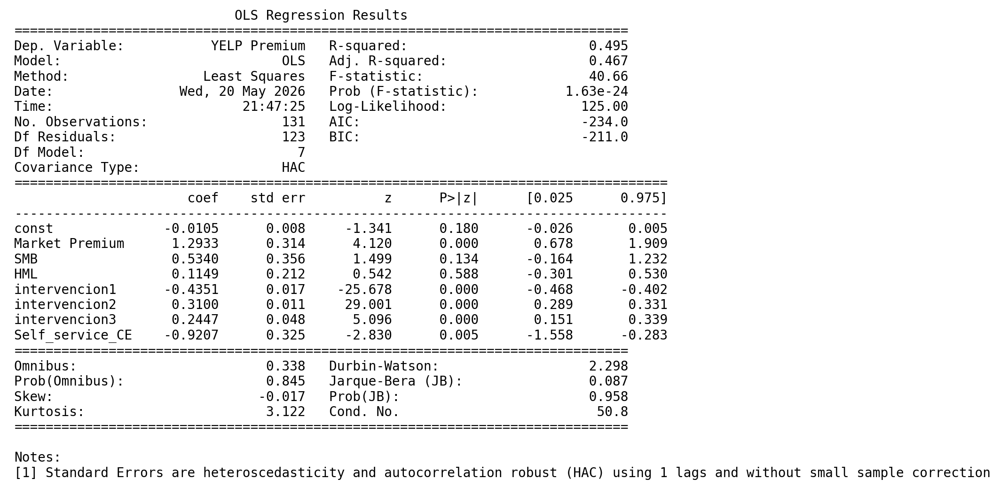

In [102]:
y = datos['YELP Premium']
X = sm.add_constant(datos[['Market Premium', 'SMB', 'HML', 'intervencion1', 'intervencion2','intervencion3', 'Self_service_CE']])

modelo_ff3_completo = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': 1})
modelo_ff3_completo.summary()


plt.rc('figure', figsize=(9, 5), dpi=200)
plt.text(0.01, 0.05, modelo_ff3_completo.summary(), {'fontsize': 10}, fontproperties = 'monospace')
plt.axis('off')
plt.tight_layout()
plt.savefig('output/modelo_ff3_completo.png')

**Función de estimación recursiva `estimacion_recursiva_con_ic`:**

En cada iteración, la función:
1. Toma la submuestra creciente desde la primera observación hasta la iteración actual.
2. Estima el modelo con covarianza robusta HAC.
3. Guarda los coeficientes e intervalos de confianza al 95% para cada parámetro.

El mínimo de 60 observaciones garantiza suficiente grado de libertad en las primeras estimaciones.

In [103]:
def estimacion_recursiva_con_ic(df, y_col, x_cols, min_obs=60):
    resultados = []

    for fin in range(min_obs, len(df) + 1):
        muestra = df.iloc[:fin].copy()
        y = muestra[y_col]
        X = sm.add_constant(muestra[x_cols])

        modelo = sm.OLS(y, X).fit(cov_type='HAC', cov_kwds={'maxlags': 1})
        ic = modelo.conf_int(alpha=0.05)

        fila = {'fecha': muestra.index[-1], 'n_obs': len(muestra), 'r2_ajustado': modelo.rsquared_adj}

        for parametro in modelo.params.index:
            fila[parametro] = modelo.params[parametro]
            fila[f'{parametro}_li'] = ic.loc[parametro, 0]
            fila[f'{parametro}_ls'] = ic.loc[parametro, 1]

        resultados.append(fila)

    return pd.DataFrame(resultados).set_index('fecha')

In [104]:
resultados_recursivos = estimacion_recursiva_con_ic(
    df=datos,
    y_col='YELP Premium',
    x_cols=['Market Premium', 'SMB', 'HML', 'intervencion1', 'intervencion2','intervencion3', 'Self_service_CE'],
    min_obs=60
)

resultados_recursivos.head()

,n_obs,r2_ajustado,const,const_li,const_ls,Market Premium,Market Premium_li,Market Premium_ls,SMB,SMB_li,...,intervencion1_ls,intervencion2,intervencion2_li,intervencion2_ls,intervencion3,intervencion3_li,intervencion3_ls,Self_service_CE,Self_service_CE_li,Self_service_CE_ls
fecha,,,,,,,,,,,,,,,,,,,,,
2020-01-01,60,0.386719,-0.009515,-0.035926,0.016895,0.914511,-0.033515,1.862537,1.155436,-0.484386,...,-0.366618,0.307220,0.273516,0.340924,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-01,61,0.387593,-0.008913,-0.034286,0.016461,0.879373,0.054540,1.704206,1.211618,-0.262161,...,-0.366511,0.306628,0.273638,0.339619,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-01,62,0.470169,-0.011447,-0.036751,0.013857,1.203994,0.427024,1.980964,0.987611,-0.417402,...,-0.346940,0.319713,0.286270,0.353156,0.0,0.0,0.0,0.0,0.0,0.0
2020-04-01,63,0.487265,-0.010905,-0.035891,0.014080,1.245573,0.513711,1.977435,0.969741,-0.438315,...,-0.351094,0.318753,0.286270,0.351237,0.0,0.0,0.0,0.0,0.0,0.0
2020-05-01,64,0.480896,-0.011839,-0.036811,0.013132,1.204800,0.491577,1.918024,0.934368,-0.461464,...,-0.348520,0.320789,0.288815,0.352764,0.0,0.0,0.0,0.0,0.0,0.0


El resultado es un DataFrame con los coeficientes e intervalos de confianza para cada tamaño muestral. La trayectoria temporal de cada coeficiente revela si los parámetros son estables o varían de forma continua.

Se verifican las últimas filas del DataFrame recursivo: si los coeficientes de la última iteración coinciden con los de la estimación estática, el procedimiento es consistente y la convergencia está confirmada.

In [105]:
resultados_recursivos.tail()

,n_obs,r2_ajustado,const,const_li,const_ls,Market Premium,Market Premium_li,Market Premium_ls,SMB,SMB_li,...,intervencion1_ls,intervencion2,intervencion2_li,intervencion2_ls,intervencion3,intervencion3_li,intervencion3_ls,Self_service_CE,Self_service_CE_li,Self_service_CE_ls
fecha,,,,,,,,,,,,,,,,,,,,,
2025-08-01,127,0.472612,-0.010305,-0.025996,0.005385,1.279200,0.665828,1.892573,0.566416,-0.141731,...,-0.398757,0.310764,0.289341,0.332187,0.244310,0.150577,0.338042,-0.915599,-1.552051,-0.279146
2025-09-01,128,0.472879,-0.010330,-0.025936,0.005276,1.278760,0.665998,1.891522,0.568046,-0.133276,...,-0.399216,0.310815,0.289640,0.331989,0.244308,0.150579,0.338037,-0.916181,-1.552034,-0.280328
2025-10-01,129,0.471867,-0.009859,-0.025377,0.005658,1.283288,0.668820,1.897757,0.555448,-0.145522,...,-0.400877,0.309968,0.288943,0.330992,0.244039,0.150019,0.338059,-0.911561,-1.548382,-0.274739
2025-11-01,130,0.467631,-0.011007,-0.026493,0.004480,1.294626,0.678756,1.910496,0.537800,-0.159381,...,-0.401668,0.310359,0.289361,0.331358,0.244927,0.150750,0.339105,-0.918933,-1.557223,-0.280643
2025-12-01,131,0.466581,-0.010498,-0.025841,0.004844,1.293310,0.677988,1.908632,0.533966,-0.164253,...,-0.401929,0.309968,0.289020,0.330917,0.244664,0.150556,0.338773,-0.920683,-1.558411,-0.282954


**Función `graficar_coeficiente_con_ic`:**

Para cada parámetro, representa la evolución del coeficiente estimado (línea sólida) y el intervalo de confianza al 95% (banda sombreada). Si el coeficiente es estable y el cero queda fuera de la banda (para parámetros significativos como la beta de mercado), la estabilidad queda confirmada.

In [106]:
def graficar_coeficiente_con_ic(resultados, coeficiente, titulo, ylabel, color):
    fig, ax = plt.subplots(figsize=(12, 4.5))

    ax.plot(resultados.index, resultados[coeficiente], color=color, linewidth=2, label='Estimacion')
    ax.fill_between(
        resultados.index,
        resultados[f'{coeficiente}_li'],
        resultados[f'{coeficiente}_ls'],
        color=color,
        alpha=0.20,
        label='IC 95%'
    )
    ax.axhline(0, color='gray', linestyle='--', linewidth=1)
    ax.set_title(titulo)
    ax.set_ylabel(ylabel)
    ax.set_xlabel('Fecha')
    ax.legend()
    plt.tight_layout()
    plt.show()

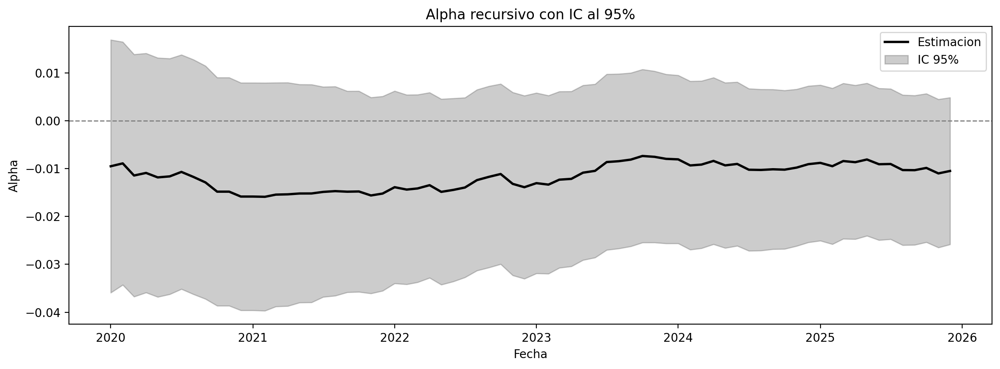

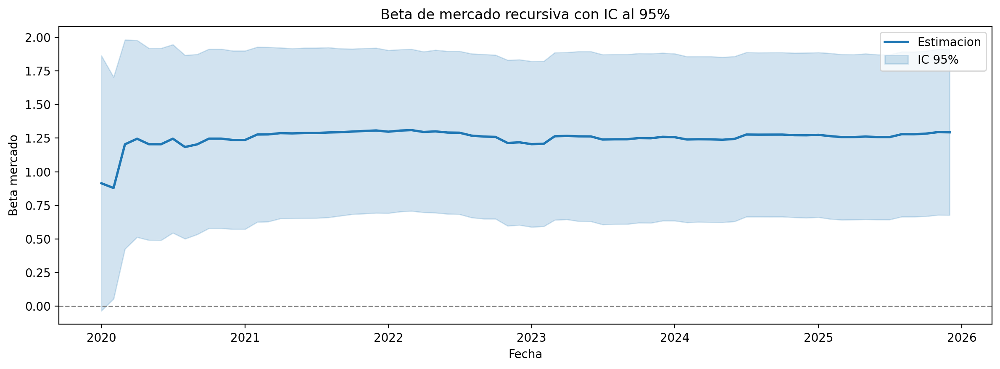

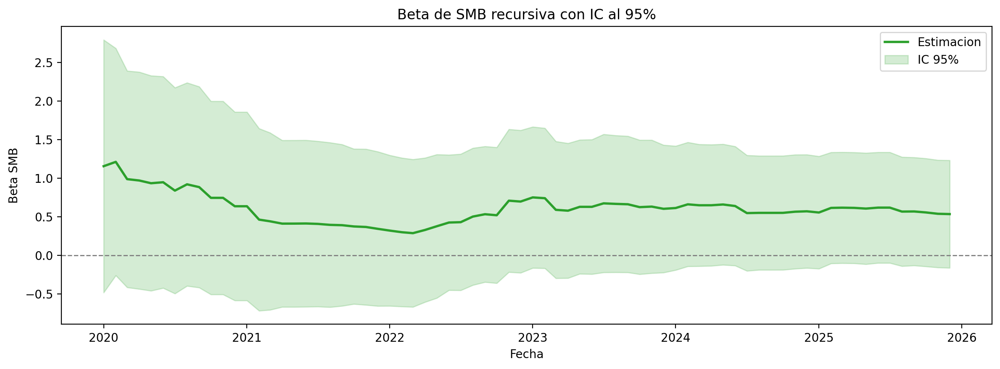

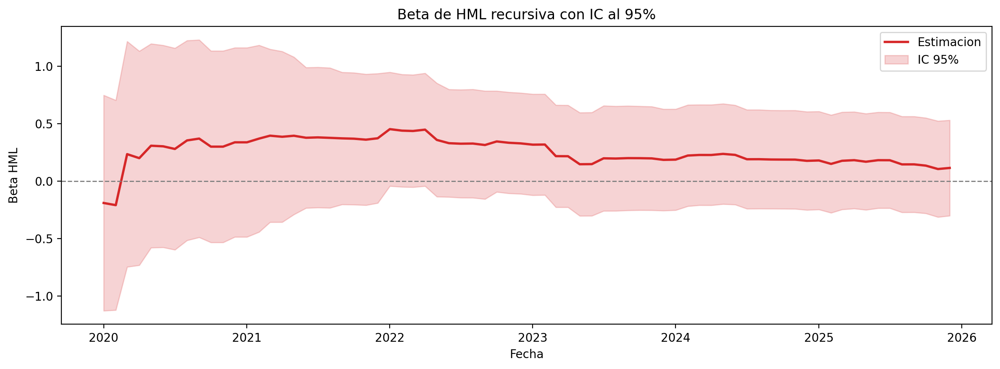

In [107]:
graficar_coeficiente_con_ic(resultados_recursivos, 'const', 'Alpha recursivo con IC al 95%', 'Alpha', 'black')
graficar_coeficiente_con_ic(resultados_recursivos, 'Market Premium', 'Beta de mercado recursiva con IC al 95%', 'Beta mercado', 'tab:blue')
graficar_coeficiente_con_ic(resultados_recursivos, 'SMB', 'Beta de SMB recursiva con IC al 95%', 'Beta SMB', 'tab:green')
graficar_coeficiente_con_ic(resultados_recursivos, 'HML', 'Beta de HML recursiva con IC al 95%', 'Beta HML', 'tab:red')

**Conclusión del análisis recursivo:**

- **Alpha (constante)**: no significativo en ningún momento.
- **Beta de mercado**: **único parámetro significativo y estable**. La banda excluye el cero consistentemente, confirmando la existencia de riesgo sistemático robusto y persistente.
- **SMB**: no significativo. Su intervalo cruza el cero de forma sistemática.
- **HML**: no significativo. Igual que el SMB.

**Implicación metodológica:** El análisis recursivo refuerza la decisión de mantener el CAPM (y no el modelo FF3) como especificación final.

In [108]:
parametros = ['const', 'Market Premium', 'SMB', 'HML', 'intervencion1', 'intervencion2','intervencion3', 'Self_service_CE']

comparacion = pd.DataFrame({
    'Estatica muestra completa': modelo_ff3_completo.params[parametros],
    'Ultima estimacion recursiva': resultados_recursivos[parametros].iloc[-1]
})

comparacion

,Estatica muestra completa,Ultima estimacion recursiva
const,-0.010498,-0.010498
Market Premium,1.293310,1.293310
SMB,0.533966,0.533966
HML,0.114928,0.114928
intervencion1,-0.435142,-0.435142
intervencion2,0.309968,0.309968
intervencion3,0.244664,0.244664
Self_service_CE,-0.920683,-0.920683


**Conclusión final del análisis de estabilidad:**

La comparación entre la estimación estática y la última iteración recursiva muestra **convergencia completa** de todos los coeficientes, validando tanto el procedimiento recursivo como la estabilidad paramétrica del modelo seleccionado.


## Conclusiones Generales del TFG

1. **Beta de Yelp: Dos regímenes diferenciados:**
   - *Pre-2021*: beta ≈ 1,47 → activo cíclico, amplifica los movimientos del Russell 2000.
   - *Post-2021* (self-service): beta ≈ 0,55 → activo defensivo, menos sensible al ciclo de mercado.
   - El cambio estructural es significativo al 1% y tiene una interpretación económica sólida: la transición hacia un modelo de plataforma reduce la ciclicidad del negocio.

2. **Alpha de Jensen:** No significativo en ninguna especificación. Yelp no genera rentabilidad anormal, resultado consistente con la eficiencia de mercado en forma semifuerte.

3. **Cambios estructurales:** El único cambio estructural estadísticamente significativo es la consolidación del modelo *self-service* (enero 2021). El COVID-19, el giro hacia servicios (2019) y la integración de IA (2023) no producen cambios permanentes robustos en los parámetros.

4. **Factores de Fama-French:** Ni el SMB ni el HML son significativos. El CAPM es suficiente para explicar la prima de riesgo de Yelp; los factores adicionales de tamaño y valor no aportan información relevante.

5. **Robustez de la estimación:** Los errores de Newey-West y las variables de intervención garantizan que la inferencia sobre la beta sea válida y no esté contaminada por heterocedasticidad, autocorrelación ni valores atípicos.

6. **Rentabilidad esperada:** Bajo el modelo final, la rentabilidad anualizada esperada de Yelp se puede estimar como $12 \times (\hat{\beta}_0 + \hat{\delta}) \times \bar{PM}$, donde $\bar{PM}$ es la prima de mercado media histórica mensual.